In [1]:
import h5py
import pylab as pl
import numpy as np
import scipy.stats as sp
import matplotlib as mpl
import networkx
import progressbar
import astropy.cosmology as apc
import matplotlib.colors as mpc

In [2]:
def split_unique_id(unique_id):
    """Splits the ids assign to the subhalos by the merger tree code by snap number and subfind number """
    subfind_number = int(unique_id % 1e6)
    snap_number = int((unique_id - subfind_number) / 1e6)
    
    return snap_number, subfind_number

def get_main_branch_unique_ids(subtree, node):
    """Gets the unique ids of the subhalos belonging to the main branch of the selected subhalo (node)"""
    mpb = [node, ]
    i = 0
    while True:
        succesors = list(subtree.successors(node))
        if len(succesors) == 0:
            break
        node = succesors[0] # select only the first succesor (main branch)
        mpb.append(node)
        
    return mpb

In [3]:
pl.rc('font', size = 25)
pl.rc('legend', fontsize = 25)
#sim = h5py.File('/disk1/data1-casona/data1/cielo/simulations/LG1/LG1.hdf5', 'r')
#trees = networkx.read_multiline_adjlist('/disk1/data1-casona/data1/cielo/simulations/LG1/LG1_tree.dat')
sim = h5py.File('/disk1/lbignone/data/cielo/simulations/LG1/LG1.hdf5', 'r')
trees = networkx.read_multiline_adjlist('/disk1/lbignone/data/cielo/simulations/LG1/LG1_tree.dat')

In [4]:
Cosmo = apc.FlatLambdaCDM(H0=100, Om0=0.3175)

In [12]:
# a bunch of constants
UnitMass_in_g = 1.989e+43
UnitTime_in_s = 3.08568e+16
UnitVelocity_in_cm_per_s = 100000
UnitDensity_in_cgs = 6.7699e-22
UnitEnergy_in_cgs = 1.989e+53
GAMMA_MINUS1 = 2./3.
PROTONMASS = 1.6726e-24
BOLTZMANN = 1.3806e-16    

HMass = 1.00794
FeMass = 55.845
OMass = 15.9994
NfeNhe_sun = -4.5 # grevesse & saundall 98
NoNfe_sun = 1.33 # same

def tempFromMass(Mass, Abund, IE, ne1):
    XH = Abund[:,6]/Mass
    yHelium = (1. - XH)/(4.*XH)
    mu = (1 + 4.* yHelium)/ (1.+ yHelium + ne1 )
    temp = GAMMA_MINUS1 * IE * mu * 1.6726 / 1.3806 * 1.e-8 # / BOLTZMANN  * PROTONMASS
    temp = temp * 1e10 #   UnitEnergy_in_cgs / UnitMass_in_g;
    return temp

In [13]:
# ok, that doesn't tell me anything, lets see history of this, and then link with other stuff (SFR, los mass, that thing)

def getTemp(gal):
    
    z = []
    t95, t75, t50, t25, t5 = [], [], [], [], []

    uniqueID = int(127*1e6+gal)
    stree = networkx.dfs_tree(trees, str(uniqueID))
    mtree = get_main_branch_unique_ids(stree, str(uniqueID))

    
    for m in mtree:
        snap, idd = split_unique_id(int(m))
        
        VelGal = sim['SnapNumber_{}/SubGroups/SubGroupVel'.format(snap)][idd]

        galPos = sim['SnapNumber_{}/SubGroups/SubGroupPos'.format(snap)][idd]
        
        # other way
        AllP = sim['SnapNumber_{}/PartType0/Coordinates'.format(snap)][()]
        xi, yi, zi = AllP[:,0]-galPos[0], AllP[:,1]-galPos[1], AllP[:,2]-galPos[2]
        rr = np.sqrt(xi**2+yi**2+zi**2)
        inear = np.where(rr<100)[0]
        Loc = sim['SnapNumber_{}/PartType0/SubGroupNumber'.format(snap)][inear]
        ik = np.where(Loc==-1)[0]
        iknear = inear[ik]
        
        IE = sim['SnapNumber_{}/PartType0/InternalEnergy'.format(snap)][iknear]
        Mass = sim['SnapNumber_{}/PartType0/Masses'.format(snap)][iknear]
        Abund = sim['SnapNumber_{}/PartType0/Abundances'.format(snap)][iknear]
        ne1 = sim['SnapNumber_{}/PartType0/ElectronAbundance'.format(snap)][iknear]

        tTemp = tempFromMass(Mass, Abund, IE, ne1)
        
        zs = sim['SnapNumber_{}/Header/Redshift'.format(snap)][()]

        tperC = np.percentile(tTemp, [95, 75, 50, 25, 5])
        
        #ok, i thing i got what i need.
        z.append(zs)
        
        t95.append(tperC[0])
        t75.append(tperC[1])
        t50.append(tperC[2])
        t25.append(tperC[3])
        t5.append(tperC[4])

    z = np.array(z)
    
    t95, t75, t50, t25, t5 = np.array(t95), np.array(t75), np.array(t50), np.array(t25), np.array(t5)
    return z, t95, t75, t50, t25, t5

In [14]:
z, t95, t75, t50, t25, t5 = getTemp(4338)

Text(0, 0.5, 'log(Temperature/K)')

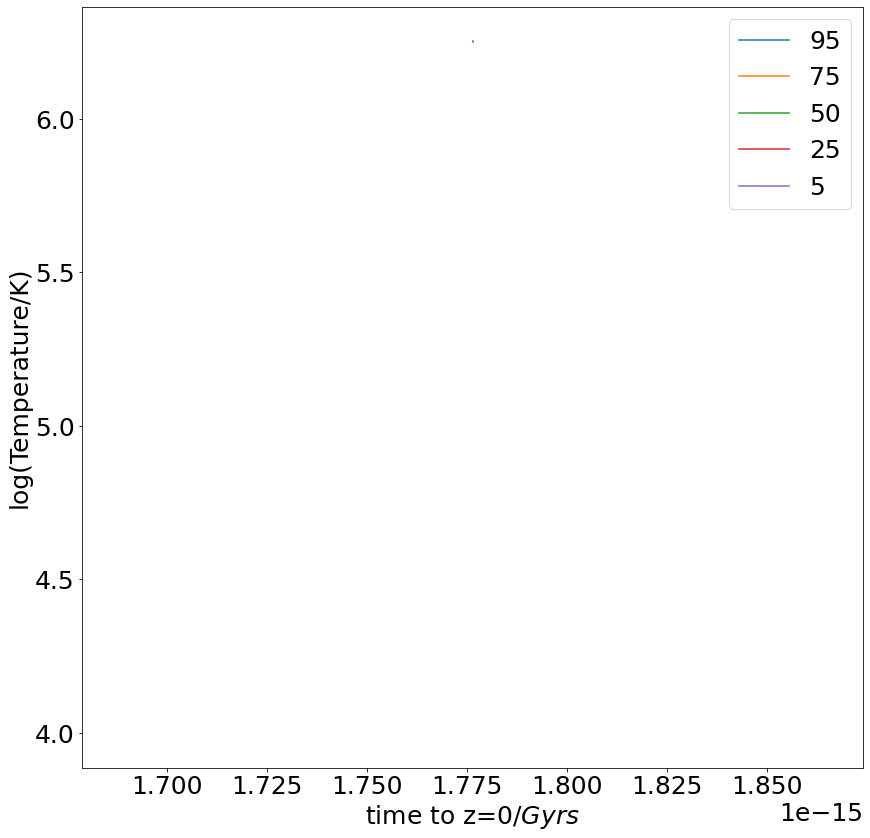

In [15]:
time = Cosmo.lookback_time(z).value

pl.figure(figsize=(14,14))

pl.plot(time, np.log10(t95), label='95')
pl.plot(time, np.log10(t75), label='75')
pl.plot(time, np.log10(t50), label='50')
pl.plot(time, np.log10(t25), label='25')
pl.plot(time, np.log10(t5), label='5')

pl.legend(loc='best')

pl.xlabel('time to z=0/$Gyrs$')
pl.ylabel('log(Temperature/K)')

In [16]:
z, t95, t75, t50, t25, t5 = getTemp(4474)

Text(0, 0.5, 'log(Temperature/K)')

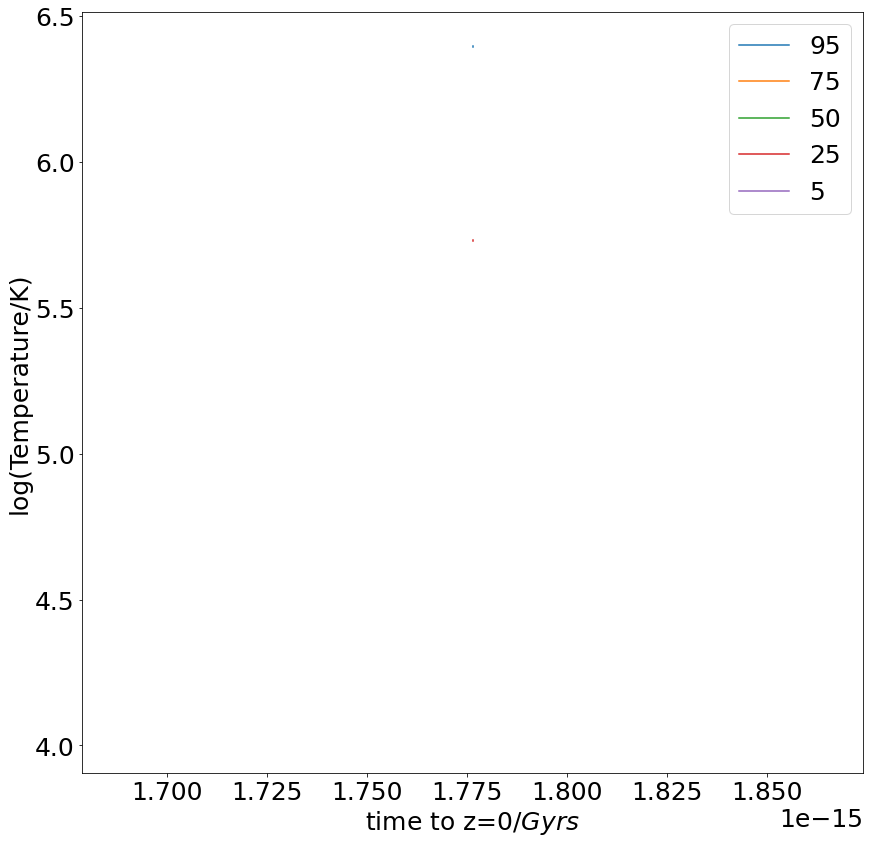

In [17]:
time = Cosmo.lookback_time(z).value

pl.figure(figsize=(14,14))

pl.plot(time, np.log10(t95), label='95')
pl.plot(time, np.log10(t75), label='75')
pl.plot(time, np.log10(t50), label='50')
pl.plot(time, np.log10(t25), label='25')
pl.plot(time, np.log10(t5), label='5')

pl.legend(loc='best')

pl.xlabel('time to z=0/$Gyrs$')
pl.ylabel('log(Temperature/K)')

In [18]:
#ok, now the serialized version of the get particles for each Satellite, lets see.
TdayTotalIDs = sim['SnapNumber_128/PartType0/ParticleIDs'][()] # need this first
I= np.identity(3) # and this

In [19]:
# ok, lets calculate some ram pressures with only hot gas densities, this will be reduced a lot
Msun = 1.988*1e30
kpc = 3.086*1e19


def getSFRs(gal, central):
    
    RPS, z, SFR, snaplist, dist, RestForce, DE = [], [], [], [], [], [], []
    GasMass, StarMass = [], []
    FeHL, OFeL = [], []
    
    Idlist, snapst  = [], []
    
    uniqueID = int(128*1e6+gal)
    stree = networkx.dfs_tree(trees, str(uniqueID))
    mtree = get_main_branch_unique_ids(stree, str(uniqueID))
    
    uniqueIDC = int(128*1e6+central)
    streeC = networkx.dfs_tree(trees, str(uniqueIDC))
    mtreeC = get_main_branch_unique_ids(streeC, str(uniqueIDC))
    
    z2, z1 = -1., -1.
    
    for m, mC in zip(mtree, mtreeC):
        snap, idd = split_unique_id(int(m))
        snap, iddC = split_unique_id(int(mC))
        
        group = sim['SnapNumber_{}/SubGroups/GroupNumber'.format(snap)][iddC]
        groupPos = sim['SnapNumber_{}/SubGroups/SubGroupPos'.format(snap)][iddC]
        r200 = sim['SnapNumber_{}/Groups/Group_R_Crit200'.format(snap)][group]

#         OGas = sim['SnapNumber_{}/Groups/PartType0/Offsets'.format(snap)][group].astype('int')
#         Densities = sim['SnapNumber_{}/PartType0/Density'.format(snap)][OGas[0]:OGas[1]]
#         Positions = sim['SnapNumber_{}/PartType0/Coordinates'.format(snap)][OGas[0]:OGas[1]]

#         Loc = sim['SnapNumber_{}/PartType0/SubGroupNumber'.format(snap)][OGas[0]:OGas[1]]

#         i = np.where(Loc==-1)

#         Densities = Densities[i]
#         Positions = Positions[i]
        
#         X, Y, Z = Positions[:,0] - groupPos[0], Positions[:,1] - groupPos[1], Positions[:,2] - groupPos[2]
#         R = np.sqrt(X**2+Y**2+Z**2)/r200

#         rmed1, redges, rbins = sp.binned_statistic(R, Densities*1e10, statistic='median', bins=20, range=(0, 5))
#         rx = 0.5*(redges[:-1]+redges[1:])
        
#         i = np.where(np.isnan(rmed1)==True)
#         rmed1[i] = 0.

#         GroupDens = rmed1*Msun/(kpc**3.)
        
        # ok, lets measure the ram pressure

        VelCen = sim['SnapNumber_{}/SubGroups/SubGroupVel'.format(snap)][iddC]
        VelGal = sim['SnapNumber_{}/SubGroups/SubGroupVel'.format(snap)][idd]

        Vel = np.sqrt(np.sum((VelGal - VelCen)**2.))*1e3 # in m/s

        galPos = sim['SnapNumber_{}/SubGroups/SubGroupPos'.format(snap)][idd]

        pos = np.sqrt(np.sum((galPos-groupPos)**2))/r200
        
#         DensGal = np.interp(pos, rx, GroupDens)

#         rpsEst = DensGal*Vel**2.
        
        # other way
        AllP = sim['SnapNumber_{}/PartType0/Coordinates'.format(snap)][()]
        xi, yi, zi = AllP[:,0]-galPos[0], AllP[:,1]-galPos[1], AllP[:,2]-galPos[2]
        rr = np.sqrt(xi**2+yi**2+zi**2)
        inear = np.where(rr<100)[0]
        Loc = sim['SnapNumber_{}/PartType0/SubGroupNumber'.format(snap)][inear]
        ik = np.where(Loc==-1)[0]
        iknear = inear[ik]
        #Densities = sim['SnapNumber_{}/PartType0/Density'.format(snap)][iknear]
        
        IE = sim['SnapNumber_{}/PartType0/InternalEnergy'.format(snap)][iknear]
        Mass = sim['SnapNumber_{}/PartType0/Masses'.format(snap)][iknear]
        Abund = sim['SnapNumber_{}/PartType0/Abundances'.format(snap)][iknear]
        ne1 = sim['SnapNumber_{}/PartType0/ElectronAbundance'.format(snap)][iknear]

        tTemp = tempFromMass(Mass, Abund, IE, ne1)
        iT = np.where(tTemp>1e6)[0]
        ikTnear = iknear[iT]
        NoMasses = sim['SnapNumber_{}/PartType0/Masses'.format(snap)][ikTnear]
        Vol = 3/.4*np.pi*100**3.
        Densities = np.sum(NoMasses)*1e10/Vol
        
        DensGal = Densities*Msun/(kpc**3.)
        
        DE.append(DensGal)
        
        rpsEst = DensGal*Vel**2.
        
        GasOff = sim['SnapNumber_{}/SubGroups/PartType0/Offsets'.format(snap)][idd].astype('int')
        StarOff = sim['SnapNumber_{}/SubGroups/PartType4/Offsets'.format(snap)][idd].astype('int')

        gaspos = sim['SnapNumber_{}/PartType0/Coordinates'.format(snap)][GasOff[0]:GasOff[1]]
        starpos = sim['SnapNumber_{}/PartType4/Coordinates'.format(snap)][StarOff[0]:StarOff[1]]

        nindgas = np.array(range(GasOff[0], GasOff[1]))
        nindstars = np.array(range(StarOff[0], StarOff[1]))

        xg, yg, zg = gaspos[:,0]-galPos[0], gaspos[:,1]-galPos[1], gaspos[:,2]-galPos[2]
        xs, ys, zs = starpos[:,0]-galPos[0], starpos[:,1]-galPos[1], starpos[:,2]-galPos[2]

        rg = np.sqrt(xg**2+yg**2+zg**2)
        rs = np.sqrt(xs**2+ys**2+zs**2)

        rad = sim['SnapNumber_{}/SubGroups/OpticalRadius'.format(snap)][idd]
        ig = np.where(rg<=rad)[0]
        iss = np.where(rs<=rad)[0]

        naregas = nindgas[ig]
        narestars = nindstars[iss]

        Area = np.pi*rad**2.

        MassGas = sim['SnapNumber_{}/PartType0/Masses'.format(snap)][naregas]
        MassStars = sim['SnapNumber_{}/PartType4/Masses'.format(snap)][narestars]

        SigmaGas = np.sum(MassGas)*1e10/Area
        SigmaStars = np.sum(MassStars)*1e10/Area

        G = 4.3*1e-6 # kpc/M_sun km^2/s^2

        Rest = 2*np.pi*G*SigmaGas*SigmaStars
        RestU = Rest*1e3*Msun/(kpc**3)
        
        offgal = sim['SnapNumber_{}/SubGroups/PartType0/Offsets'.format(snap)][idd].astype('int')
        
        sfr = sim['SnapNumber_{}/PartType0/StarFormationRate'.format(snap)][offgal[0]:offgal[1]]
        massGas = sim['SnapNumber_{}/PartType0/Masses'.format(snap)][offgal[0]:offgal[1]]
        PosPart = sim['SnapNumber_{}/PartType0/Coordinates'.format(snap)][offgal[0]:offgal[1]]
        OptRad = sim['SnapNumber_{}/SubGroups/OpticalRadius'.format(snap)][idd]
        
        xTc, yTc, zTc = PosPart[:,0]-galPos[0], PosPart[:,1]-galPos[1], PosPart[:,2]-galPos[2]
        distT = np.sqrt(xTc**2.+yTc**2.+zTc**2.)
        icoun = np.where(distT<=OptRad)[0]
        
        TSFR = np.sum(sfr[icoun])
        
        zs = sim['SnapNumber_{}/Header/Redshift'.format(snap)][()]
        
        if pos<2.:
            z2 = zs
        if pos<1.:
            z1 = zs
        
        #ok, i thing i got what i need.
        Abund2 = sim['SnapNumber_{}/PartType0/Abundances'.format(snap)][offgal[0]:offgal[1]]
        TFeH = np.log10((Abund2[:,4]/FeMass)/(Abund2[:,6]/HMass)) - NfeNhe_sun
        TOFe = np.log10((Abund2[:,3]/OMass)/(Abund2[:,4]/FeMass)) - NoNfe_sun

        FeHL.extend(list(TFeH))
        OFeL.extend(list(TOFe))
        
#         RPS.append(rpsEst/RestU)
        RPS.append(rpsEst)
        RestForce.append(RestU)
        z.append(zs)
        SFR.append(TSFR)
        snaplist.append(snap)
        dist.append(pos)
        GasMass.append(np.sum(MassGas)*1e10)
        StarMass.append(np.sum(MassStars)*1e10)
    
        # and now lost masses
        tempIds = sim['SnapNumber_{}/PartType0/ParticleIDs'.format(snap)][offgal[0]:offgal[1]]
        
        Idlist.extend(list(tempIds))
        snapst.extend([snap]*tempIds.size)
        
    RPS, z, SFR, snaplist, dist = np.array(RPS), np.array(z), np.array(SFR), np.array(snaplist), np.array(dist)
    RestForce = np.array(RestForce)
    FeHL, OFeL = np.array(FeHL), np.array(OFeL)
    DE = np.array(DE)
    
    GasMass = np.array(GasMass)
    StarMass = np.array(StarMass)
    
    Idlist = np.array(Idlist)
    snapst = np.array(snapst)
    
    Idlist, Idunique = np.unique(Idlist, return_index=True) # remove duplicates
    snapst= snapst[Idunique]
    FeHL, OFeL = FeHL[Idunique], OFeL[Idunique]
    
#     IndexToday = np.in1d(TdayTotalIDs, Idlist)
#     IndexToday_ = np.where(IndexToday)[0]
    
    TdayOff = sim['SnapNumber_128/SubGroups/PartType0/Offsets'][gal].astype('int')
    
    # lets remove the ones that are not part of the group today.
    TdayIDs = sim['SnapNumber_128/PartType0/ParticleIDs'][TdayOff[0]:TdayOff[1]]

    IndexNot = np.in1d(Idlist, TdayIDs)
    IdNot = Idlist[np.where(IndexNot==False)[0]]

    IndexT = np.in1d(TdayTotalIDs, IdNot)
    IndexT_ = np.where(IndexT)[0]
    
    # and snaps
    SurvIds_ = TdayTotalIDs[IndexT_]
    iidex = np.in1d(Idlist, SurvIds_)
    iidex_ = np.where(iidex)[0]
    snapst_, Idlist_ = snapst[iidex_], Idlist[iidex_]

    is1 = np.argsort(SurvIds_) # the target
    is2 = np.argsort(Idlist_)

    snaporder = np.zeros(IndexT_.size)
    
    snaporder[is1] = snapst_[is2]
    
    # and mets
    
    FeHL_ = FeHL[iidex_]
    OFeL_ = OFeL[iidex]
    
    FeHLorder = np.zeros(IndexT_.size)
    OFeLorder = np.zeros(IndexT_.size)
    
    FeHLorder[is1] = FeHL_[is2]
    OFeLorder[is1] = OFeL_[is2]
    
    GasMasses = sim['SnapNumber_128/PartType0/Masses'][IndexT_]
    
    Gas = []
    FeHlo, OFelo = [], []
    for s in snaplist:
        k = np.where(snaporder==s)
        GasT = GasMasses[k]
        Gas.append(np.sum(GasT))
        FeHt = FeHLorder[k]
        OFet = OFeLorder[k]
        iF = np.where((np.isnan(FeHt)==False) & (np.isinf(FeHt)==False))
        iO = np.where((np.isnan(OFet)==False) & (np.isinf(OFet)==False))
        FeHlo.append(np.median(FeHt[iF]))
        OFelo.append(np.median(OFet[iF]))
        
    
    Gas = np.array(Gas)
    FeHlo, OFelo = np.array(FeHlo), np.array(OFelo)
    return RPS, z, SFR, dist, RestForce, Gas*1e10, z1, z2, GasMass, StarMass, FeHlo, OFelo, DE

In [20]:
# ok, lets test this
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4470, 4469)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


0.08557441528498821 0.46170561124483767


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

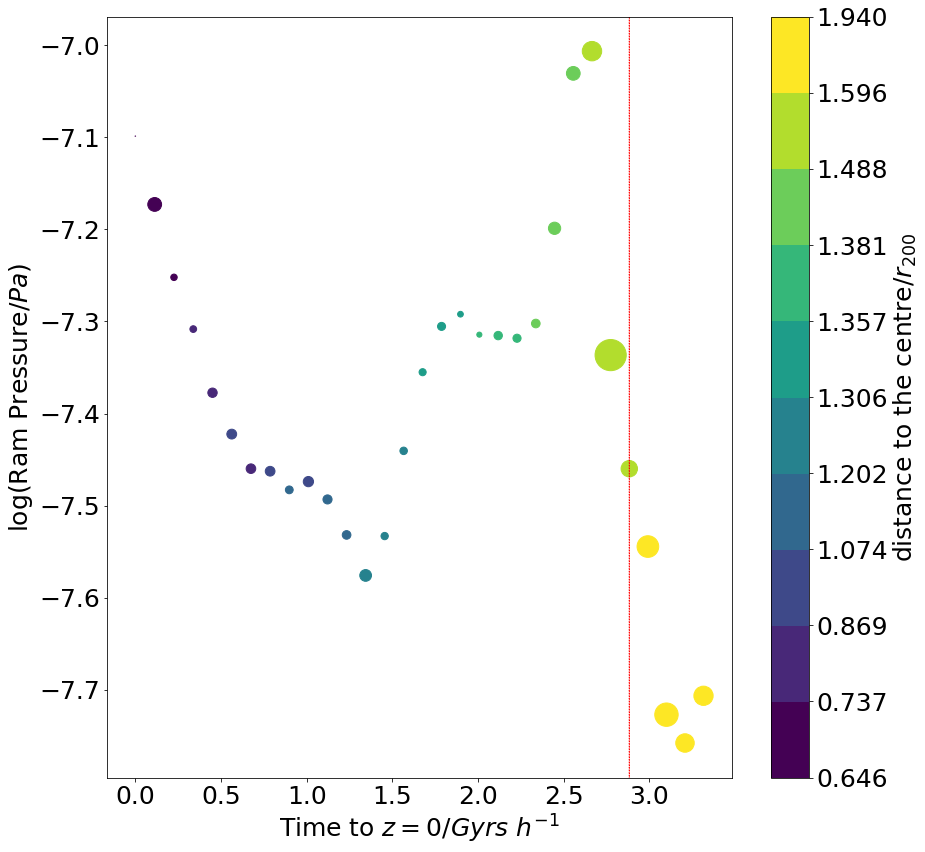

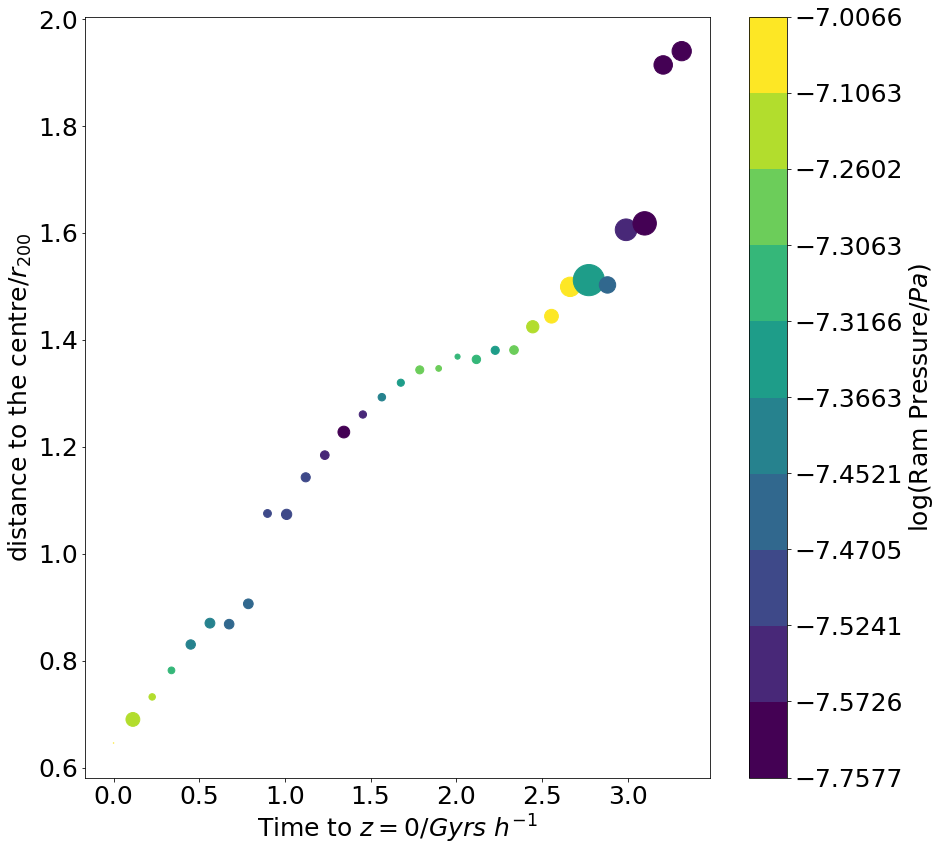

In [21]:
pl.figure(figsize=(14,14))


idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]

tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

tmerger = Cosmo.lookback_time(0.38219559019532867).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

pl.arrow(tmerger, -100., 0., 200, color='red', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa)$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.08557441528498821 0.46170561124483767


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

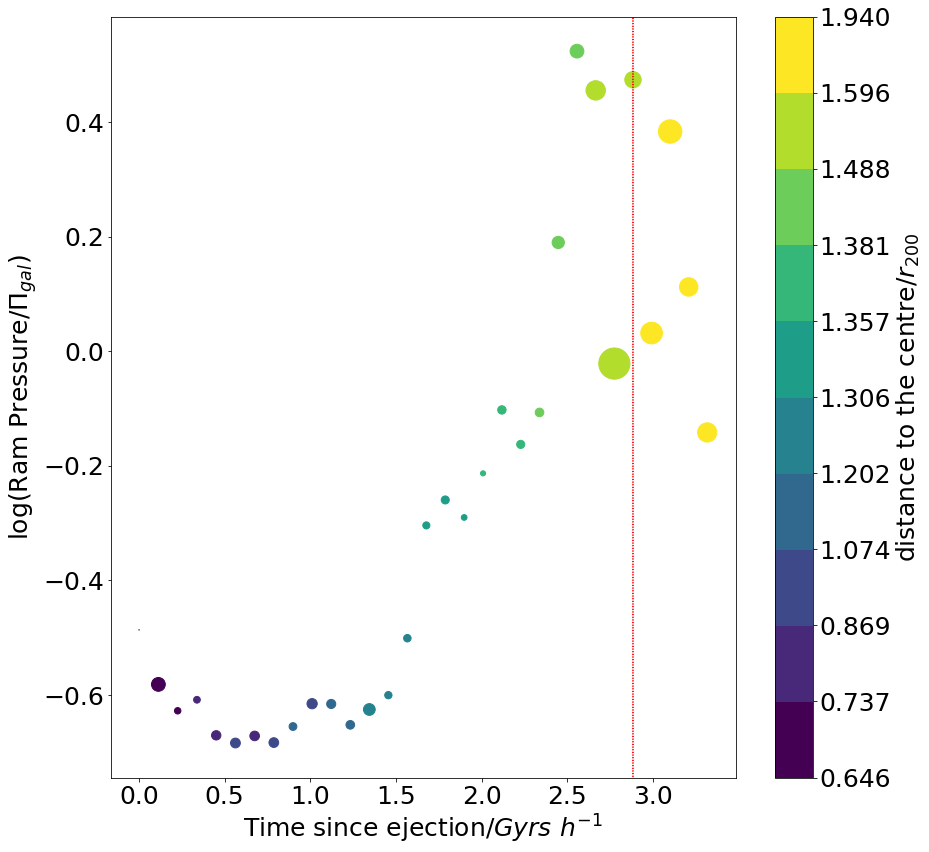

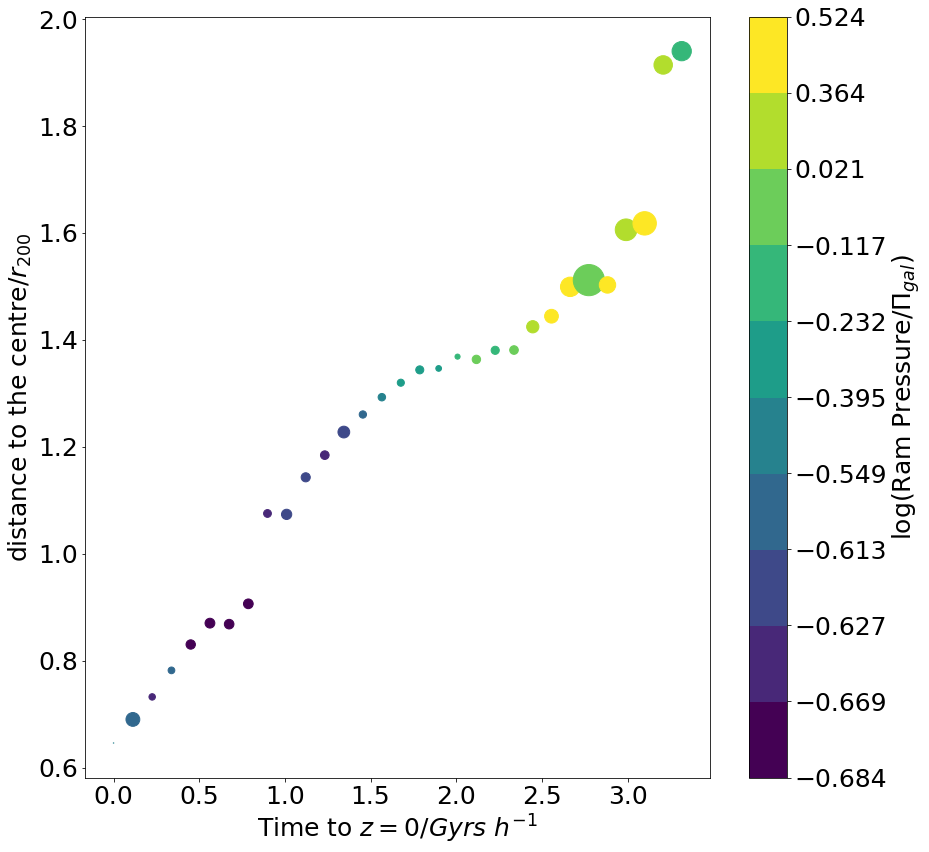

In [22]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

pl.arrow(tmerger, -100., 0., 200, color='red', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(-0.21302839662520262, 0.2583671294177029)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

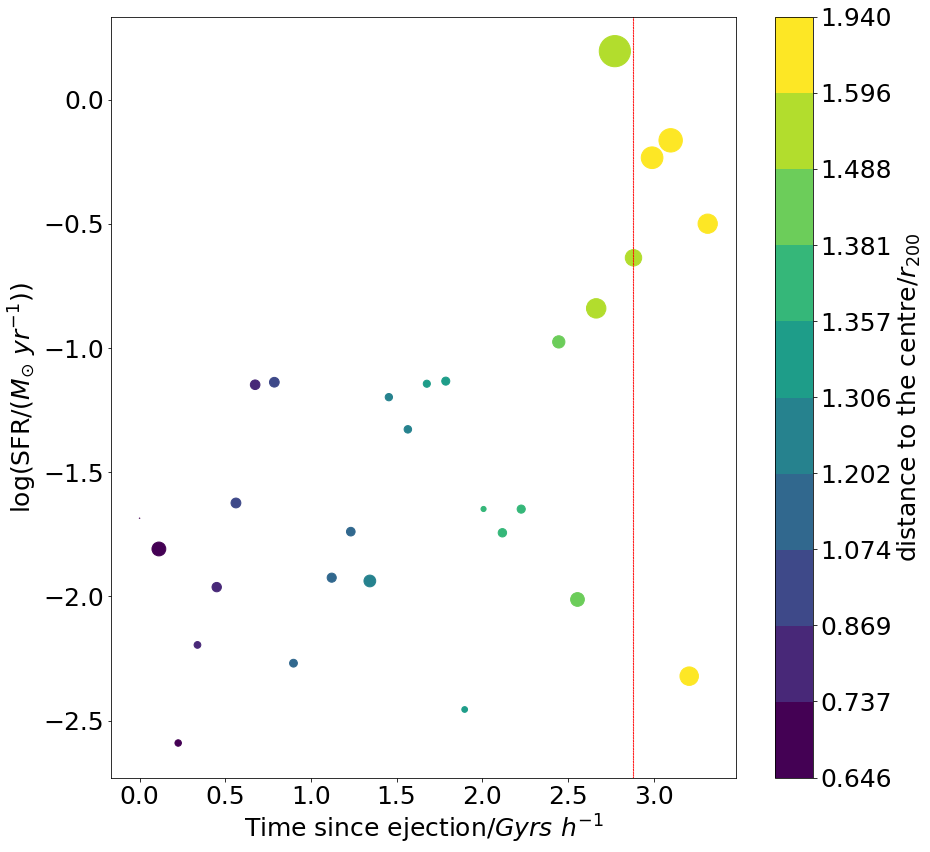

In [23]:
pl.figure(figsize=(14,14))

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.arrow(tmerger, -100., 0., 200, color='red', ls=':')

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')




/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


(-0.28420875257412304, 0.12798009853644274)


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

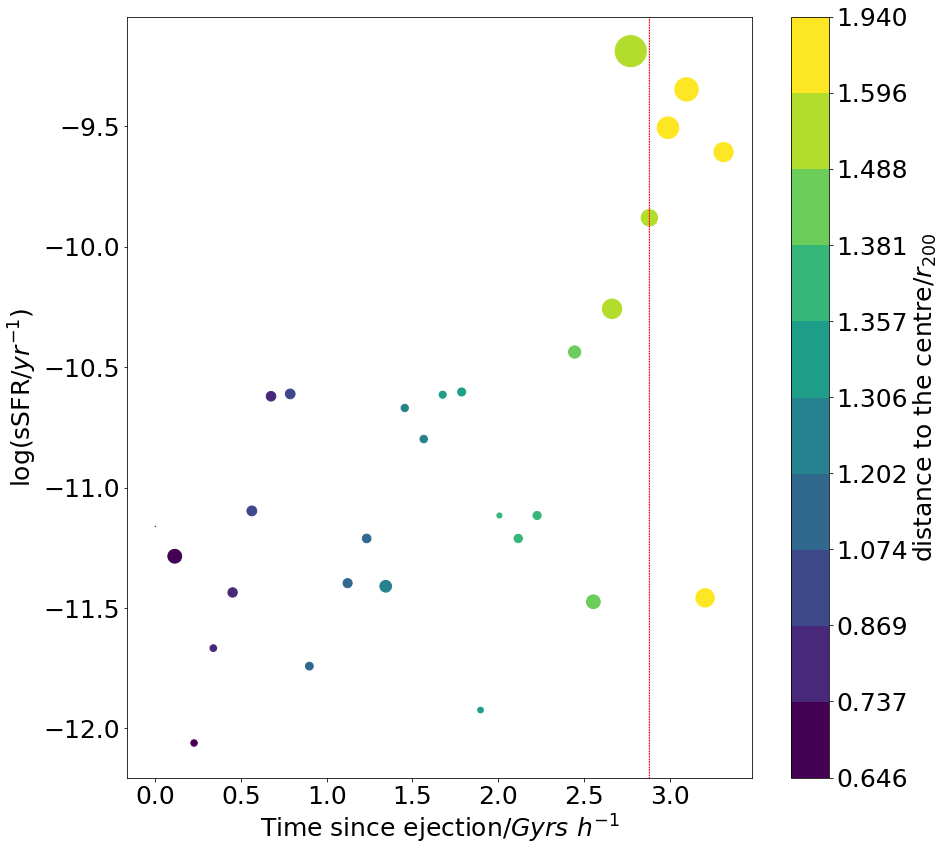

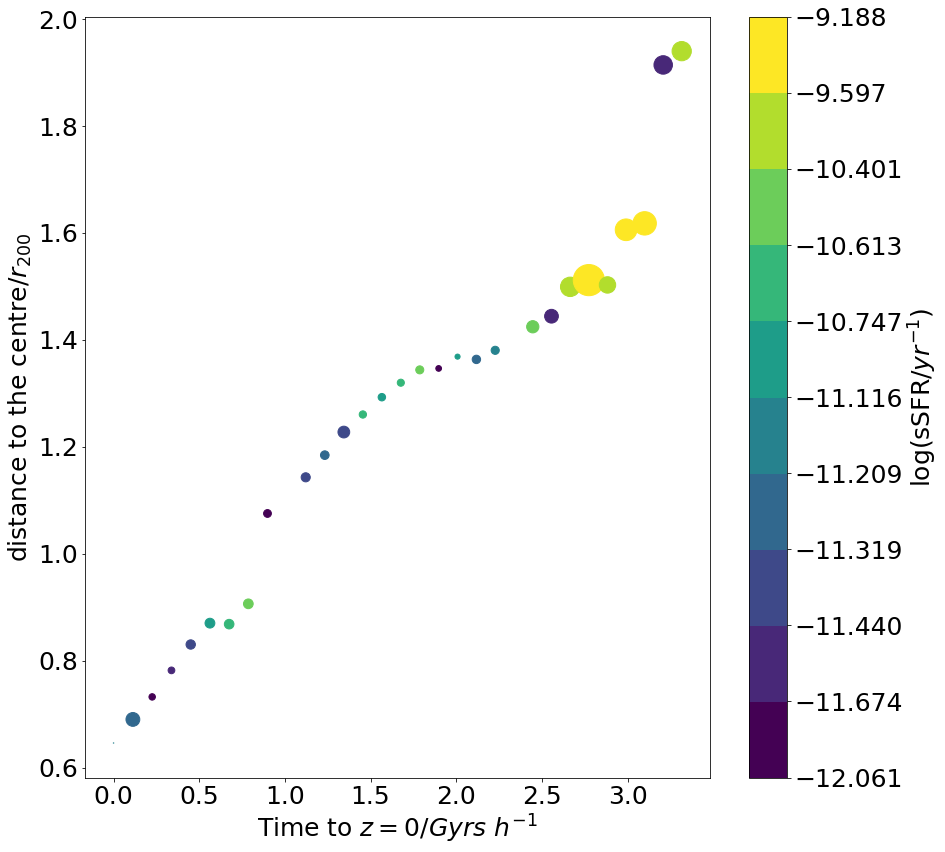

In [24]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))
pl.arrow(tmerger, -100., 0., 200, color='red', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


(-0.08233928645448825, 0.6653320084991083)


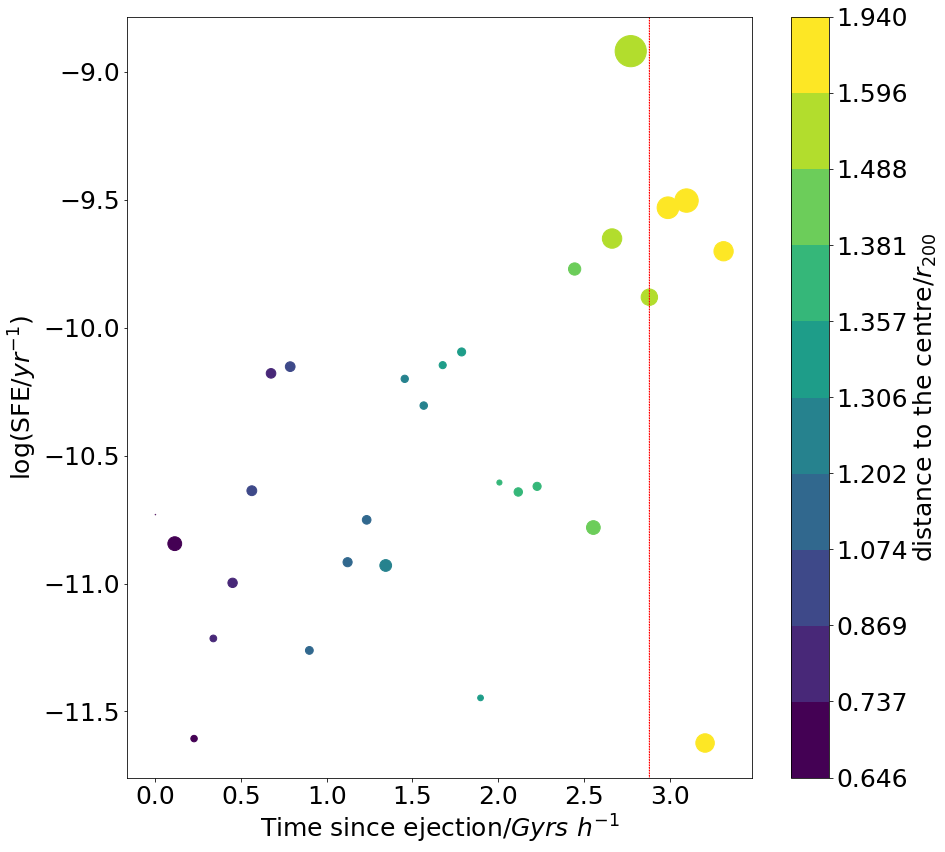

In [25]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))
pl.arrow(tmerger, -100., 0., 200, color='red', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

# here we collect
RPS_4470, Gas_4470, sSFR_4470, starMass_4470, RestForce_4470 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4470, OFelo_4470 = FeHlo, OFelo
DE_4470 = DE

In [26]:
# ok, lets test this
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4471, 4469)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4471 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide


0.420987180617459 0.4828424047552191


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

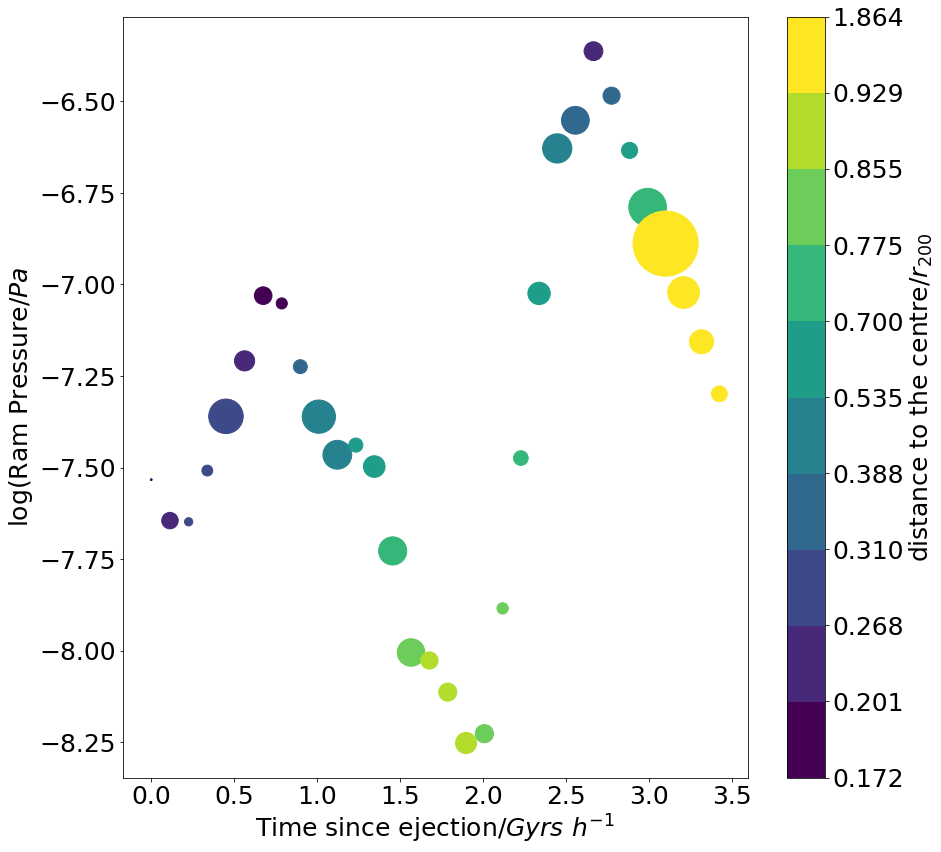

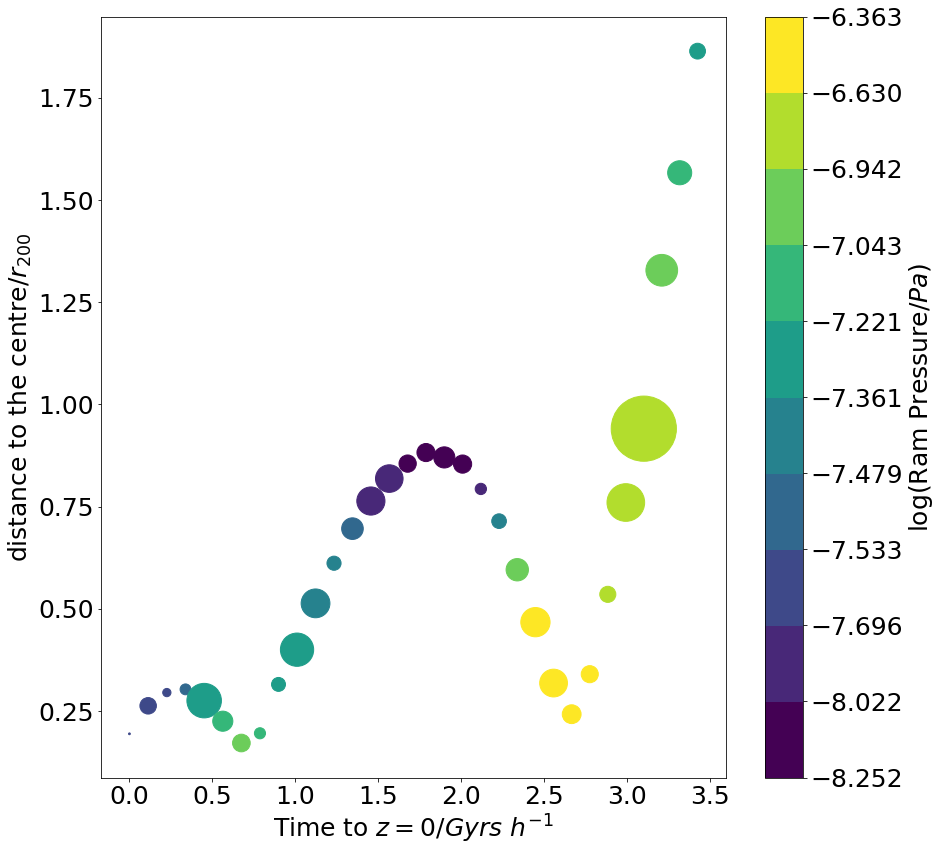

In [27]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.420987180617459 0.4828424047552191


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

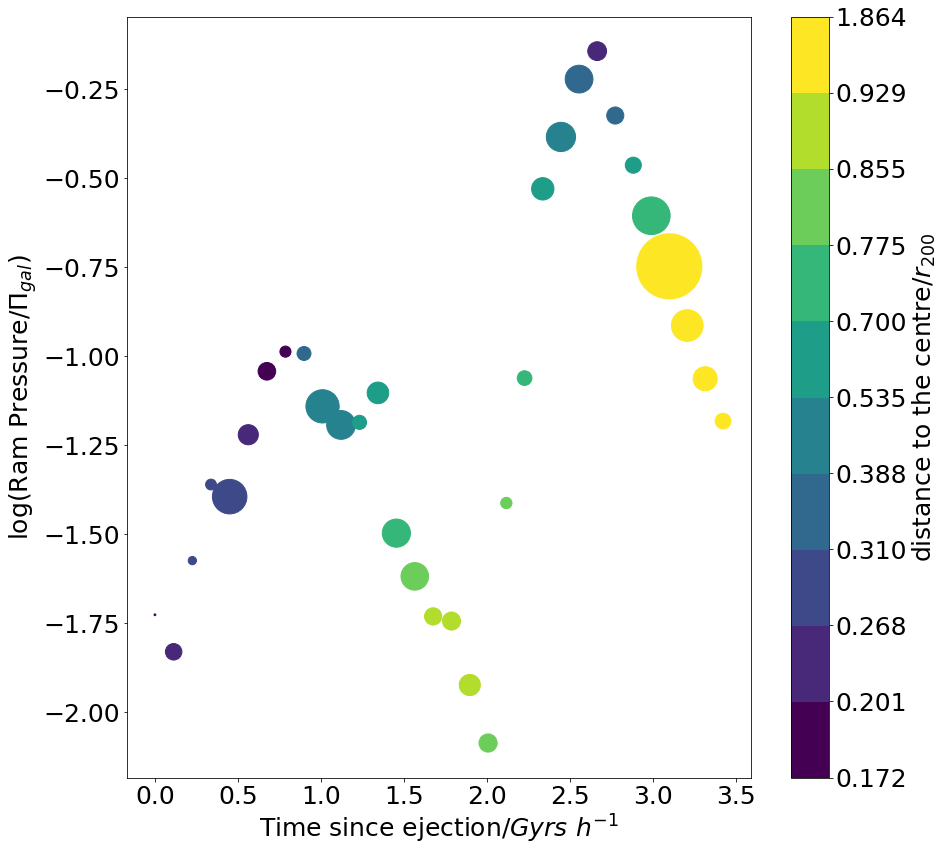

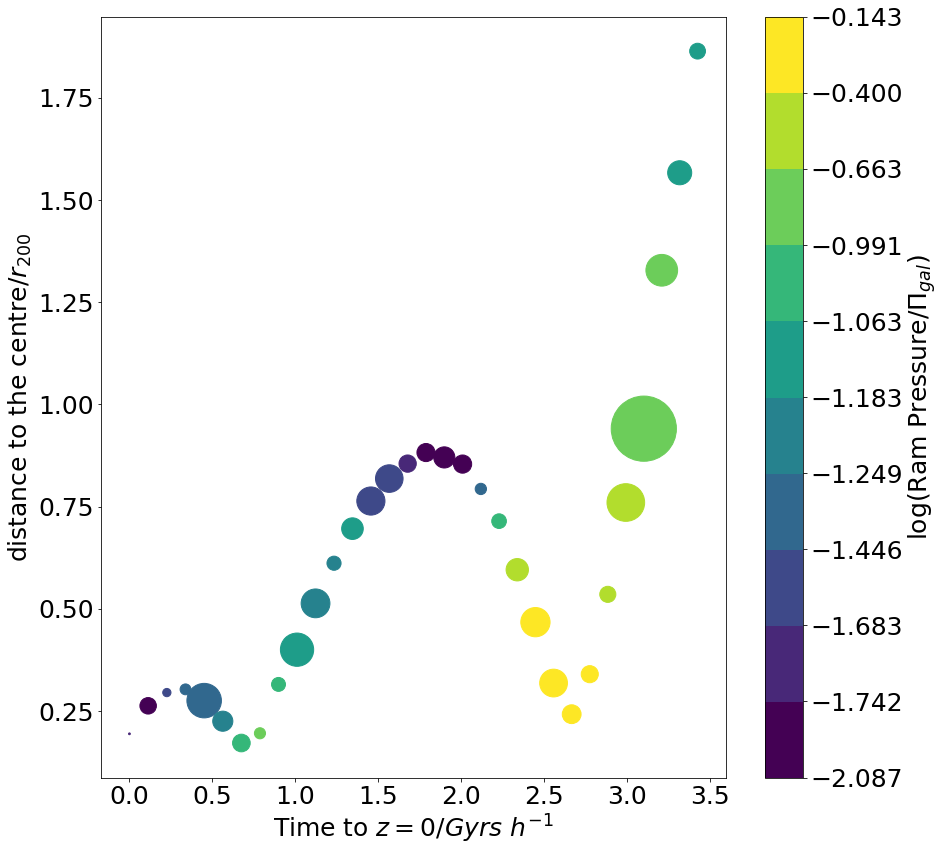

In [28]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(-0.31855665295592095, 0.0707923891538957)


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

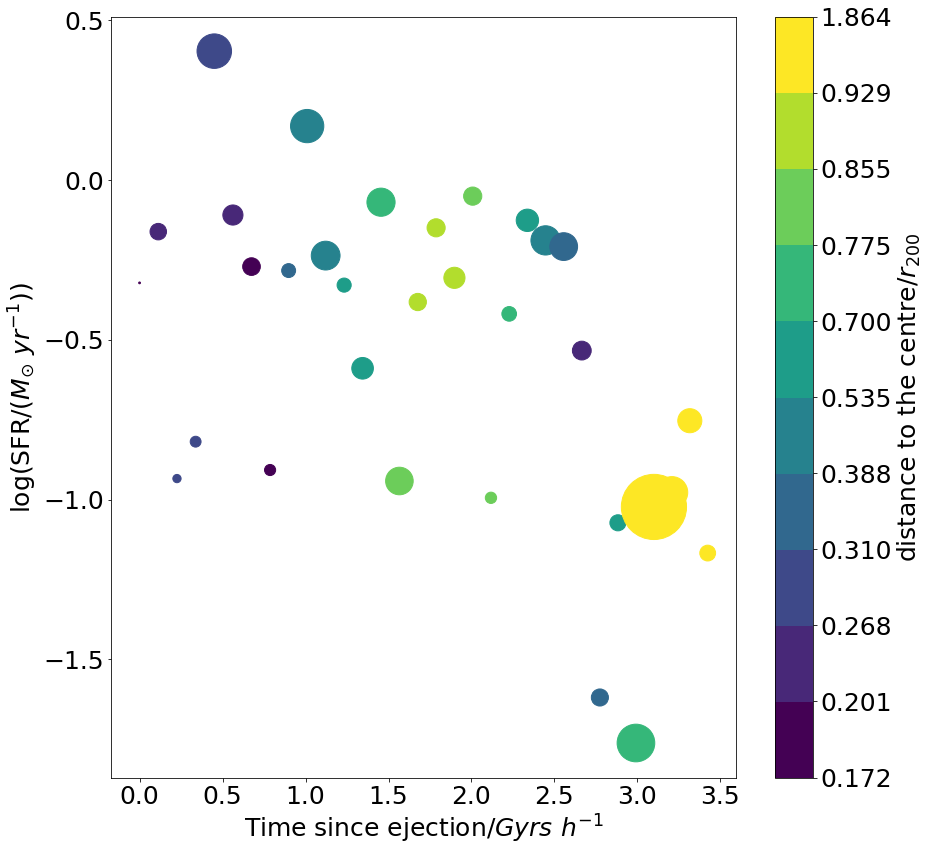

In [29]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

(-0.24038508310124093, 0.1778133580219852)


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

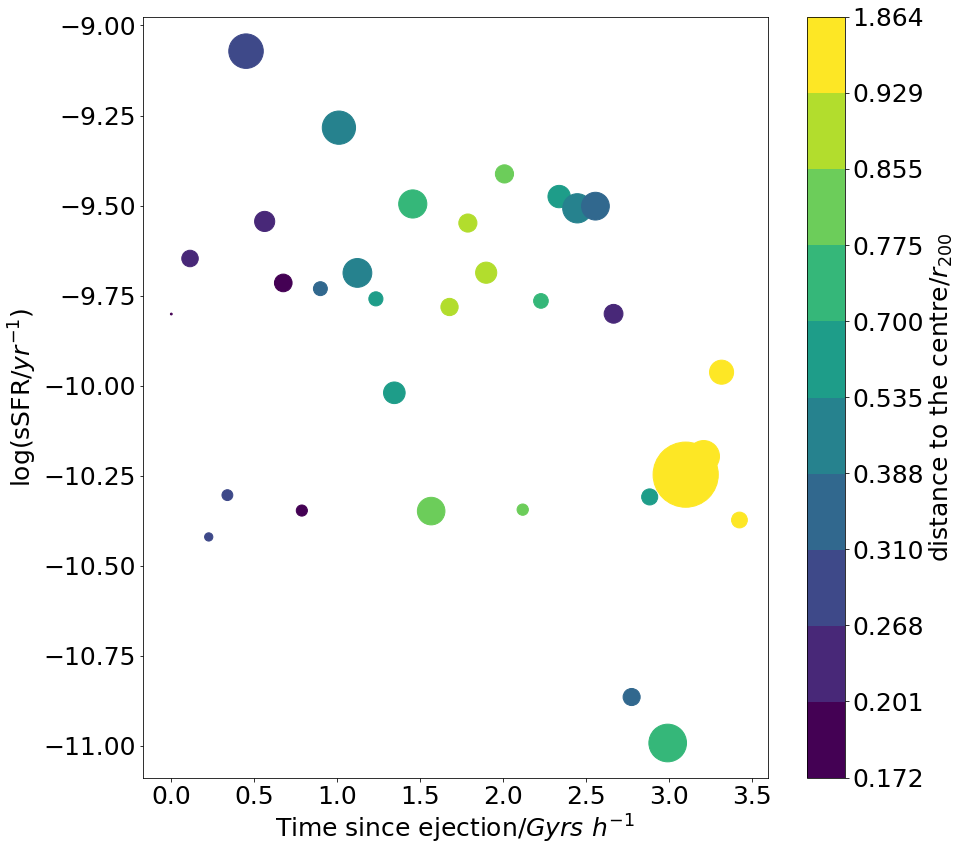

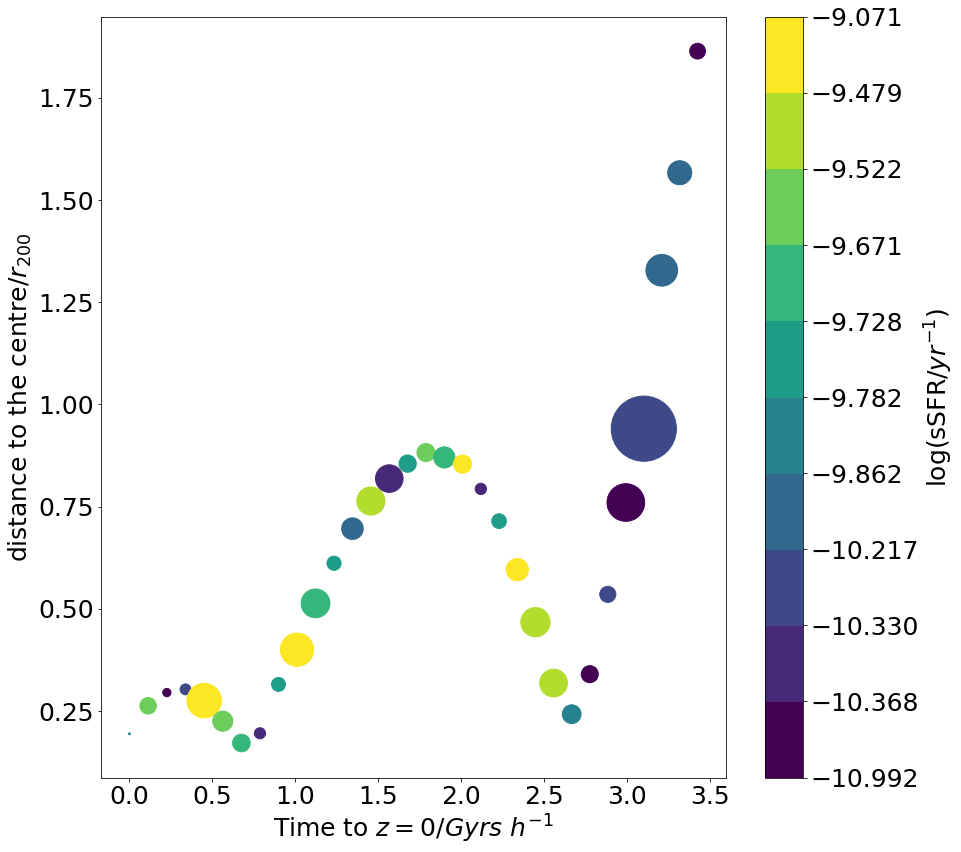

In [30]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(-0.03547761326288673, 0.8446050421378896)


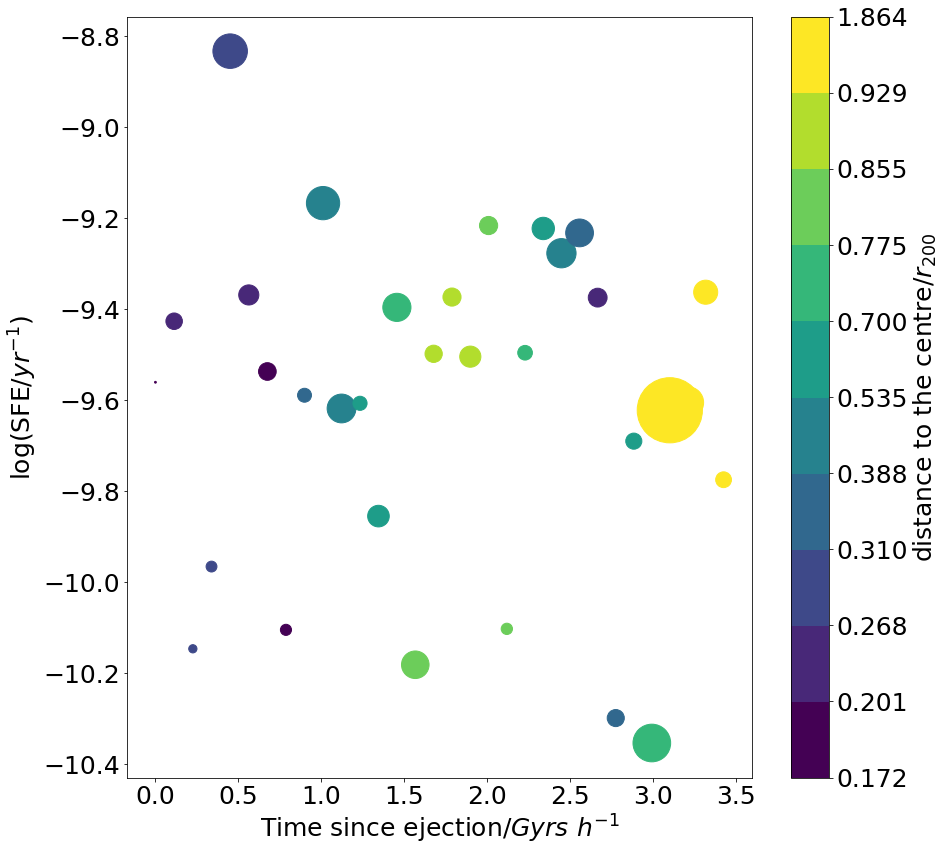

In [31]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

# here we collect
RPS_4471, Gas_4471, sSFR_4471, starMass_4471, RestForce_4471 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4471, OFelo_4471 = FeHlo, OFelo

In [32]:
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE  = getSFRs(4473, 4469)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4473 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide


0.1254867544903131 0.2926531855399035


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

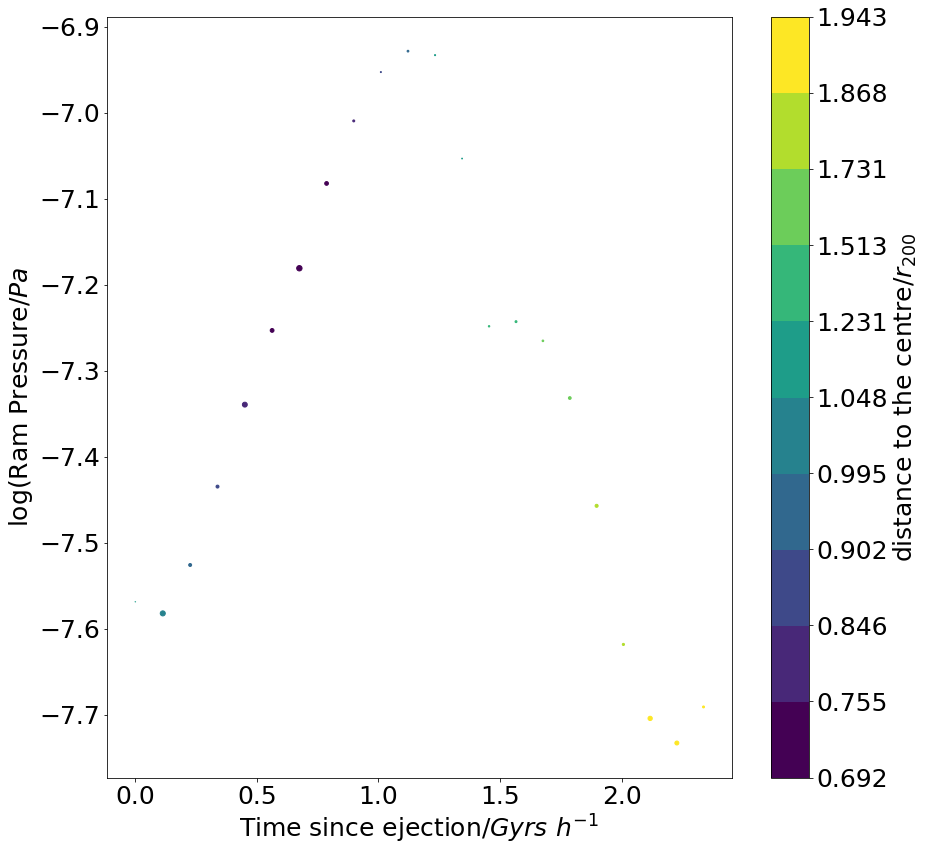

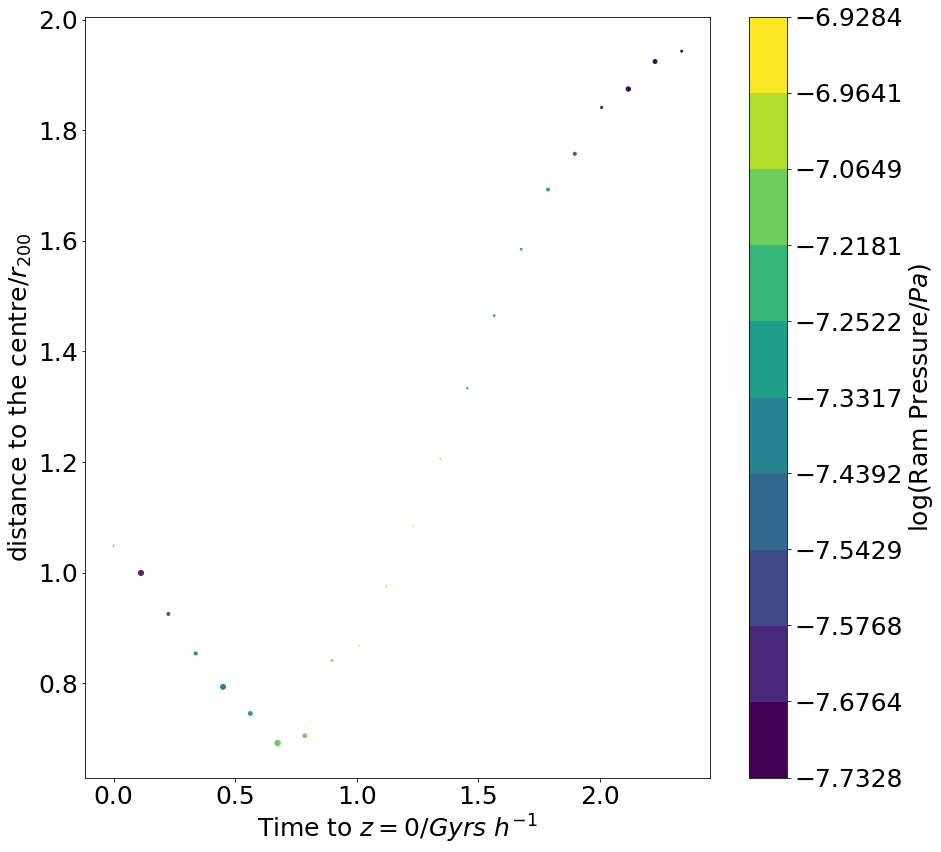

In [33]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.1254867544903131 0.2926531855399035


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

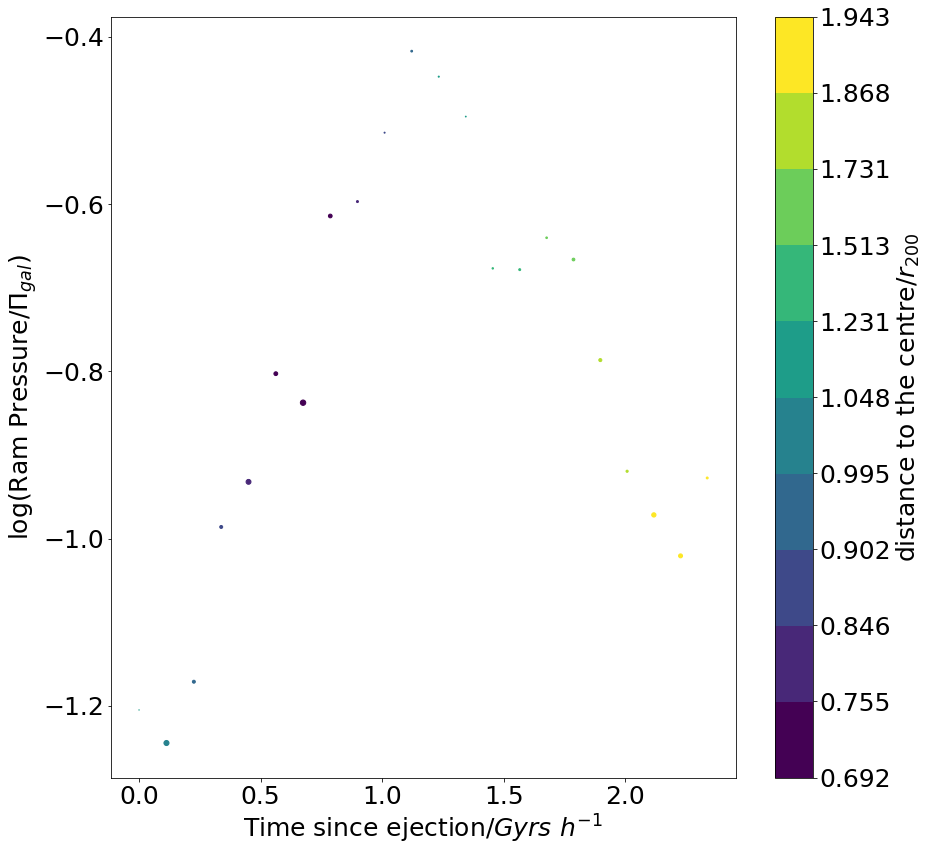

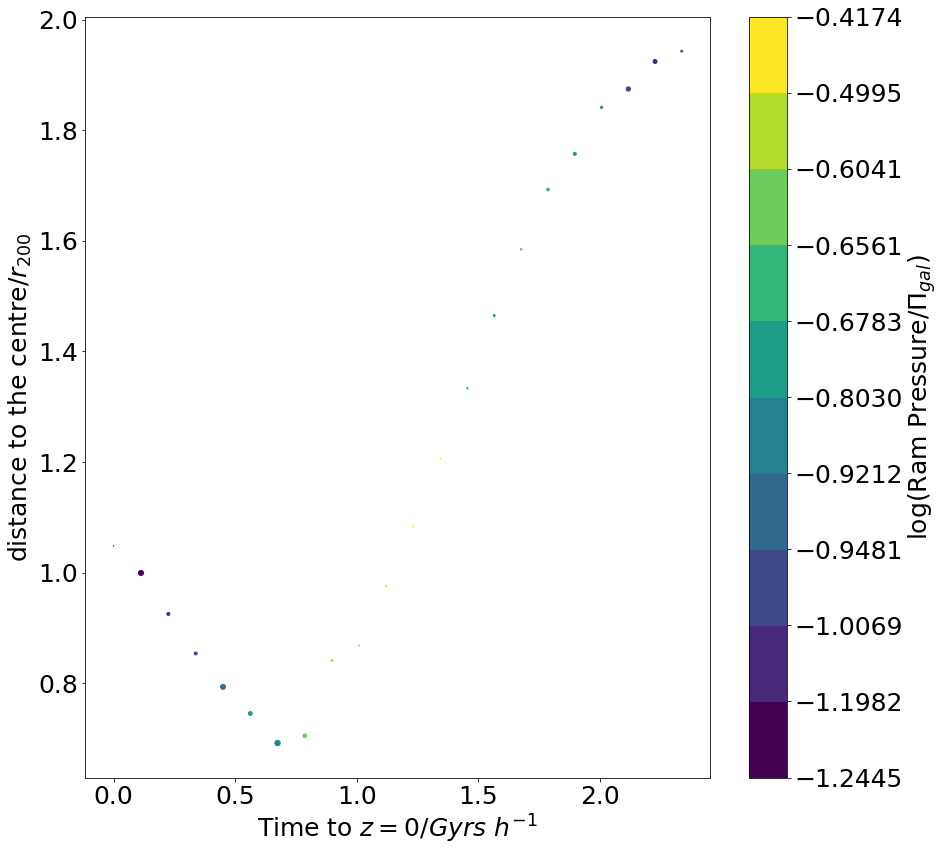

In [34]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.0960728731384503, 0.6956131474810415)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

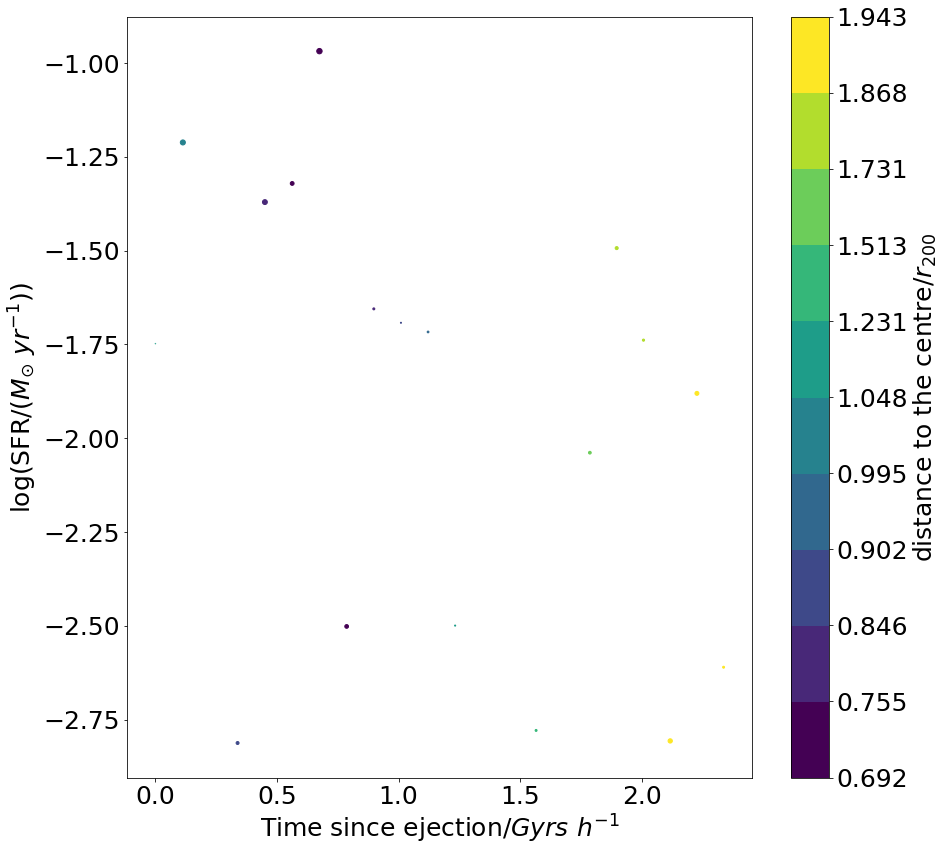

In [35]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

(0.09758429480206977, 0.691047696515876)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

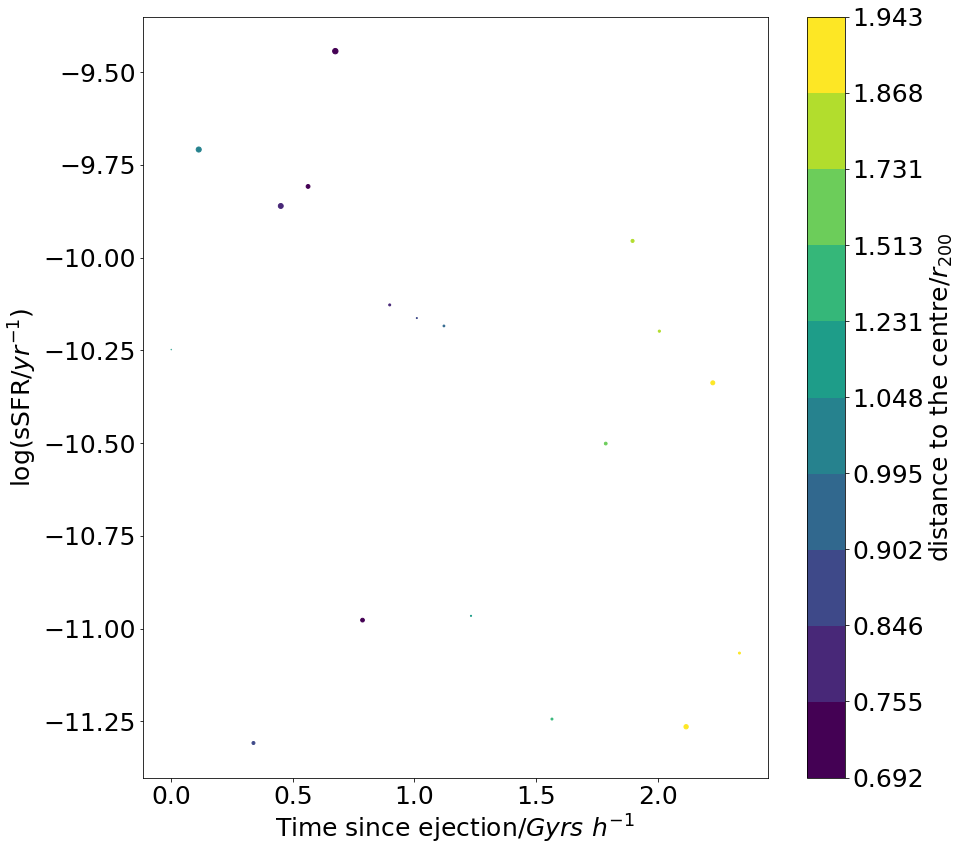

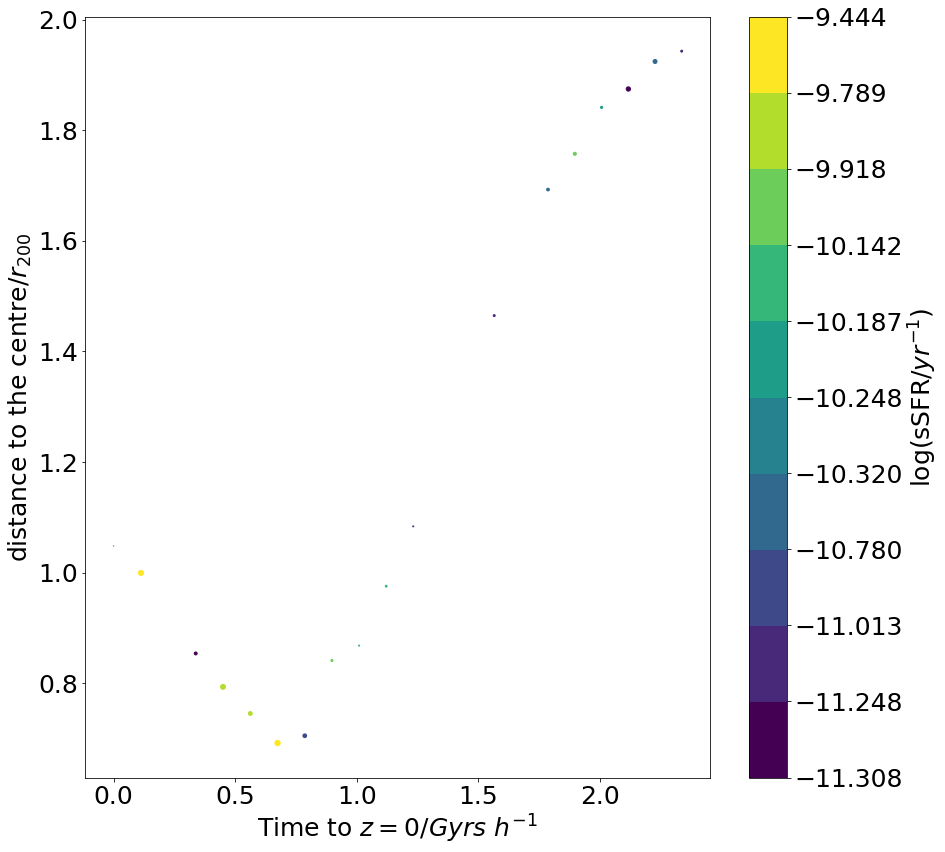

In [36]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.05936610665388632, 0.8092330974117715)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


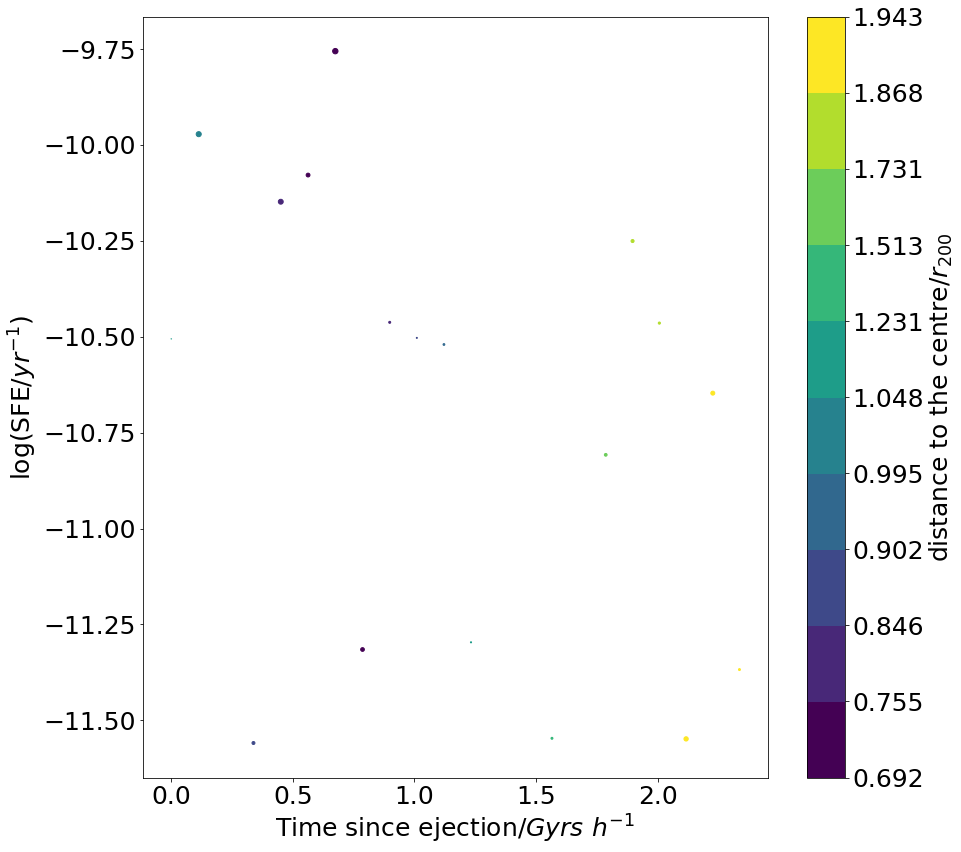

In [37]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

# here we collect
RPS_4473, Gas_4473, sSFR_4473, starMass_4473, RestForce_4473 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4473, OFelo_4473 = FeHlo, OFelo

In [38]:
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4474, 4469)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4474 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:113: RuntimeWarning: invalid value encountered in less_equal
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in less_equal


0.3634722484955717 0.4410948805168442


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

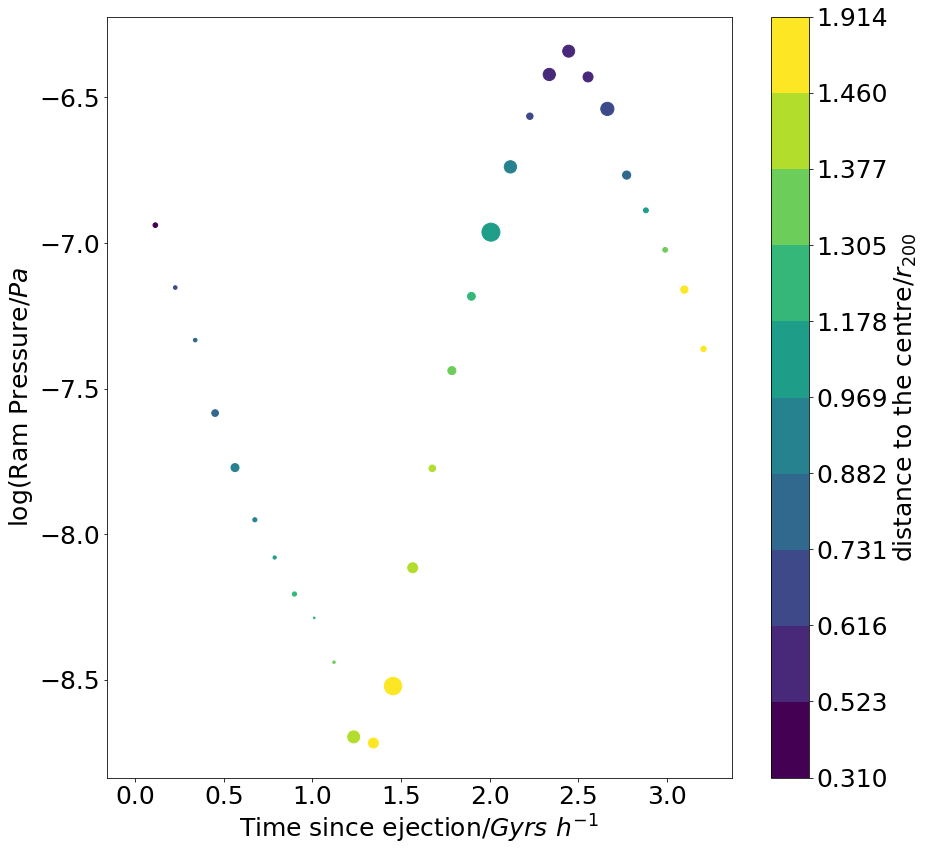

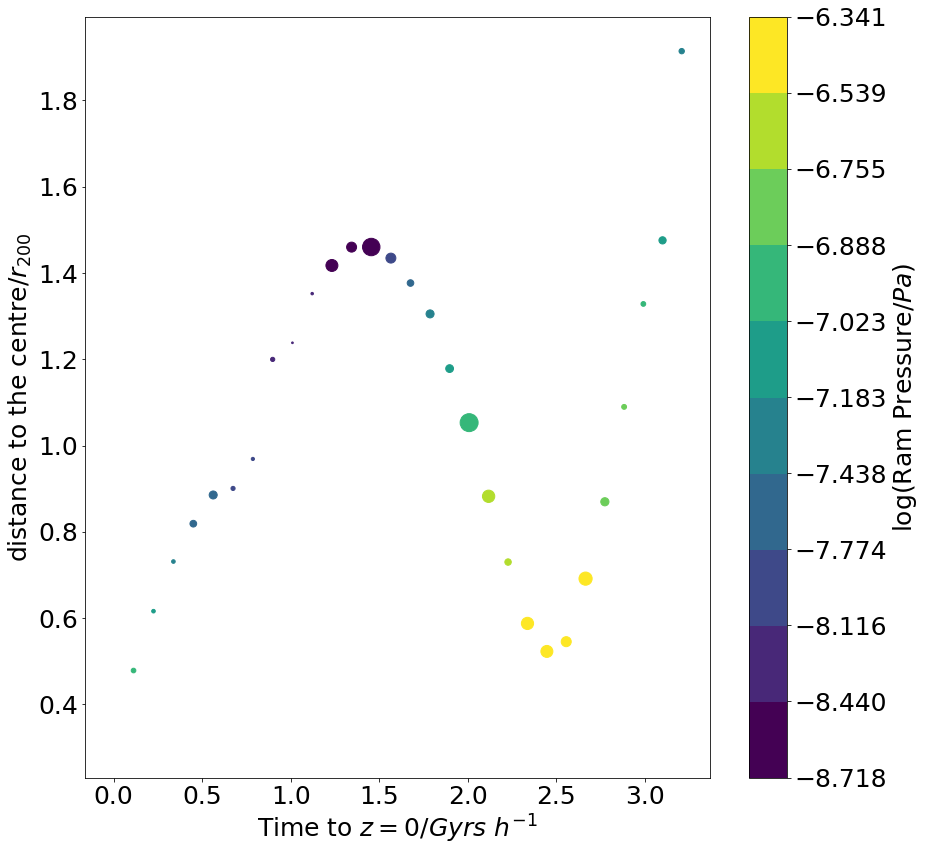

In [39]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.3634722484955717 0.4410948805168442


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

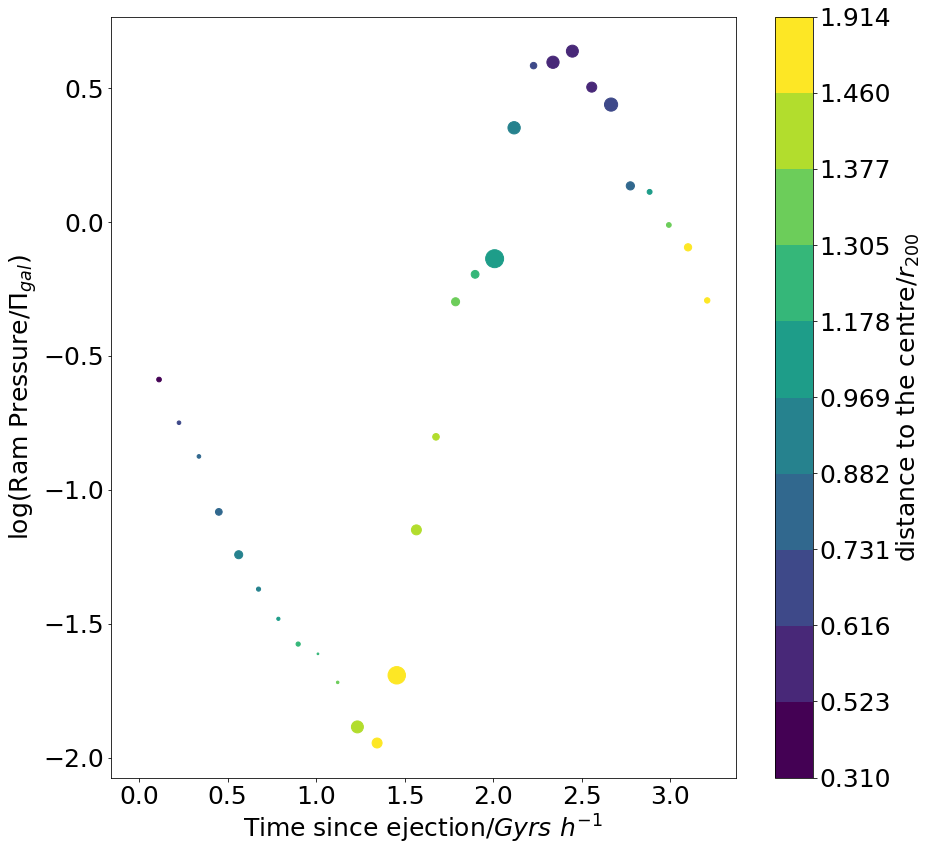

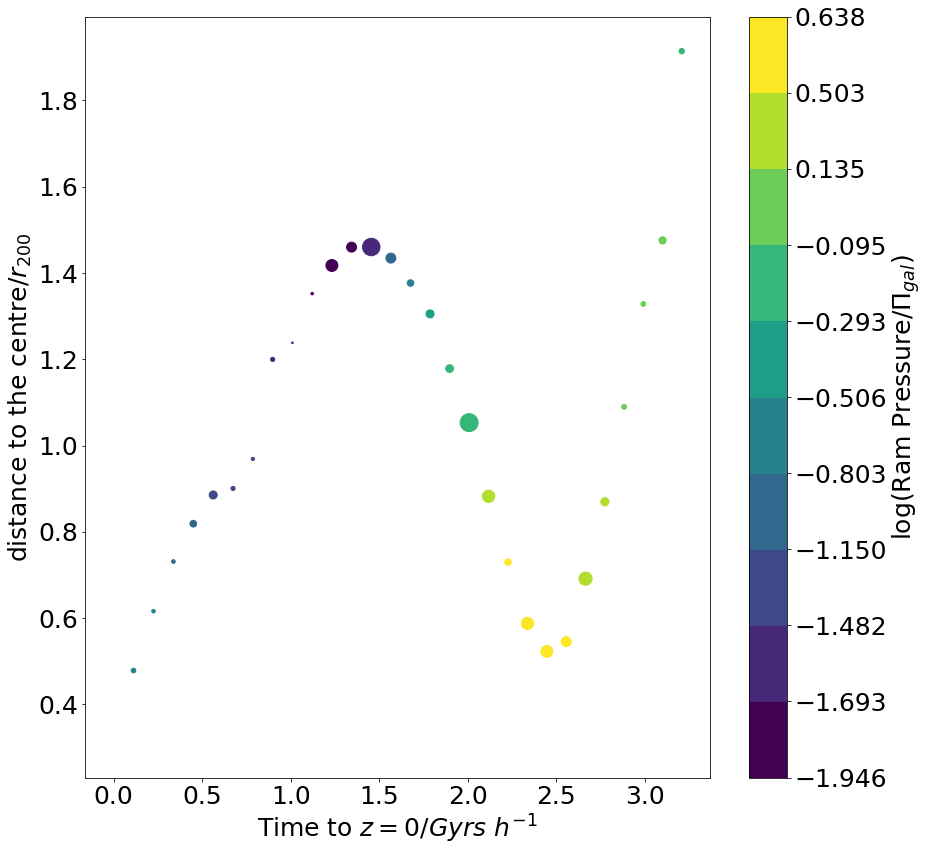

In [40]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.12156472436073416, 0.5222212987779432)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

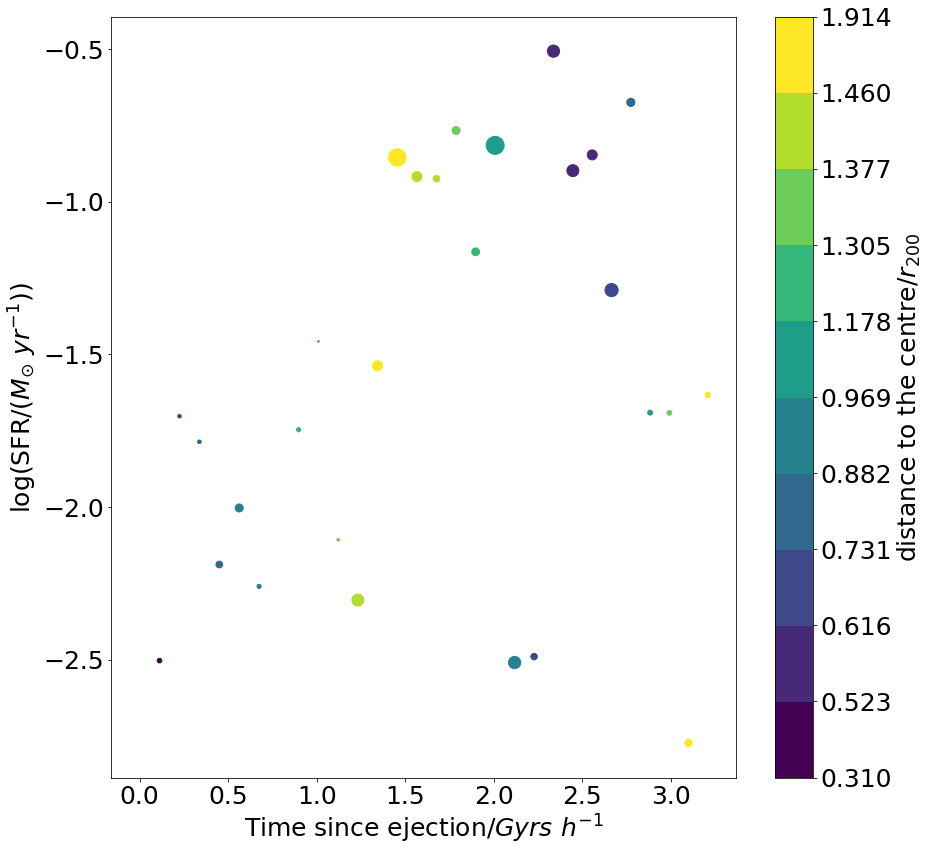

In [41]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

(0.188704656428198, 0.31795501278770955)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

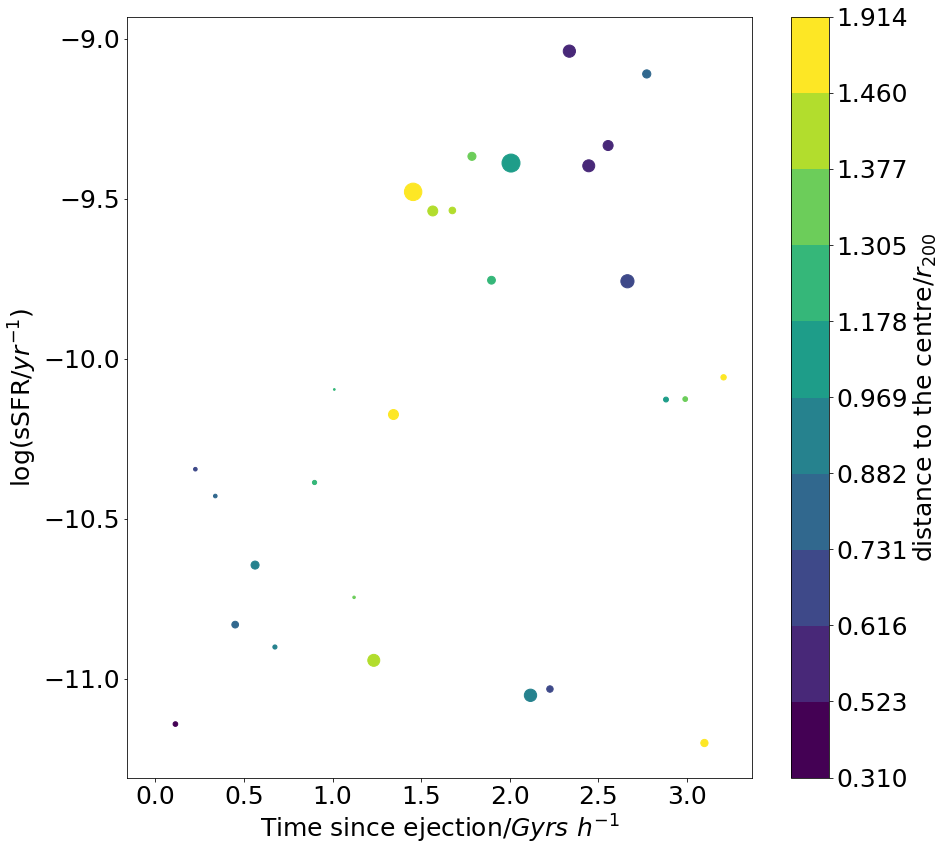

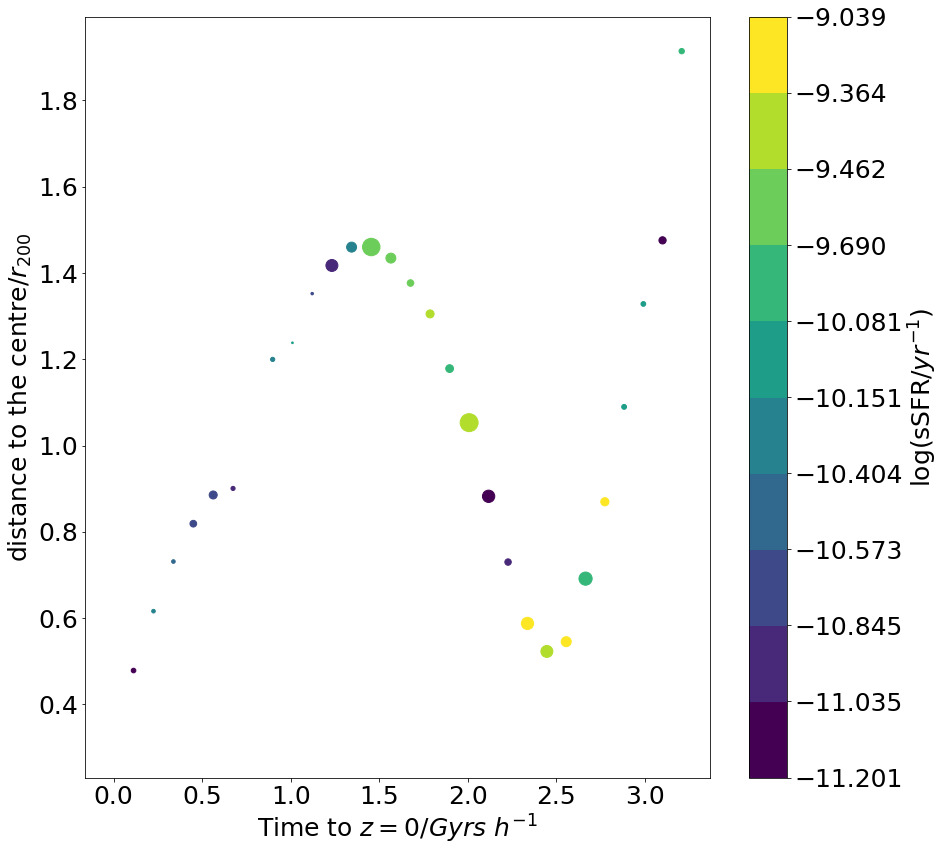

In [42]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.13831602152742878, 0.46605564214337714)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


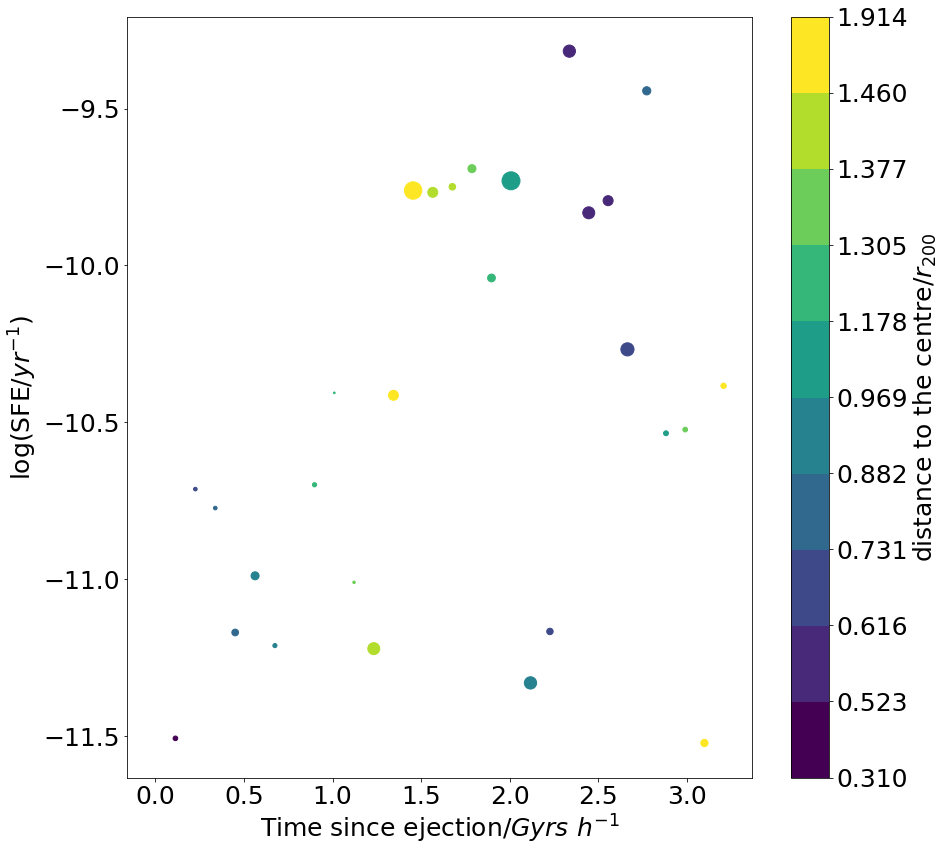

In [43]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

RPS_4474, Gas_4474, sSFR_4474, starMass_4474, RestForce_4474 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4474, OFelo_4474 = FeHlo, OFelo 

In [44]:
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4338, 4337)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4338 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide


0.24339225775468964 0.38219559019532867


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

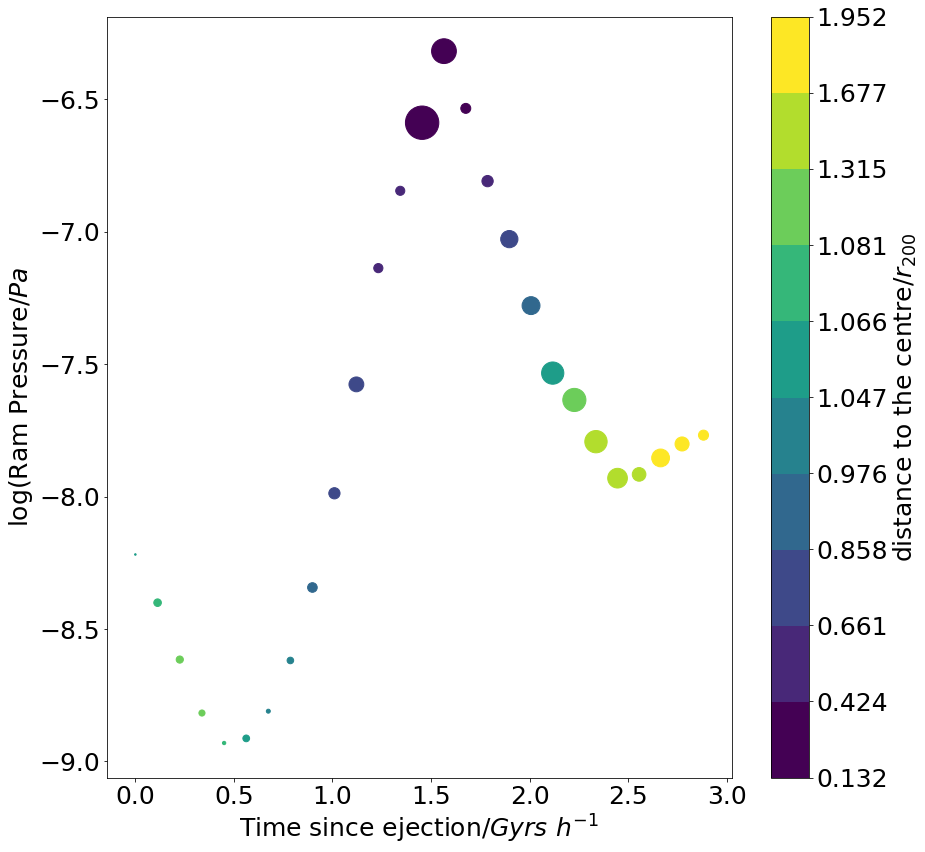

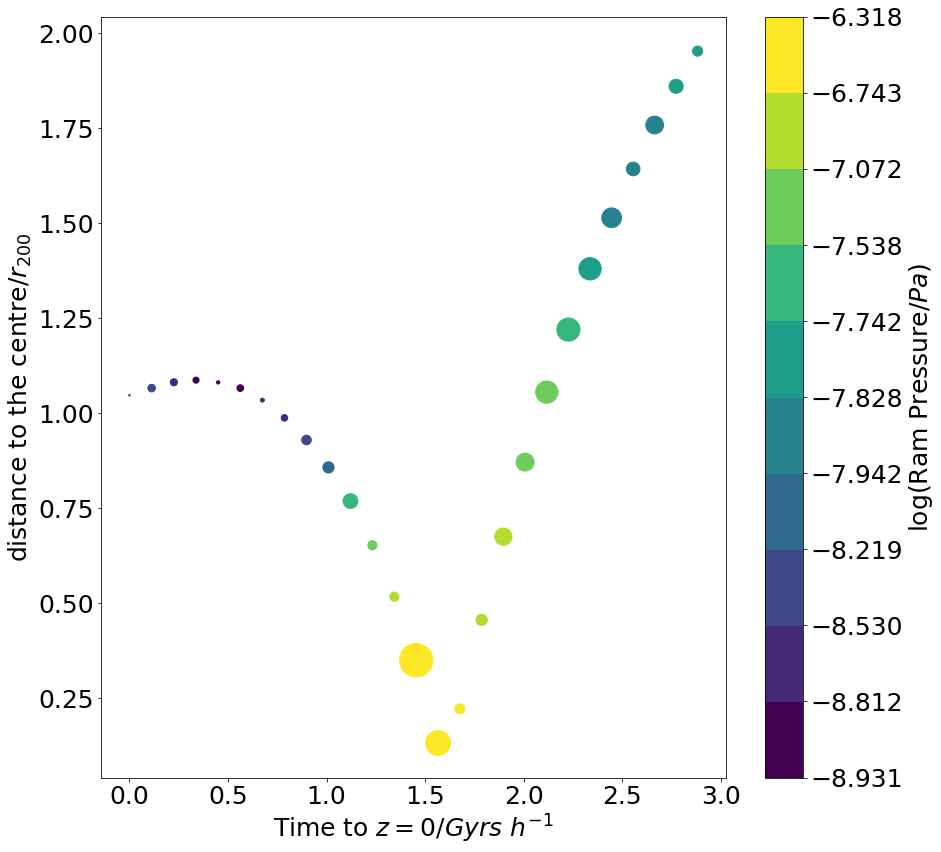

In [45]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.24339225775468964 0.38219559019532867


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

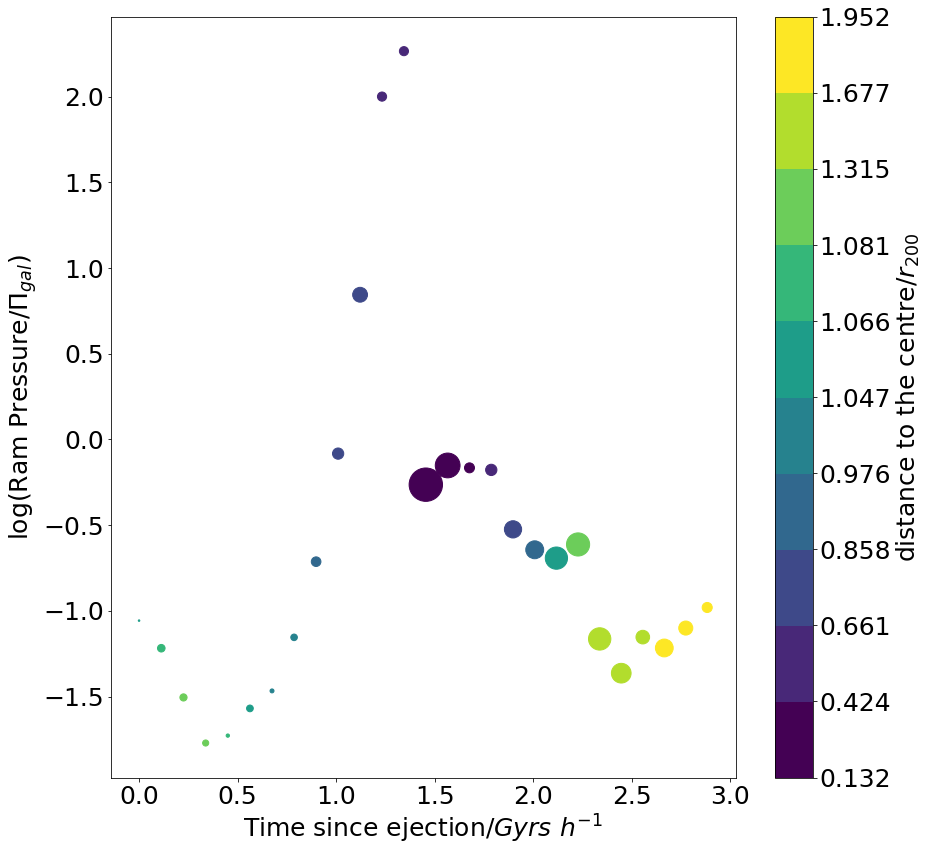

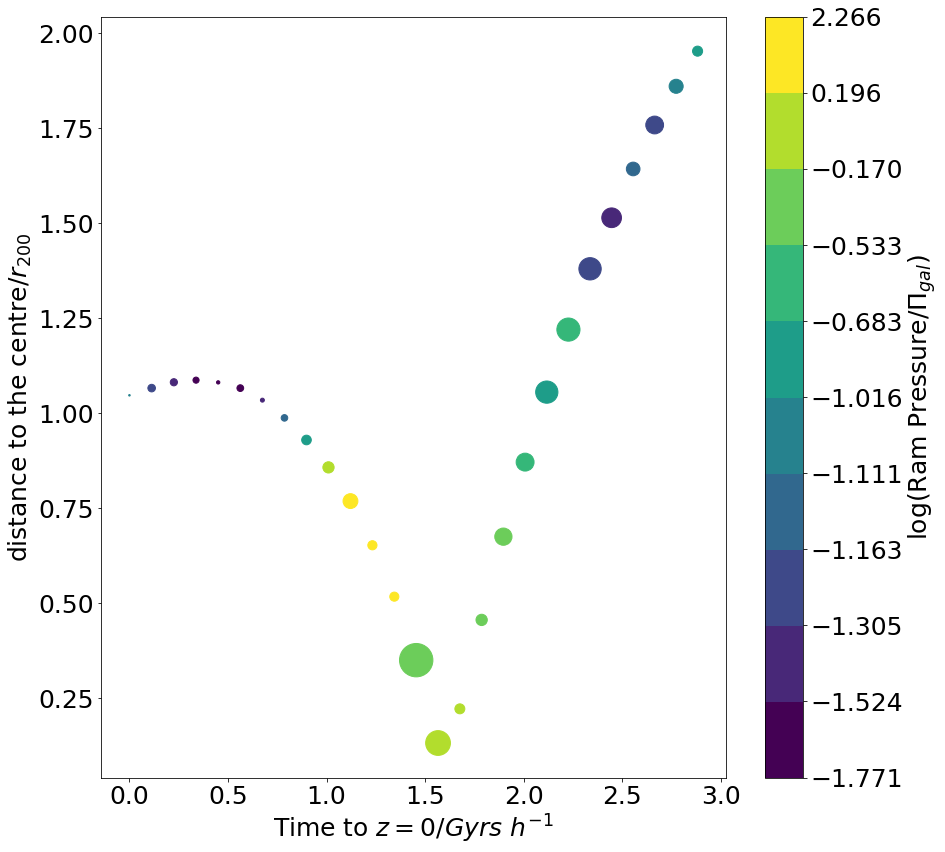

In [46]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.5650258335262979, 0.006143764734820838)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

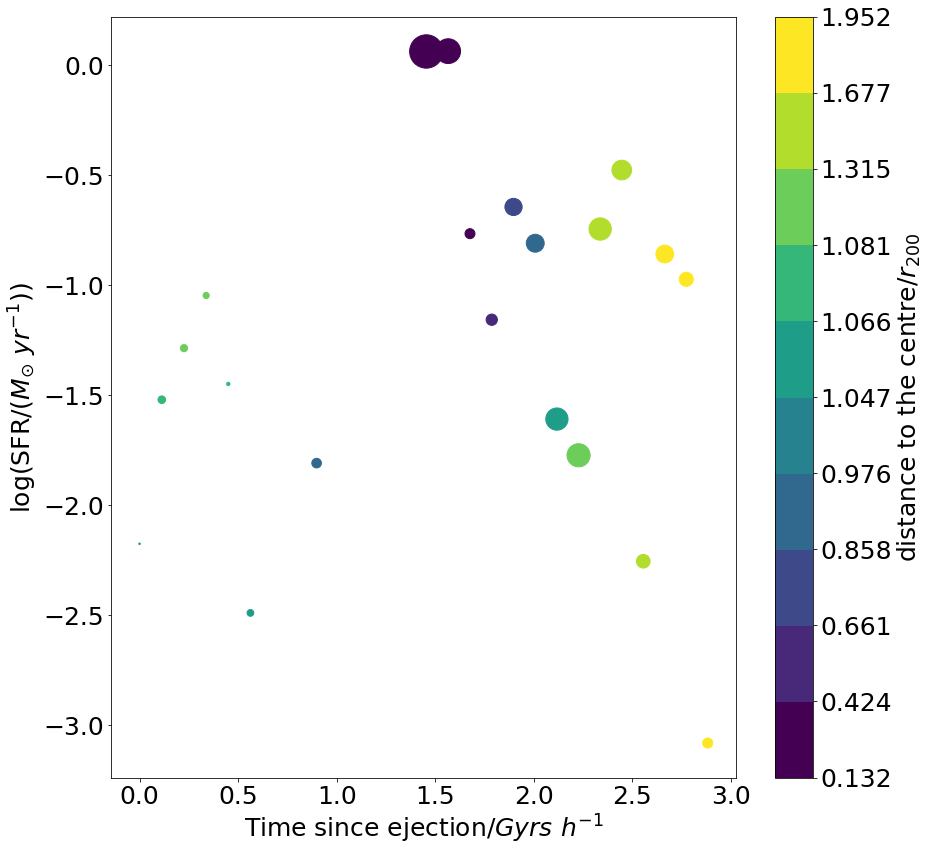

In [47]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

(0.6050752111032347, 0.002849547123413147)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

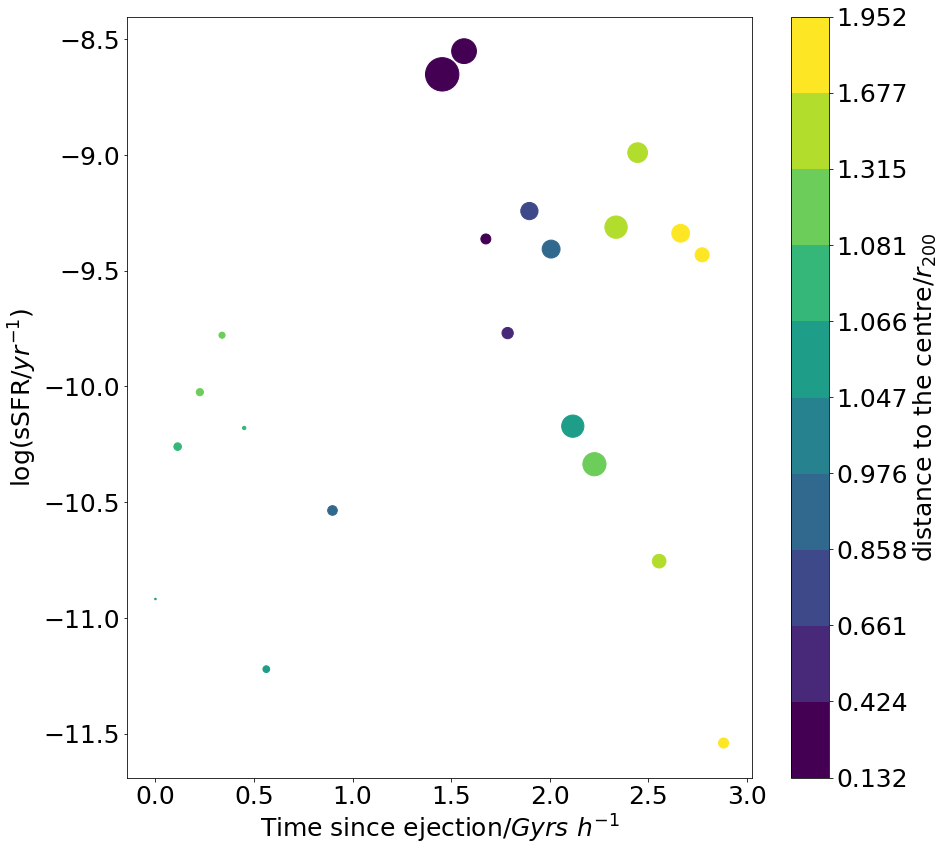

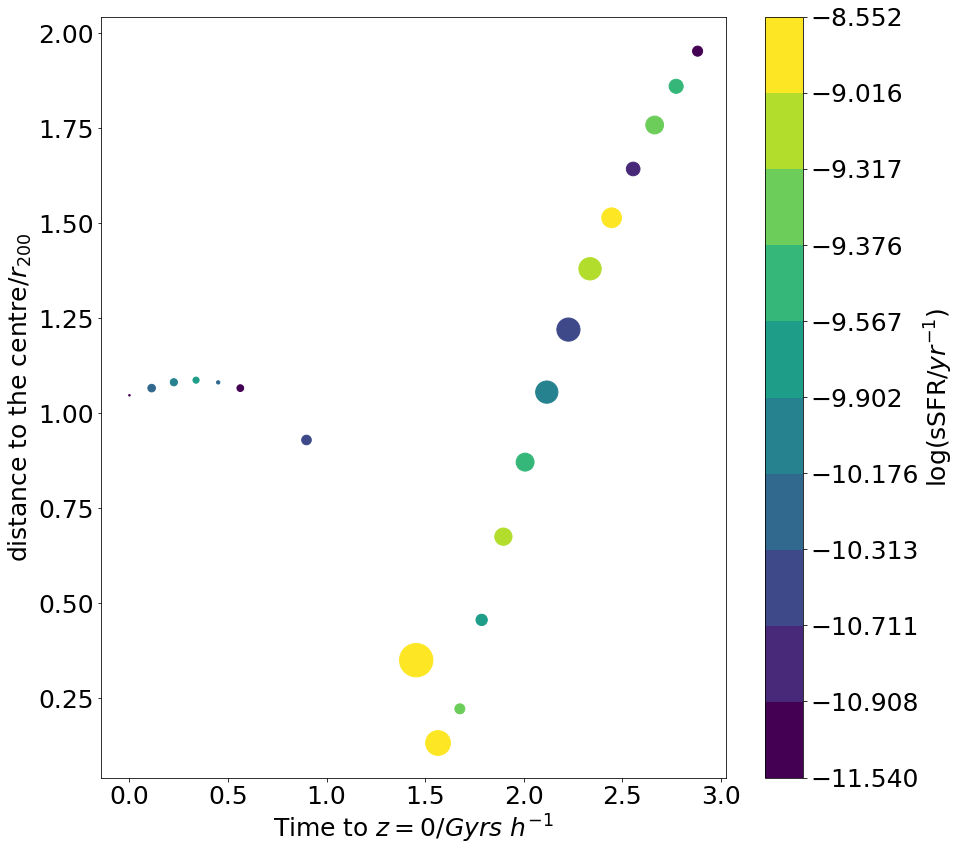

In [48]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.33696590774057755, 0.12515175331589048)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


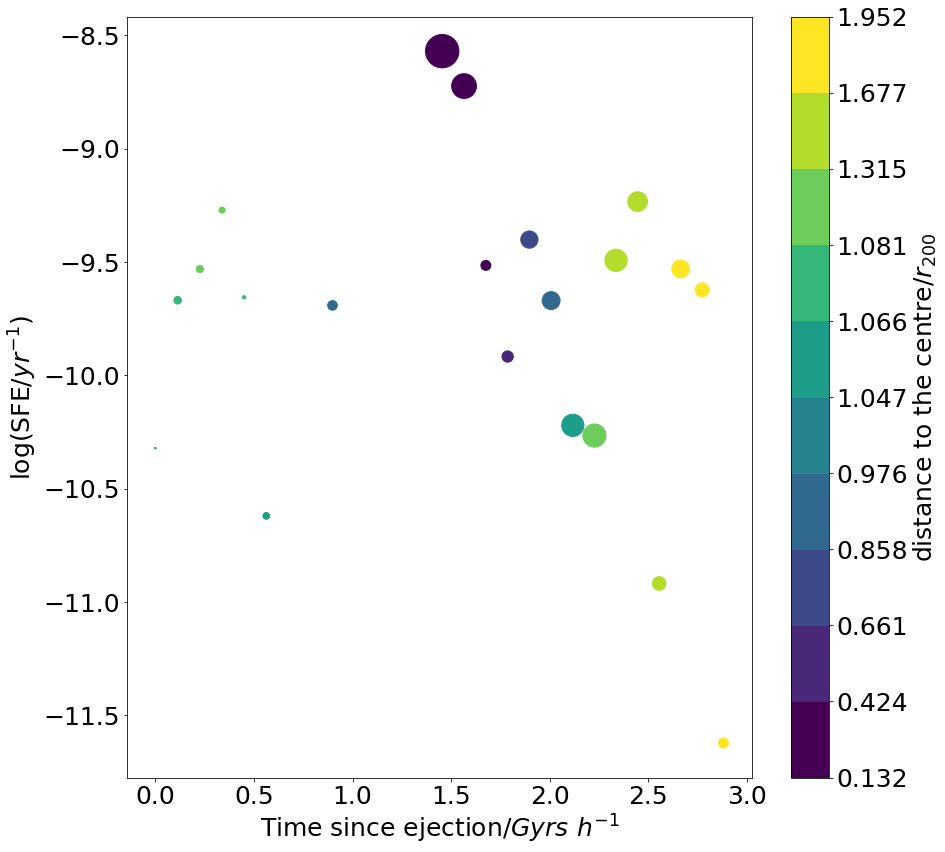

In [49]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

RPS_4338, Gas_4338, sSFR_4338, starMass_4338, RestForce_4338 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4338, OFelo_4338 = FeHlo, OFelo 

In [50]:
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4339, 4337)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4339 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide


0.6222120052452746 0.7585015073982897


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

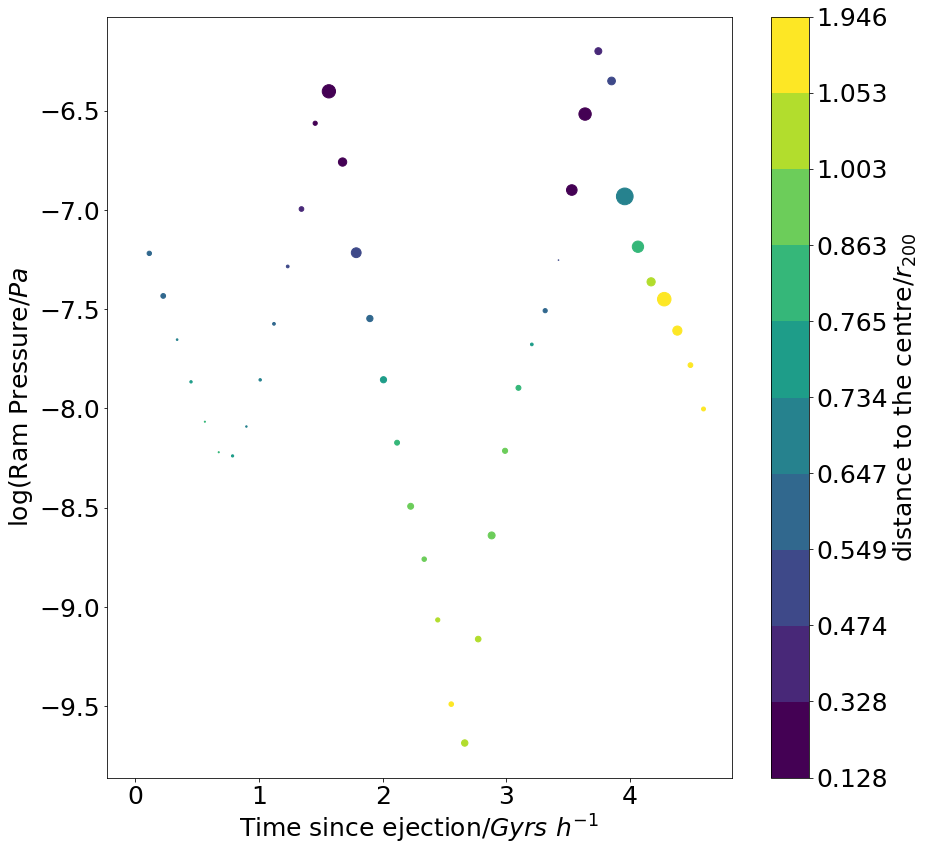

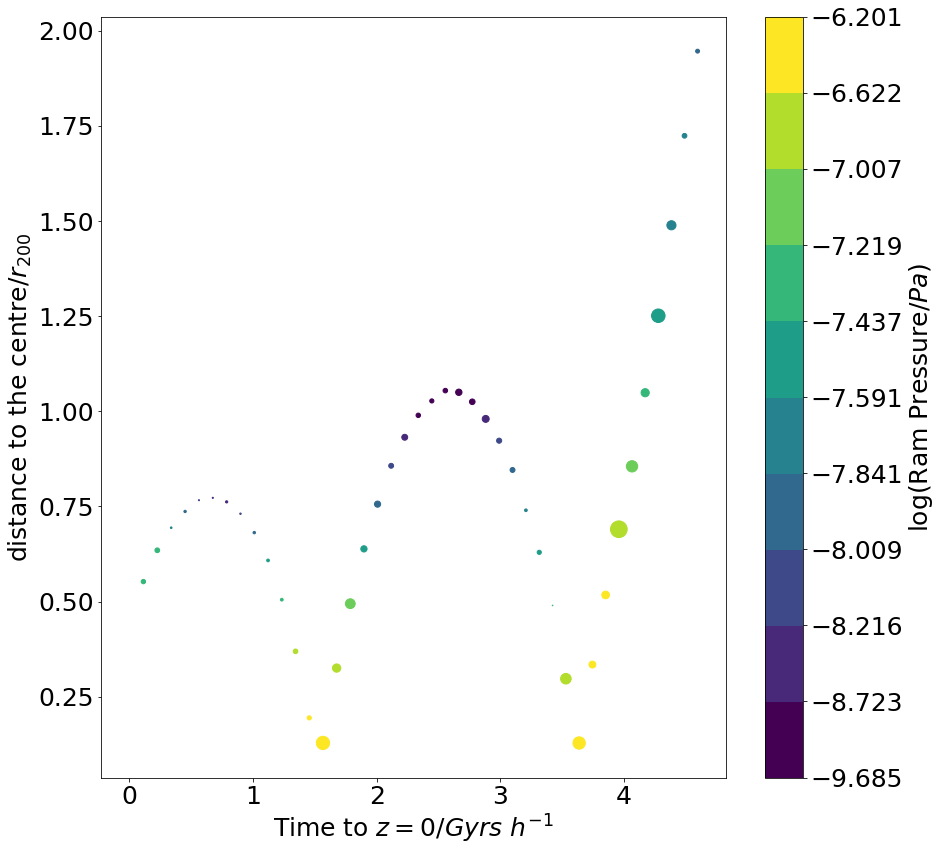

In [51]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.6222120052452746 0.7585015073982897


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

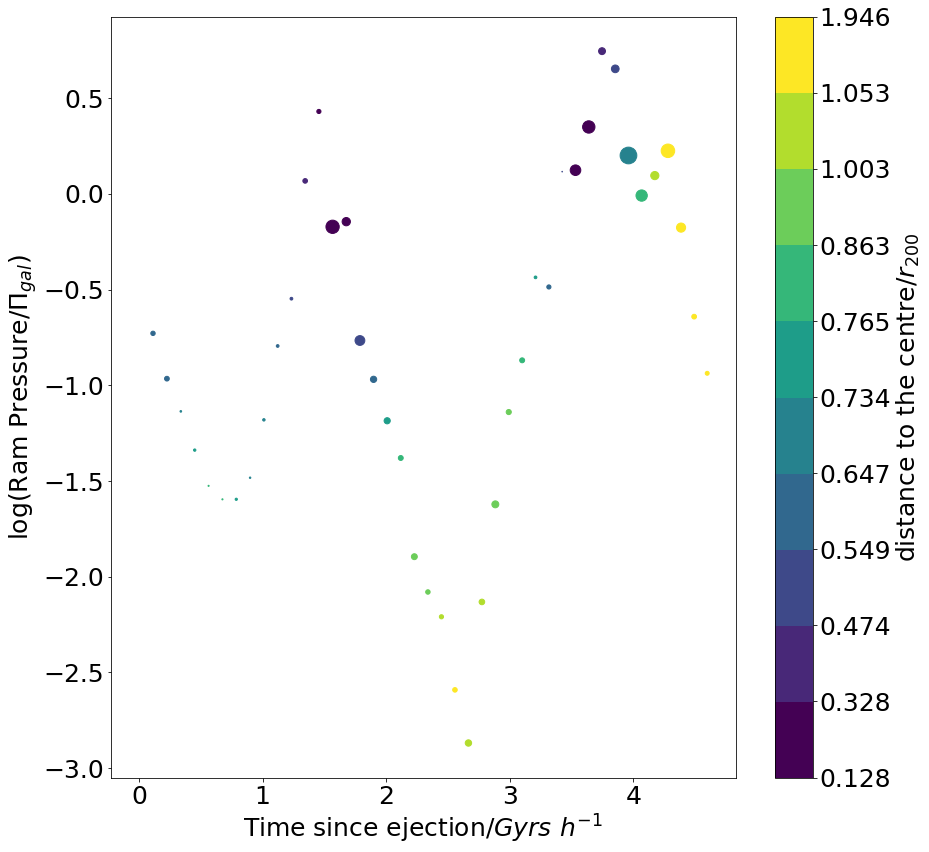

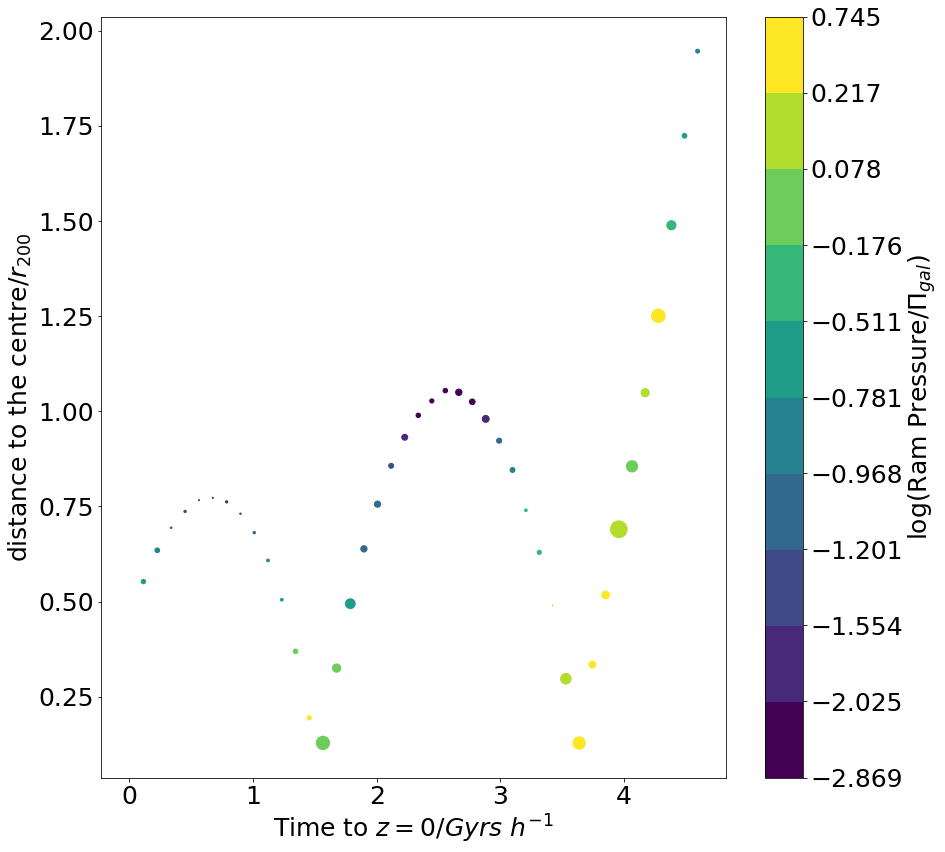

In [52]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.13696232471223435, 0.40573106544643656)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

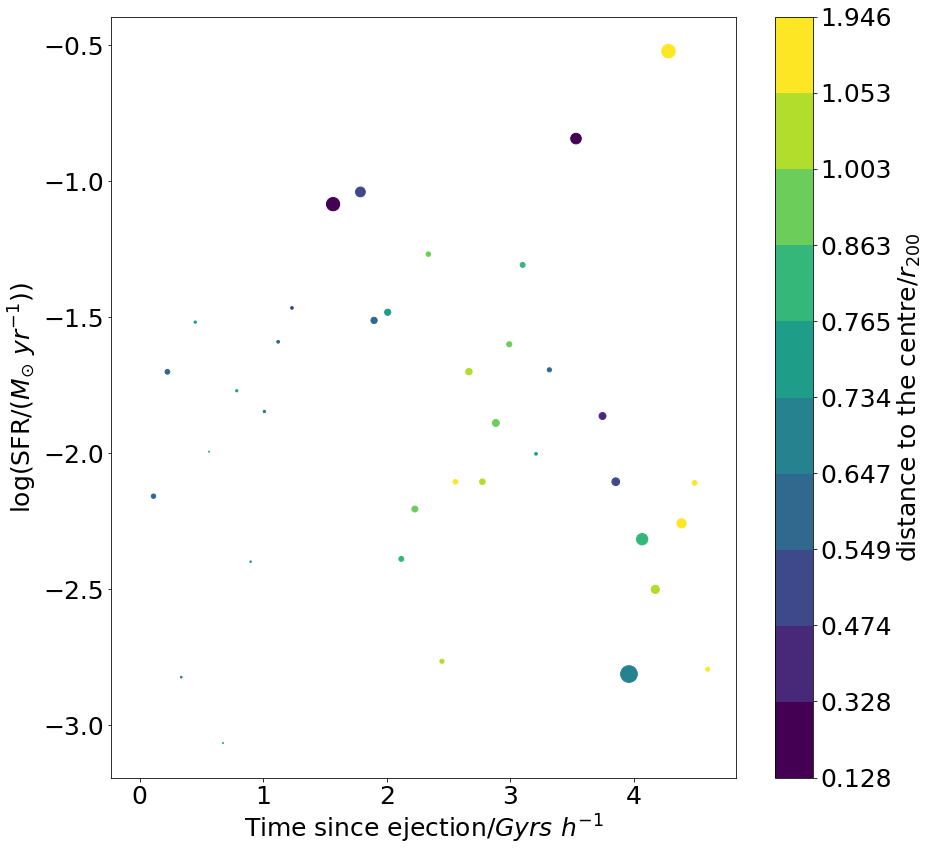

In [53]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

(0.16189332771208165, 0.3247986153245646)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

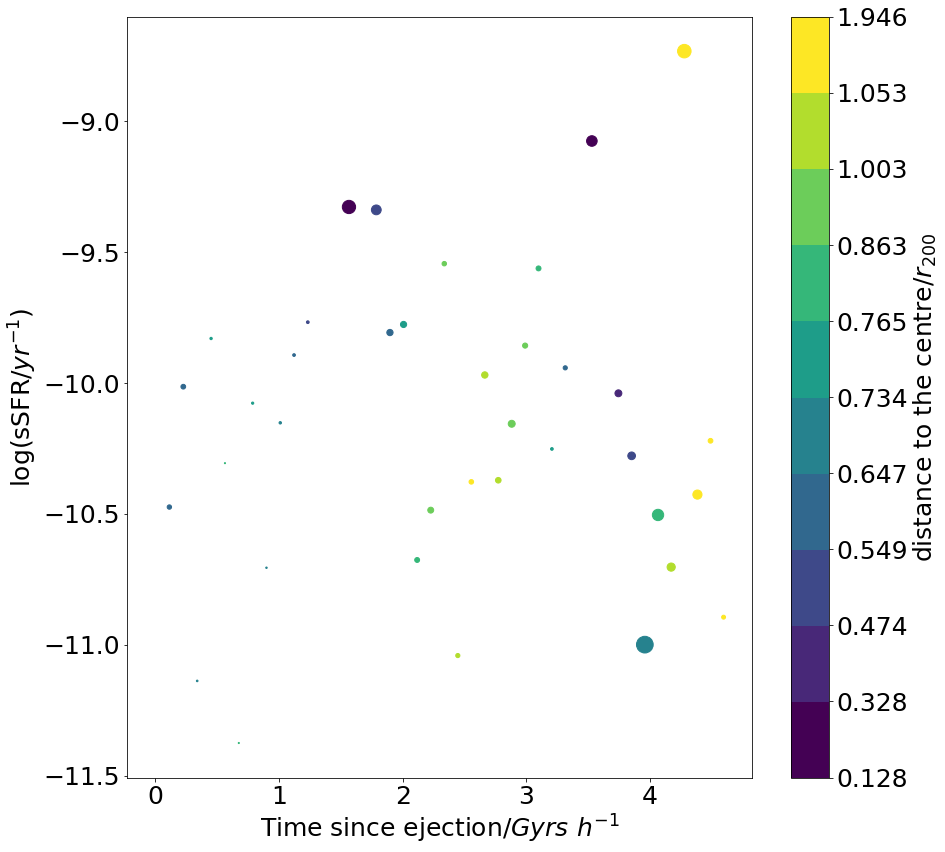

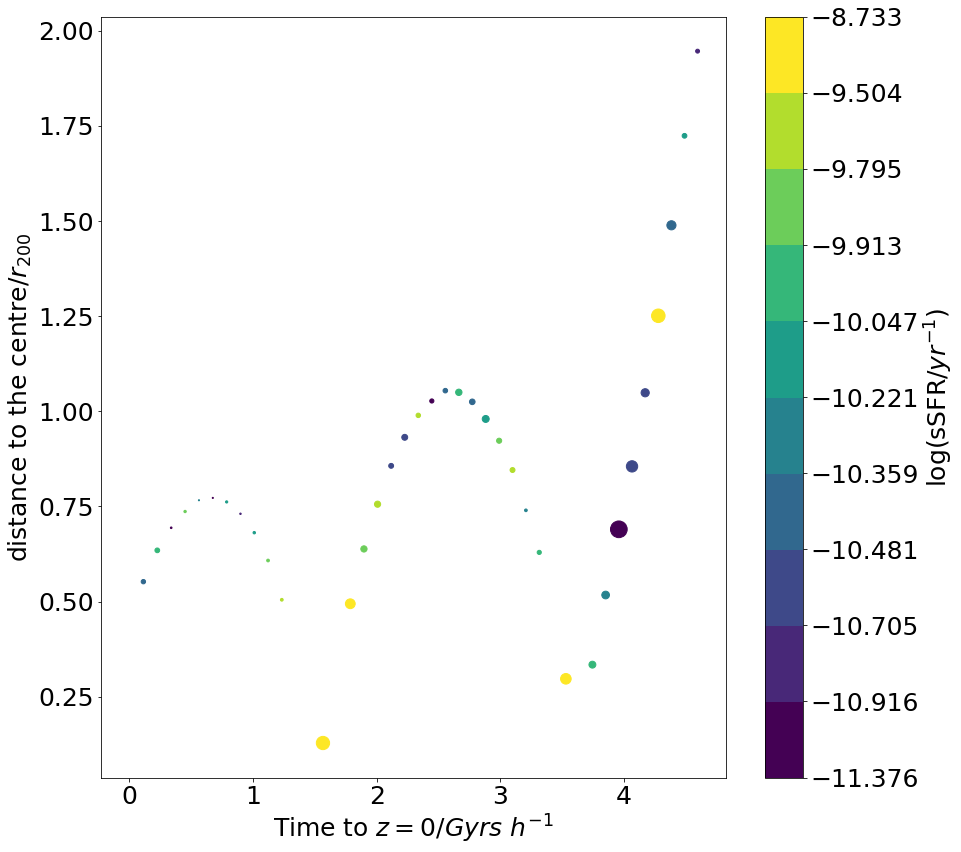

In [54]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.17180816930413068, 0.29563736305676525)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


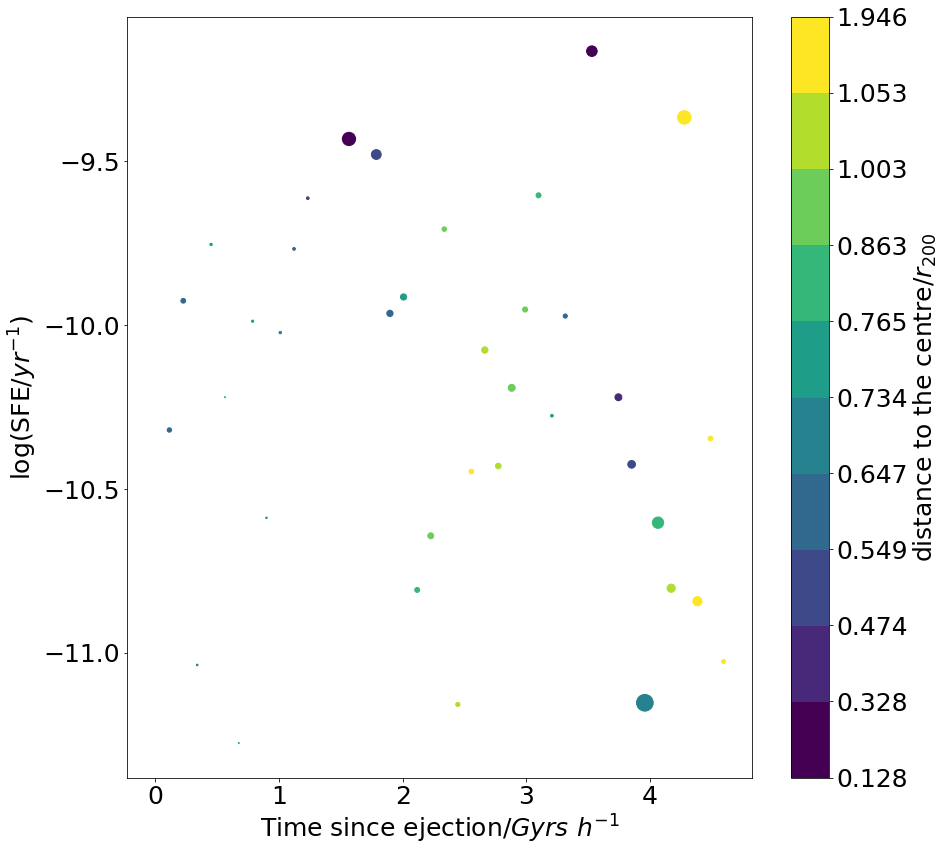

In [55]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

RPS_4339, Gas_4339, sSFR_4339, starMass_4339 = RPS, Gas, SFR/starMass, starMass
RPS_4339, Gas_4339, sSFR_4339, starMass_4339, RestForce_4339 = RPS, Gas, SFR/starMass, starMass, RestForce

FeHlo_4339, OFelo_4339 = FeHlo, OFelo 

In [56]:
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4341, 4337)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4341 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:113: RuntimeWarning: invalid value encountered in less_equal
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in less_equal


0.2594730228456261 0.3634722484955717


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

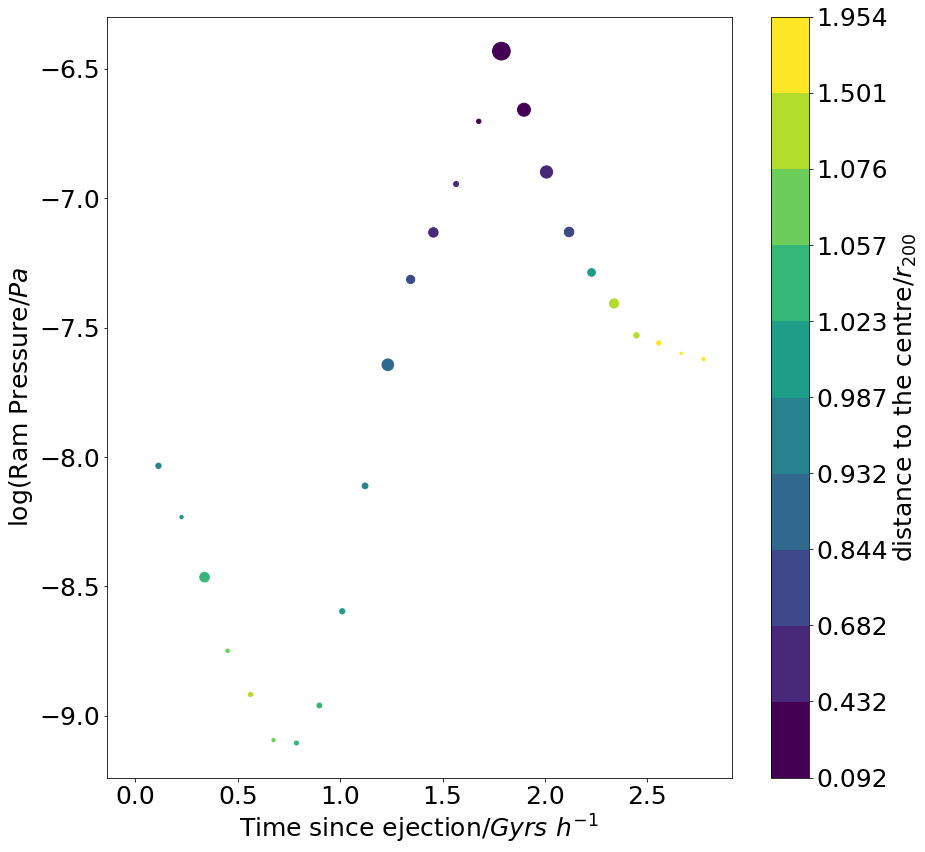

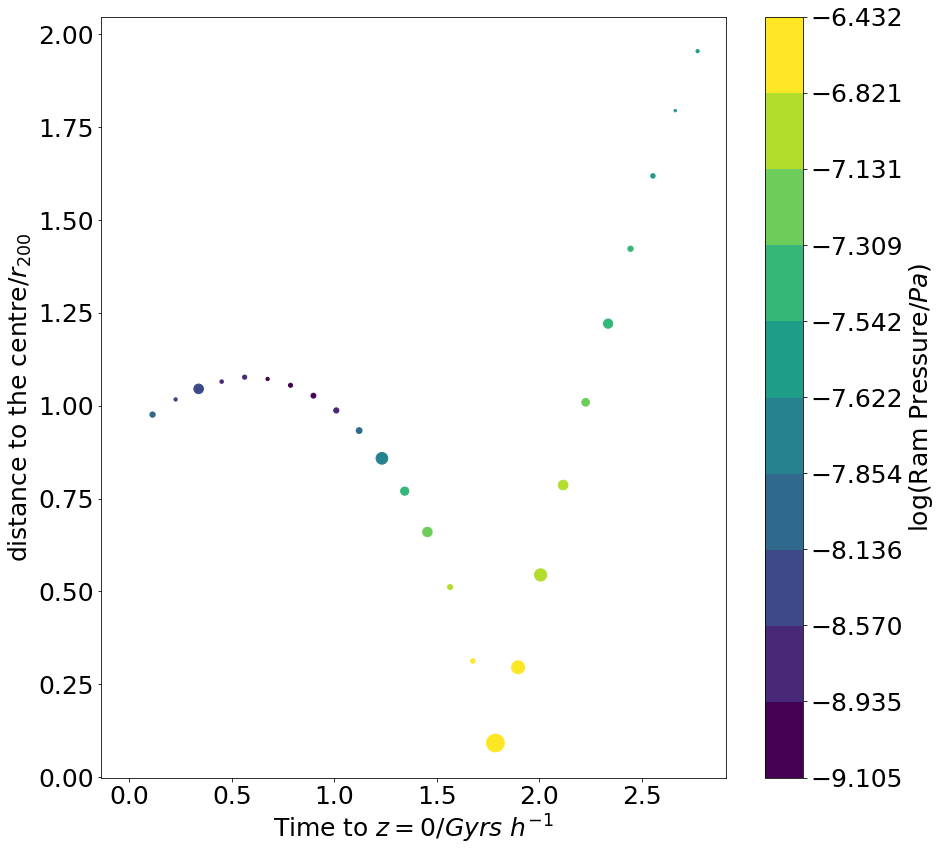

In [57]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.2594730228456261 0.3634722484955717


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

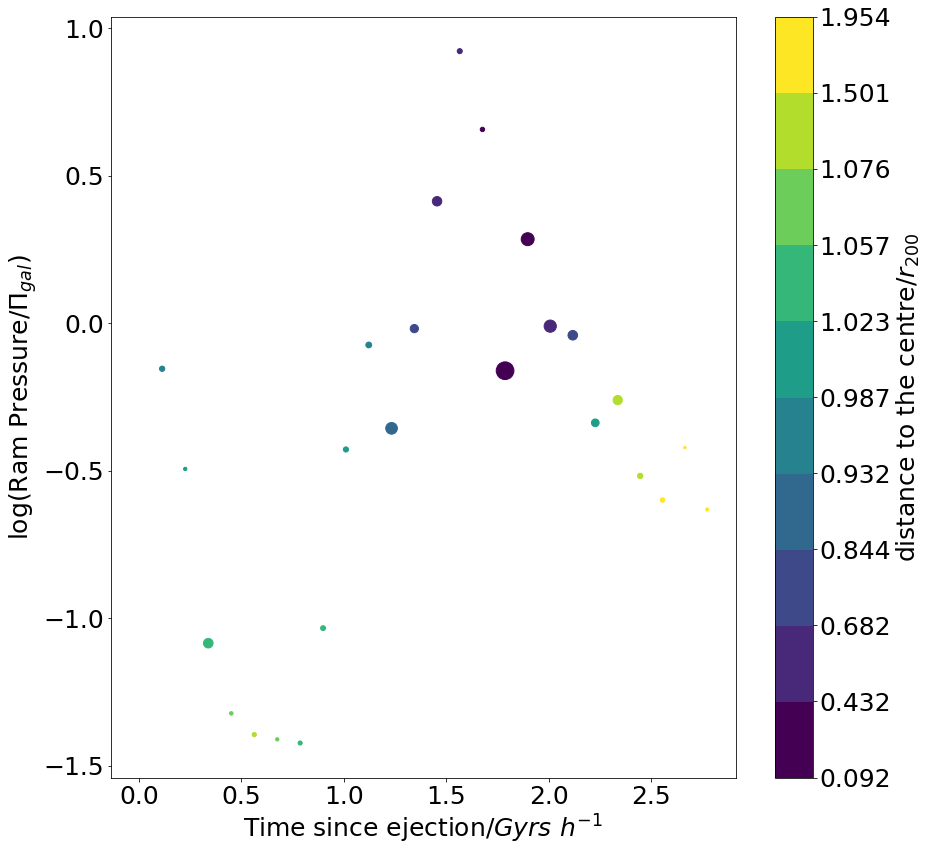

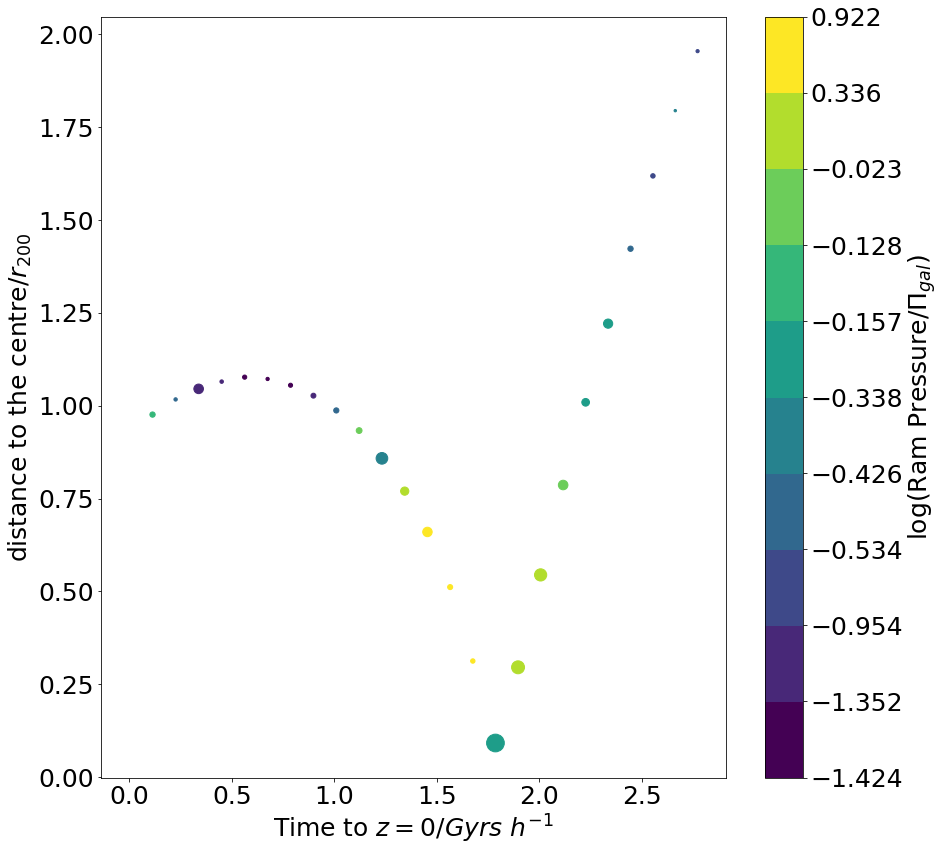

In [58]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS/RestForce), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.3946921432106021, 0.18198843826186292)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

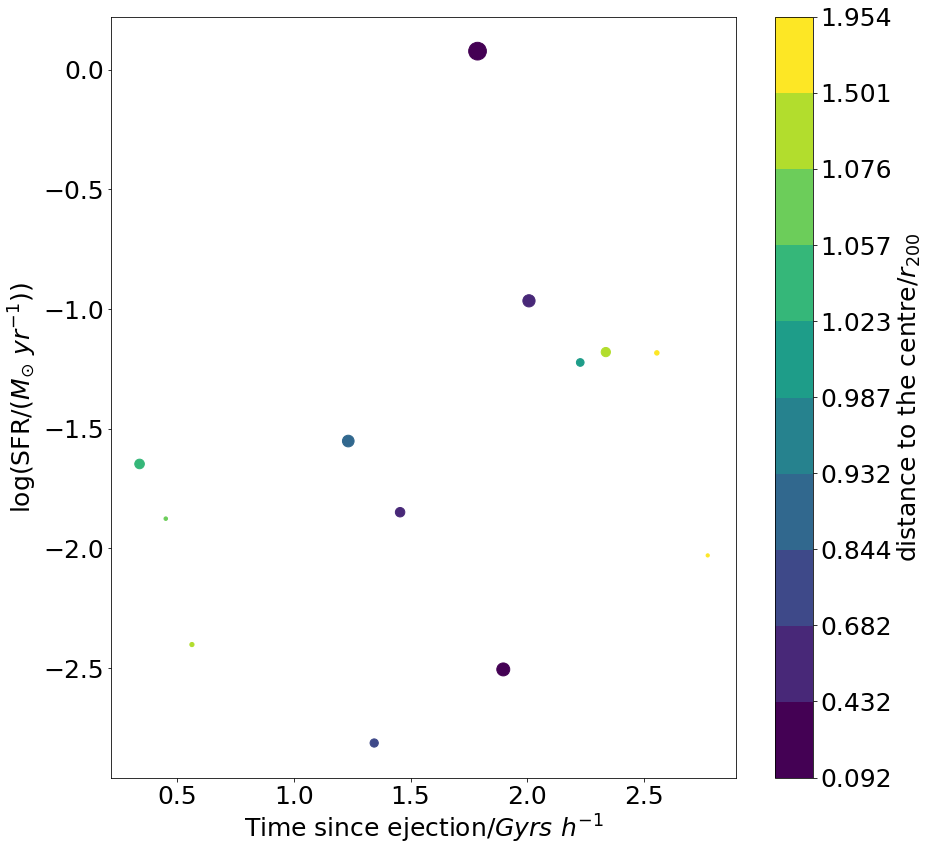

In [59]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

(0.4361110188513164, 0.13628479476292696)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

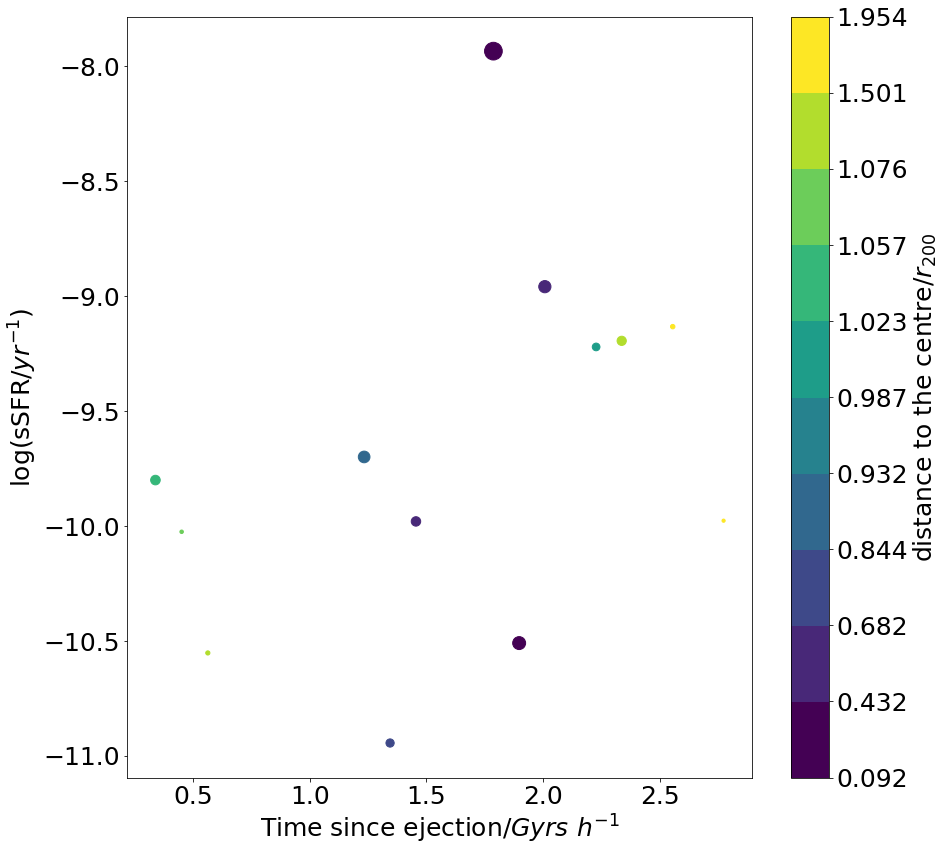

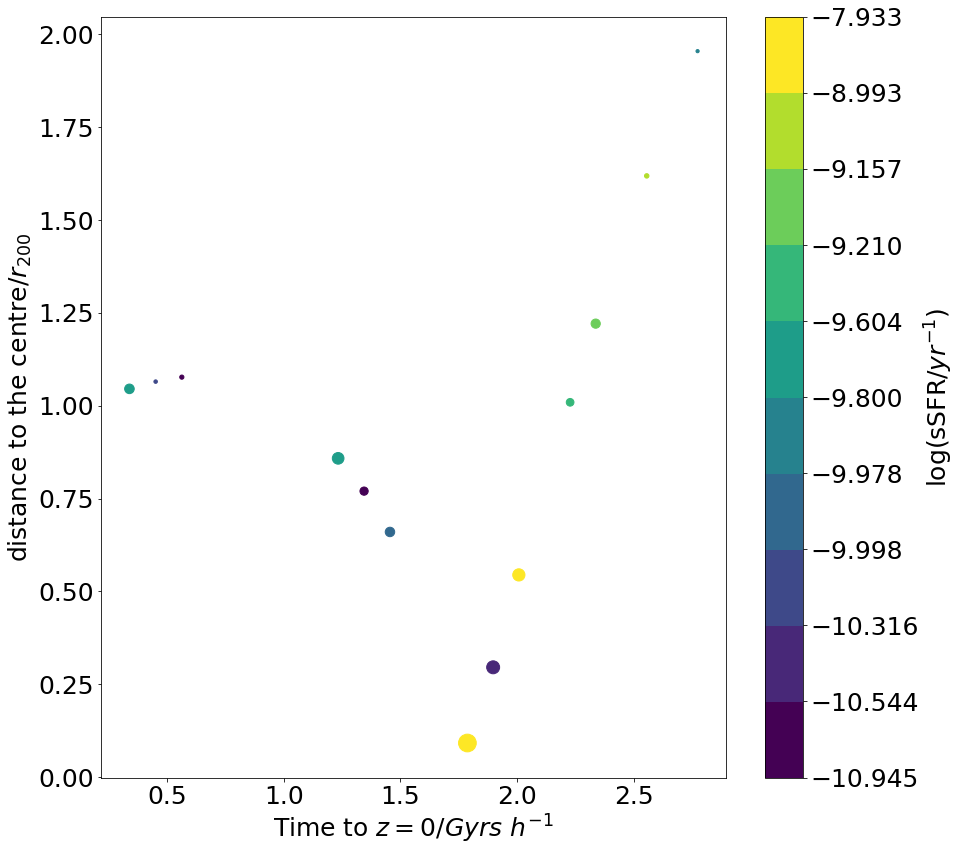

In [60]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.23669179258574452, 0.43622883845366367)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


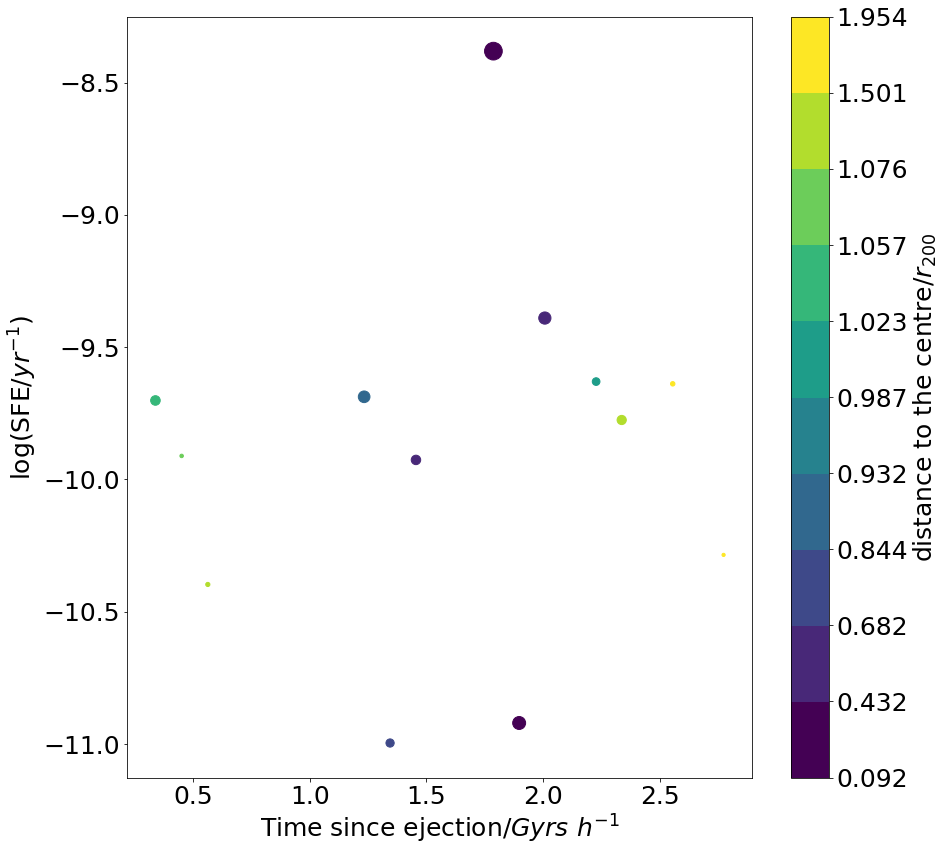

In [61]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

RPS_4341, Gas_4341, sSFR_4341, starMass_4341, RestForce_4341 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4341, OFelo_4341 = FeHlo, OFelo 

In [62]:
RPS, z, SFR, dist, RestForce, Gas, z1, z2, gasMass, starMass, FeHlo, OFelo, DE = getSFRs(4343, 4337)

it = np.where(RPS>0.)
RPS, z, SFR, dist, Gas, RestForce, gasMass, starMass = RPS[it], z[it], SFR[it], dist[it], Gas[it], RestForce[it], gasMass[it], starMass[it]
FeHlo, OFelo = FeHlo[it], OFelo[it]
DE_4343 = DE[it]

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:155: RuntimeWarning: invalid value encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:113: RuntimeWarning: invalid value encountered in less_equal
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in less_equal


0.7295044617356536 0.9193183477038258


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

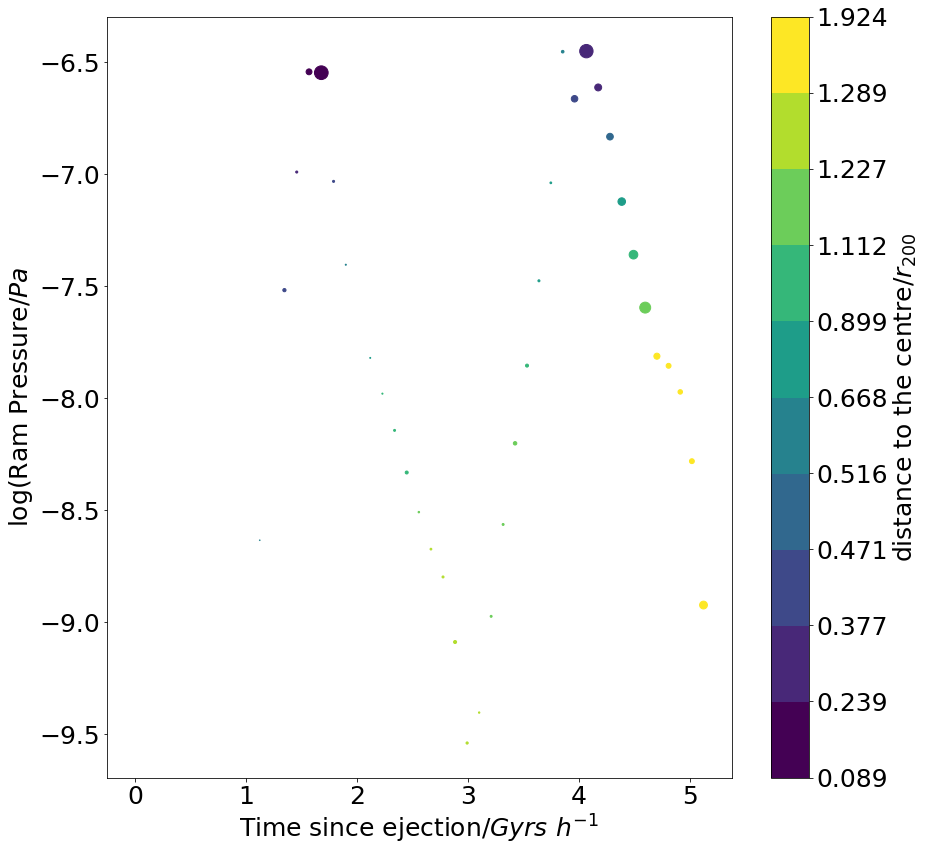

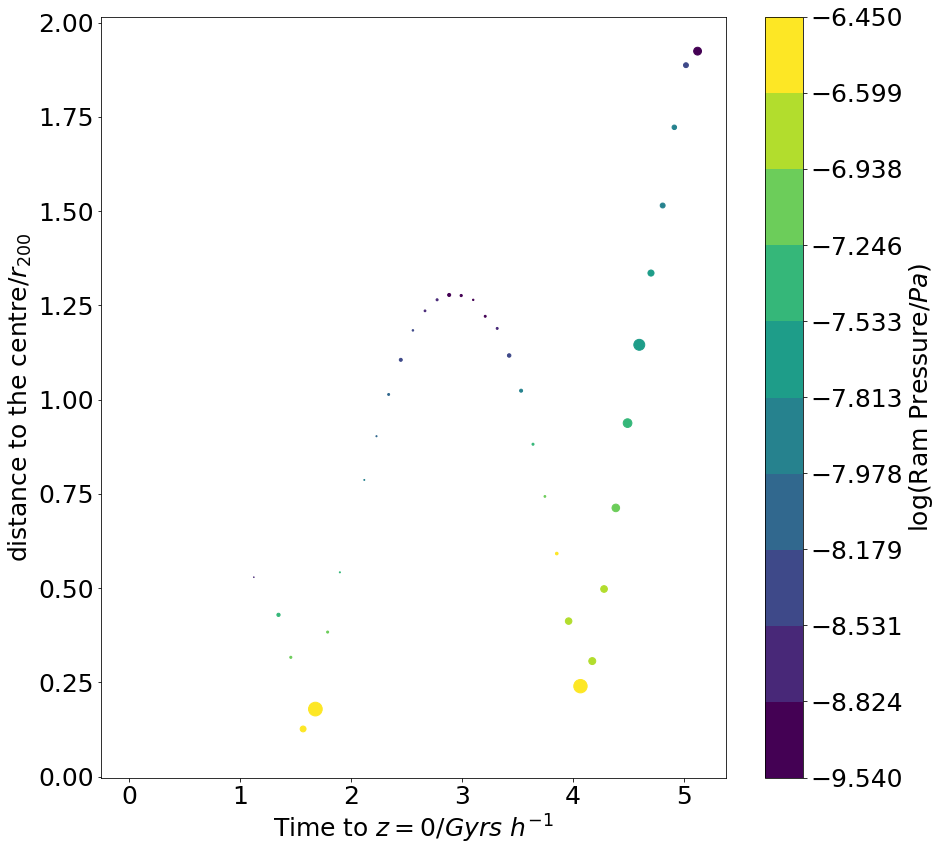

In [63]:
pl.figure(figsize=(14,14))

idd = np.where(dist<=2)
RPS, SFR, gasMass, starMass, Gas, dist , z, gasMass, RestForce = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd], z[idd], gasMass[idd], RestForce[idd]
tzu = Cosmo.lookback_time(z).value

vaper = np.linspace(0, 100, 11)
papels = np.percentile(dist, vaper)
norm = mpc.BoundaryNorm(boundaries=papels, ncolors=256)

pl.scatter(tzu, np.log10(RPS), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

tz1 = Cosmo.lookback_time(z1).value
tz2 = Cosmo.lookback_time(z2).value

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/Pa$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))

papels2 = np.percentile(np.log10(RPS), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/Pa)$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

0.7295044617356536 0.9193183477038258


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in true_divide


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

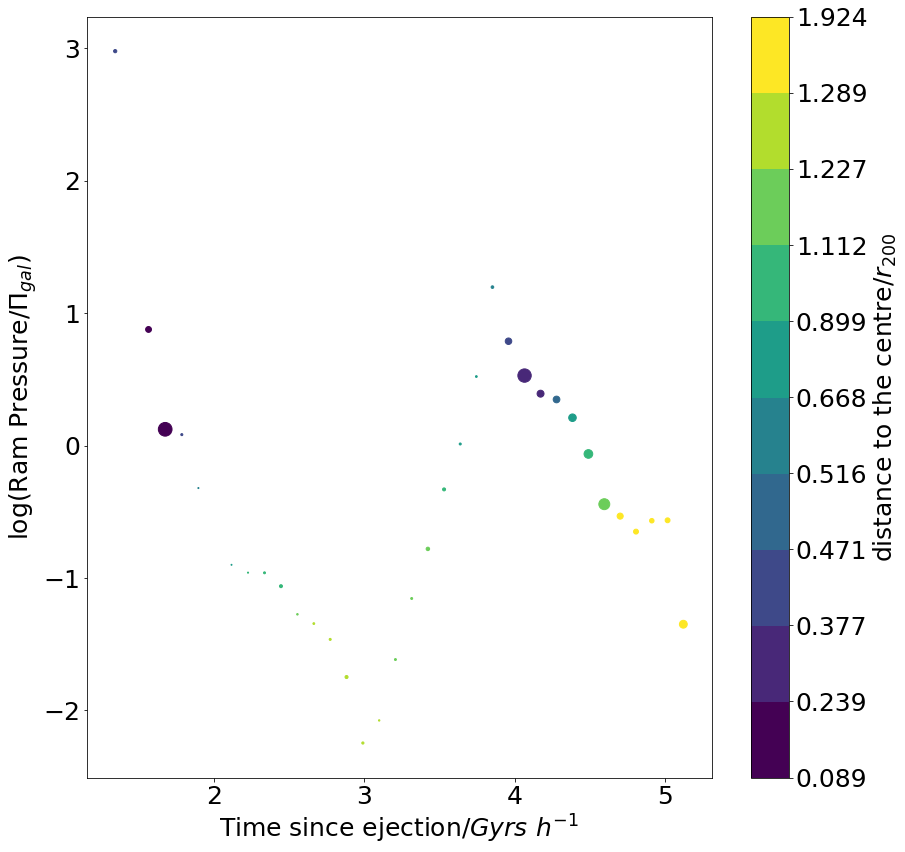

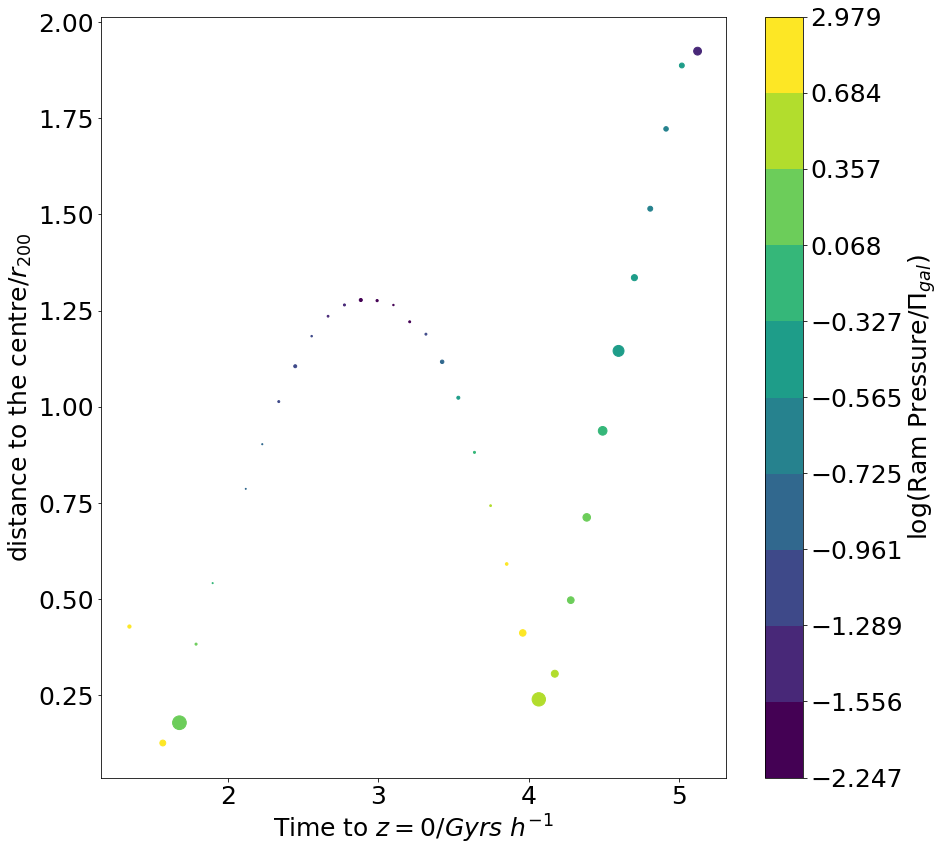

In [64]:
pl.figure(figsize=(14,14))

pl.scatter(tzu, np.log10(RPS/RestForce), s=Gas/5e5, c=dist, norm=norm)

# pl.scatter(tzu, np.log10(RPS), c=dist, norm=norm)

# pl.arrow(tz1, -100., 0., 200, color='black', ls=':')
# pl.arrow(tz2, -100., 0., 200, color='black', ls=':')

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

# pl.ylabel('log(Ram Pressure/Pa)')
pl.ylabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

print(z1, z2)

pl.figure(figsize=(14,14))


ii = np.where((np.isnan(np.log10(RPS/RestForce))==False) & (np.isinf(np.log10(RPS/RestForce))==False))
papels2 = np.percentile(np.log10(RPS[ii]/RestForce[ii]), vaper)
norm2 = mpc.BoundaryNorm(boundaries=papels2, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=np.log10(RPS/RestForce), norm=norm2)

bar = pl.colorbar(label='$\log($Ram Pressure$/\Pi_{gal})$')
bar.set_ticks(papels2)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.2810440374723387, 0.1939284662929092)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 0, 'Time since ejection/$Gyrs\\,\\,h^{-1}$')

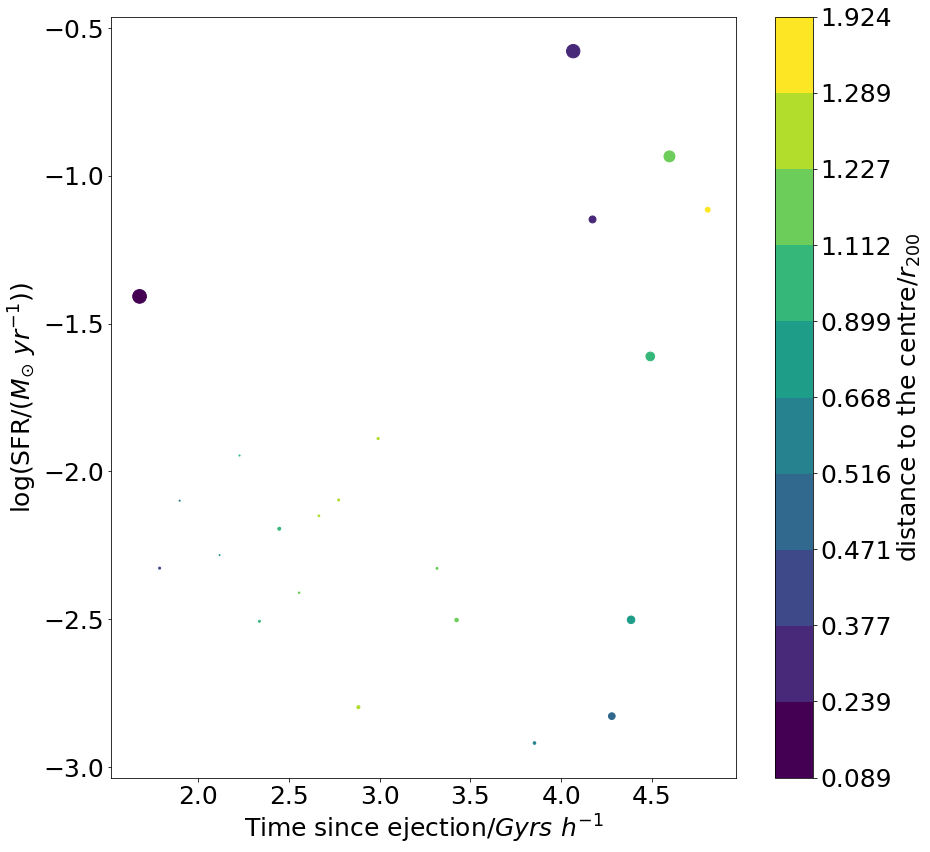

In [65]:
pl.figure(figsize=(14,14))

# idd = np.where(dist<=3)
# RPS, SFR, gasMass, starMass, Gas, dist = RPS[idd], SFR[idd], gasMass[idd], starMass[idd], Gas[idd], dist[idd]

lRPS, lSFR = np.log10(RPS), np.log10(SFR)
pl.scatter(tzu, lSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lSFR)==False))

print(sp.pearsonr(lRPS[inan], lSFR[inan]))

bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFR$/(M_{\odot}\,\,yr^{-1}))$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')



(0.29555929340289294, 0.17092849278601518)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 0, 'Time to $z=0$/$Gyrs\\,\\,h^{-1}$')

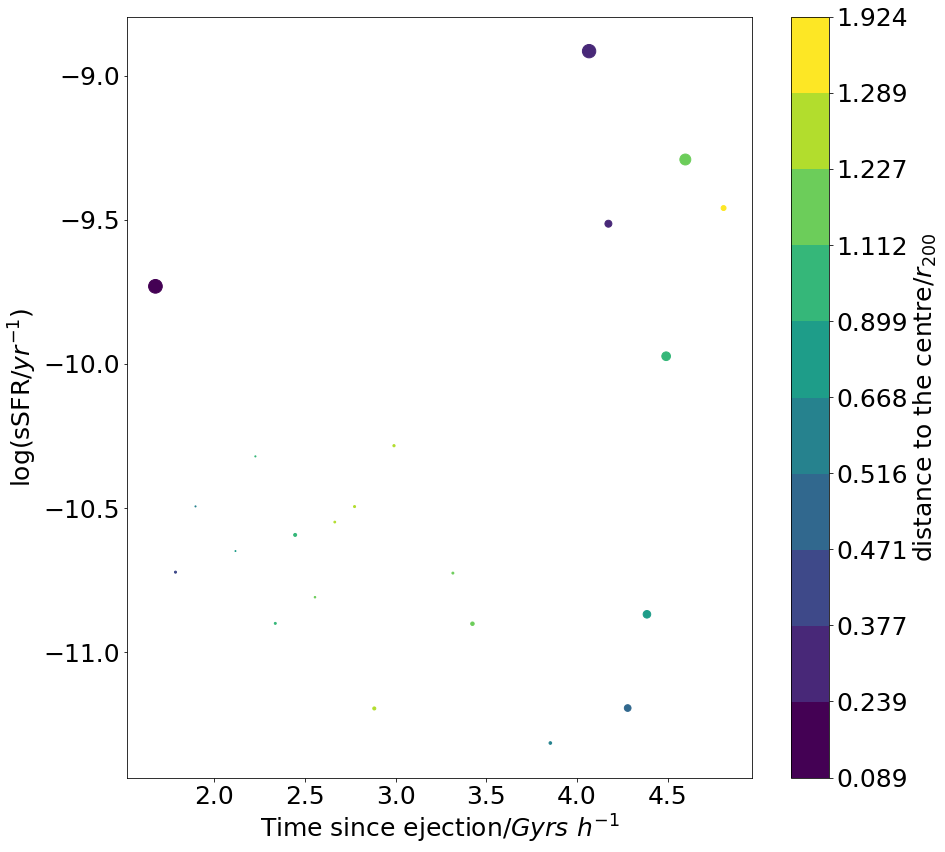

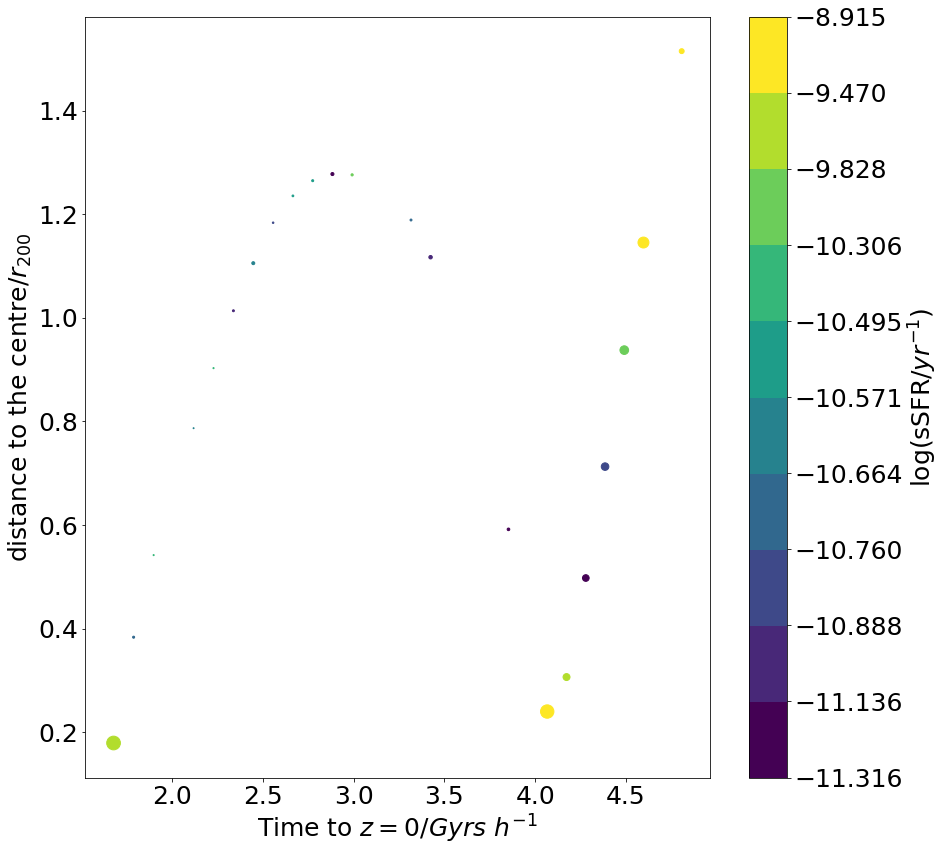

In [66]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/starMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($sSFR$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

pl.figure(figsize=(14,14))

papels3 = np.percentile(lsSFR[inan], vaper)
norm3 = mpc.BoundaryNorm(boundaries=papels3, ncolors=256)

pl.scatter(tzu, dist, s=Gas/5e5, c=lsSFR, norm=norm3)

bar = pl.colorbar(label='$\log($sSFR$/yr^{-1})$')
bar.set_ticks(papels3)

pl.ylabel('distance to the centre/$r_{200}$')
pl.xlabel('Time to $z=0$/$Gyrs\,\,h^{-1}$')

(0.21784951784131362, 0.31800464002633544)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


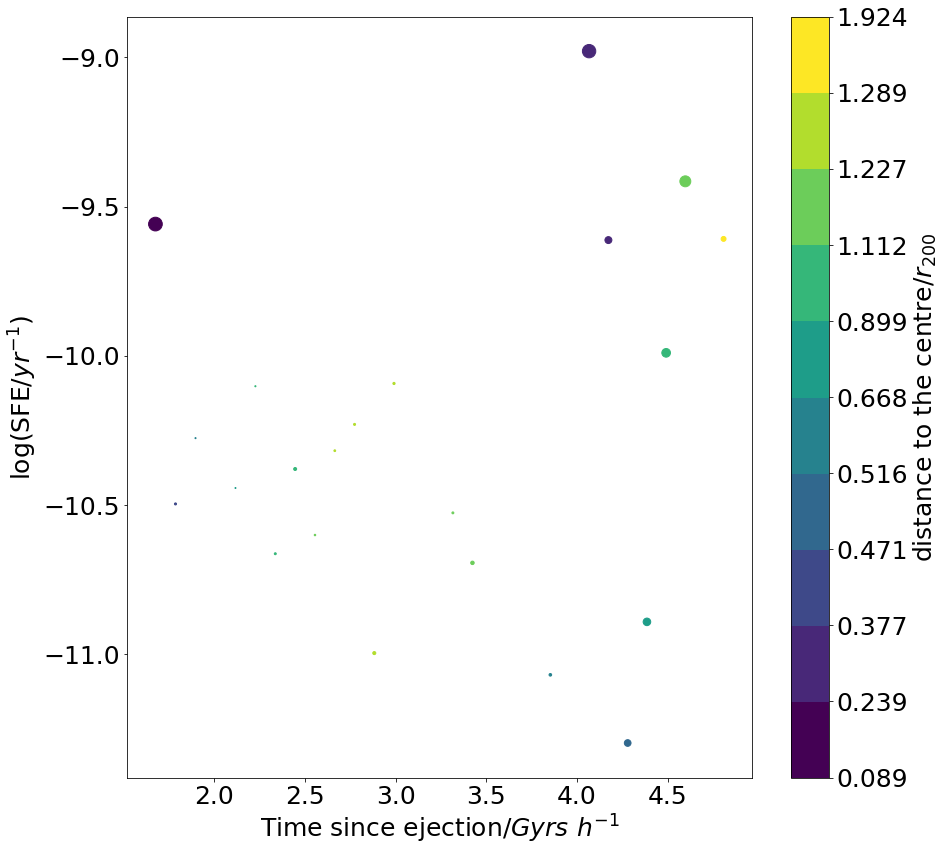

In [67]:
pl.figure(figsize=(14,14))

lsSFR = np.log10(SFR/gasMass)
pl.scatter(tzu, lsSFR, s=Gas/5e5, c=dist, norm=norm)

inan = np.where((np.isnan(lRPS)==False) & (np.isnan(lsSFR)==False) &(np.isinf(lRPS)==False) & (np.isinf(lsSFR)==False))

print(sp.pearsonr(lRPS[inan], lsSFR[inan]))


bar = pl.colorbar(label='distance to the centre/$r_{200}$')
bar.set_ticks(papels)

pl.ylabel('$\log($SFE$/yr^{-1})$')
# pl.xlabel('log(Ram Pressure/$Pa$)')
pl.xlabel('Time since ejection/$Gyrs\,\,h^{-1}$')

RPS_4343, Gas_4343, sSFR_4343, starMass_4343, RestForce_4343 = RPS, Gas, SFR/starMass, starMass, RestForce
FeHlo_4343, OFelo_4343 = FeHlo, OFelo 

In [68]:
# with h5py.File('Densities.h5', 'w') as f:
#     f.create_dataset('g4338/Densities', data=DE_4338)
#     f.create_dataset('g4339/Densities', data=DE_4339)
#     f.create_dataset('g4341/Densities', data=DE_4341)
#     f.create_dataset('g4343/Densities', data=DE_4343)
    
#     f.create_dataset('g4470/Densities', data=DE_4470)
#     f.create_dataset('g4471/Densities', data=DE_4471)
#     f.create_dataset('g4473/Densities', data=DE_4473)
#     f.create_dataset('g4474/Densities', data=DE_4474)

In [5]:
T = h5py.File('Derived_Data_3.h5', 'r')

dist_4338 = T['g4338/distance'][()]
Time_4338 = T['g4338/time'][()]
cosC_4338 = T['g4338/CosCen'][()]
cosV_4338 = T['g4338/CosVel'][()]
RP_4338 = T['g4338/RP'][()]
TSt_4338 = T['g4338/TSt'][()]
gMass_4338 = T['g4338/gMass'][()]
SFR_4338 = T['g4338/SFR'][()]
starMass_4338 = T['g4338/starMass'][()]
Gas_4338 = T['g4338/Gas'][()]
RestForce_4338 = T['g4338/RestForce'][()]

dist_4339 = T['g4339/distance'][()]
Time_4339 = T['g4339/time'][()]
cosC_4339 = T['g4339/CosCen'][()]
cosV_4339 = T['g4339/CosVel'][()]
RP_4339 = T['g4339/RP'][()]
TSt_4339 = T['g4339/TSt'][()]
gMass_4339 = T['g4339/gMass'][()]
SFR_4339 = T['g4339/SFR'][()]
starMass_4339 = T['g4339/starMass'][()]
Gas_4339 = T['g4339/Gas'][()]
RestForce_4339 = T['g4339/RestForce'][()]

dist_4341 = T['g4341/distance'][()]
Time_4341 = T['g4341/time'][()]
cosC_4341 = T['g4341/CosCen'][()]
cosV_4341 = T['g4341/CosVel'][()]
RP_4341 = T['g4341/RP'][()]
TSt_4341 = T['g4341/TSt'][()]
gMass_4341 = T['g4341/gMass'][()]
SFR_4341 = T['g4341/SFR'][()]
starMass_4341 = T['g4341/starMass'][()]
Gas_4341 = T['g4341/Gas'][()]
RestForce_4341 = T['g4341/RestForce'][()]

dist_4343 = T['g4343/distance'][()]
Time_4343 = T['g4343/time'][()]
cosC_4343 = T['g4343/CosCen'][()]
cosV_4343 = T['g4343/CosVel'][()]
RP_4343 = T['g4343/RP'][()]
TSt_4343 = T['g4343/TSt'][()]
gMass_4343 = T['g4343/gMass'][()]
SFR_4343 = T['g4343/SFR'][()]
starMass_4343 = T['g4343/starMass'][()]
Gas_4343 = T['g4343/Gas'][()]
RestForce_4343 = T['g4343/RestForce'][()]

dist_4470 = T['g4470/distance'][()]
Time_4470 = T['g4470/time'][()]
cosC_4470 = T['g4470/CosCen'][()]
cosV_4470 = T['g4470/CosVel'][()]
RP_4470 = T['g4470/RP'][()]
TSt_4470 = T['g4470/TSt'][()]
gMass_4470 = T['g4470/gMass'][()]
SFR_4470 = T['g4470/SFR'][()]
starMass_4470 = T['g4470/starMass'][()]
Gas_4470 = T['g4470/Gas'][()]
RestForce_4470 = T['g4470/RestForce'][()]

dist_4471 = T['g4471/distance'][()]
Time_4471 = T['g4471/time'][()]
cosC_4471 = T['g4471/CosCen'][()]
cosV_4471 = T['g4471/CosVel'][()]
RP_4471 = T['g4471/RP'][()]
TSt_4471 = T['g4471/TSt'][()]
gMass_4471 = T['g4471/gMass'][()]
SFR_4471 = T['g4471/SFR'][()]
starMass_4471 = T['g4471/starMass'][()]
Gas_4471 = T['g4471/Gas'][()]
RestForce_4471 = T['g4471/RestForce'][()]

dist_4473 = T['g4473/distance'][()]
Time_4473 = T['g4473/time'][()]
cosC_4473 = T['g4473/CosCen'][()]
cosV_4473 = T['g4473/CosVel'][()]
RP_4473 = T['g4473/RP'][()]
TSt_4473 = T['g4473/TSt'][()]
gMass_4473 = T['g4473/gMass'][()]
SFR_4473 = T['g4473/SFR'][()]
starMass_4473 = T['g4473/starMass'][()]
Gas_4473 = T['g4473/Gas'][()]
RestForce_4473 = T['g4473/RestForce'][()]

dist_4474 = T['g4474/distance'][()]
Time_4474 = T['g4474/time'][()]
cosC_4474 = T['g4474/CosCen'][()]
cosV_4474 = T['g4474/CosVel'][()]
RP_4474 = T['g4474/RP'][()]
TSt_4474 = T['g4474/TSt'][()]
gMass_4474 = T['g4474/gMass'][()]
SFR_4474 = T['g4474/SFR'][()]
starMass_4474 = T['g4474/starMass'][()]
Gas_4474 = T['g4474/Gas'][()]
RestForce_4474 = T['g4474/RestForce'][()]

RPS_4338 = RP_4338
RPS_4339 = RP_4339
RPS_4341 = RP_4341
RPS_4343 = RP_4343

RPS_4470 = RP_4470
RPS_4471 = RP_4471
RPS_4473 = RP_4473
RPS_4474 = RP_4474

sSFR_4338 = SFR_4338/starMass_4338
sSFR_4339 = SFR_4339/starMass_4339
sSFR_4341 = SFR_4341/starMass_4341
sSFR_4343 = SFR_4343/starMass_4343

sSFR_4470 = SFR_4470/starMass_4470
sSFR_4471 = SFR_4471/starMass_4471
sSFR_4473 = SFR_4473/starMass_4473
sSFR_4474 = SFR_4474/starMass_4474

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWar

Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

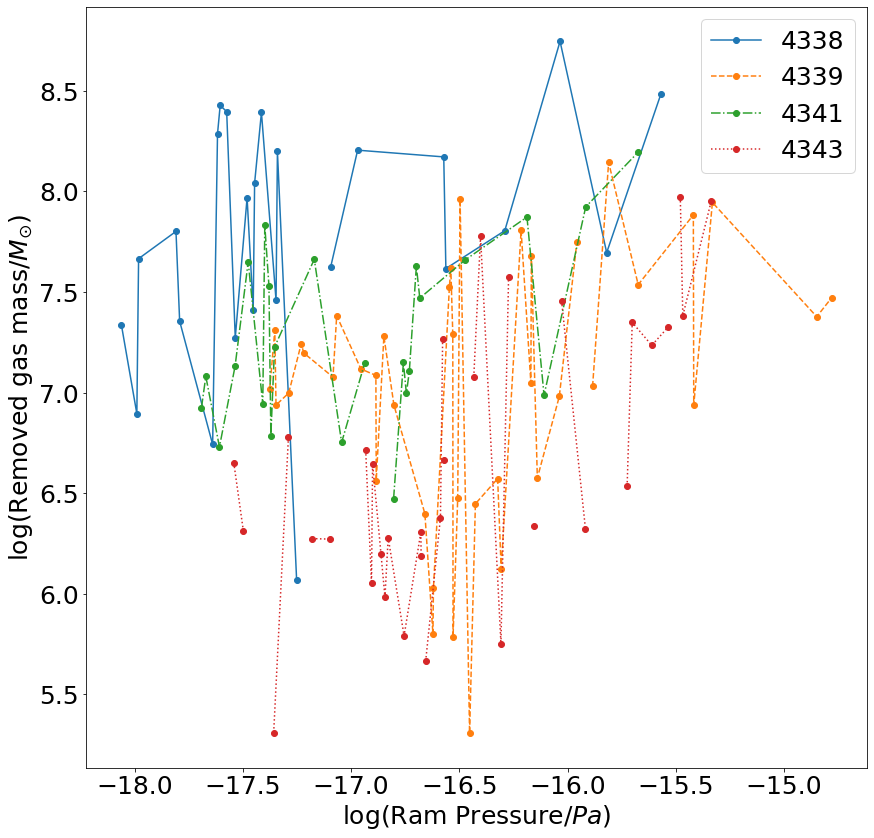

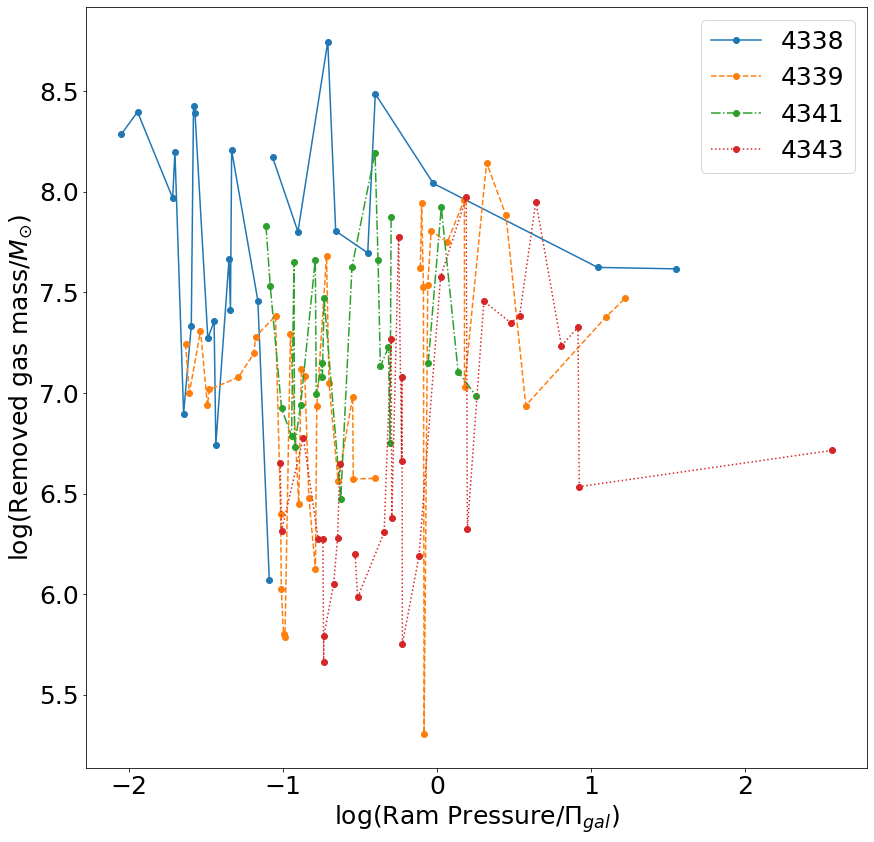

In [6]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(RPS_4338)
ii_4339 = np.argsort(RPS_4339)
ii_4341 = np.argsort(RPS_4341)
ii_4343 = np.argsort(RPS_4343)

pl.plot(np.log10(RPS_4338[ii_4338]), np.log10(Gas_4338[ii_4338]), label='4338', marker='o',ls='-')
pl.plot(np.log10(RPS_4339[ii_4339]), np.log10(Gas_4339[ii_4339]), label='4339', marker='o',ls='--')
pl.plot(np.log10(RPS_4341[ii_4341]), np.log10(Gas_4341[ii_4341]), label='4341', marker='o',ls='-.')
pl.plot(np.log10(RPS_4343[ii_4343]), np.log10(Gas_4343[ii_4343]), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/Pa)$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

pl.figure(figsize=(14,14))

ii_4338 = np.argsort(RPS_4338/RestForce_4338)
ii_4339 = np.argsort(RPS_4339/RestForce_4339)
ii_4341 = np.argsort(RPS_4341/RestForce_4341)
ii_4343 = np.argsort(RPS_4343/RestForce_4343)

pl.plot(np.log10(RPS_4338[ii_4338]/RestForce_4338[ii_4338]), np.log10(Gas_4338[ii_4338]), label='4338', marker='o',ls='-')
pl.plot(np.log10(RPS_4339[ii_4339]/RestForce_4339[ii_4339]), np.log10(Gas_4339[ii_4339]), label='4339', marker='o',ls='--')
pl.plot(np.log10(RPS_4341[ii_4341]/RestForce_4341[ii_4341]), np.log10(Gas_4341[ii_4341]), label='4341', marker='o',ls='-.')
pl.plot(np.log10(RPS_4343[ii_4343]/RestForce_4343[ii_4343]), np.log10(Gas_4343[ii_4343]), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: 

Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

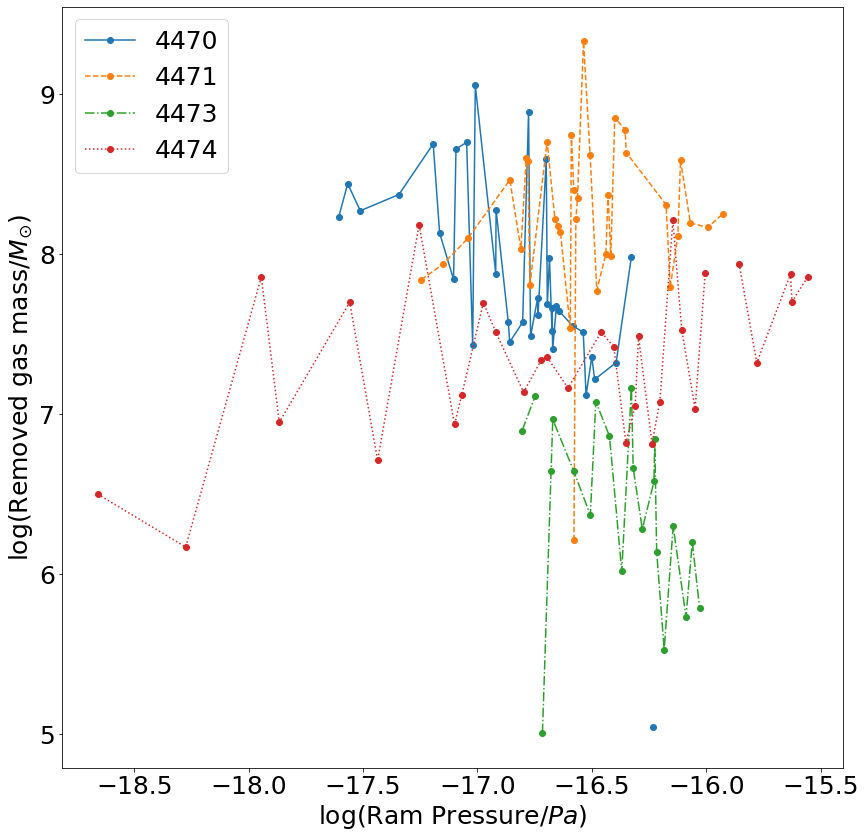

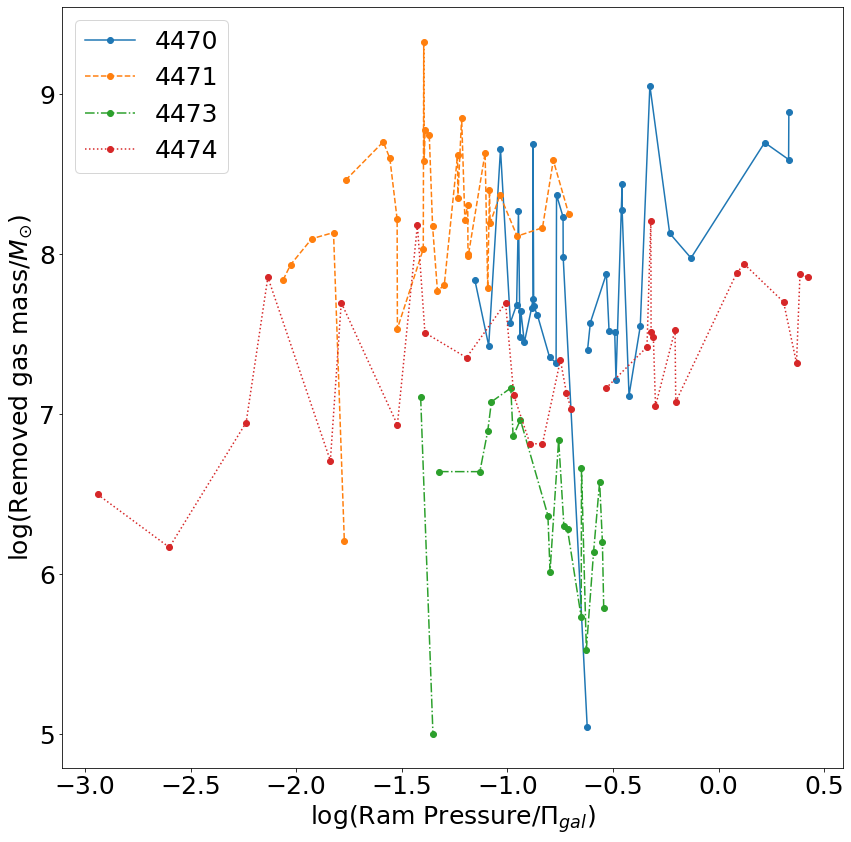

In [7]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(RPS_4470)
ii_4471 = np.argsort(RPS_4471)
ii_4473 = np.argsort(RPS_4473)
ii_4474 = np.argsort(RPS_4474)

pl.plot(np.log10(RPS_4470[ii_4470]), np.log10(Gas_4470[ii_4470]), label='4470', marker='o',ls='-')
pl.plot(np.log10(RPS_4471[ii_4471]), np.log10(Gas_4471[ii_4471]), label='4471', marker='o',ls='--')
pl.plot(np.log10(RPS_4473[ii_4473]), np.log10(Gas_4473[ii_4473]), label='4473', marker='o',ls='-.')
pl.plot(np.log10(RPS_4474[ii_4474]), np.log10(Gas_4474[ii_4474]), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/Pa)$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

pl.figure(figsize=(14,14))

ii_4470 = np.argsort(RPS_4470/RestForce_4470)
ii_4471 = np.argsort(RPS_4471/RestForce_4471)
ii_4473 = np.argsort(RPS_4473/RestForce_4473)
ii_4474 = np.argsort(RPS_4474/RestForce_4474)

pl.plot(np.log10(RPS_4470[ii_4470]/RestForce_4470[ii_4470]), np.log10(Gas_4470[ii_4470]), label='4470', marker='o',ls='-')
pl.plot(np.log10(RPS_4471[ii_4471]/RestForce_4471[ii_4471]), np.log10(Gas_4471[ii_4471]), label='4471', marker='o',ls='--')
pl.plot(np.log10(RPS_4473[ii_4473]/RestForce_4473[ii_4473]), np.log10(Gas_4473[ii_4473]), label='4473', marker='o',ls='-.')
pl.plot(np.log10(RPS_4474[ii_4474]/RestForce_4474[ii_4474]), np.log10(Gas_4474[ii_4474]), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

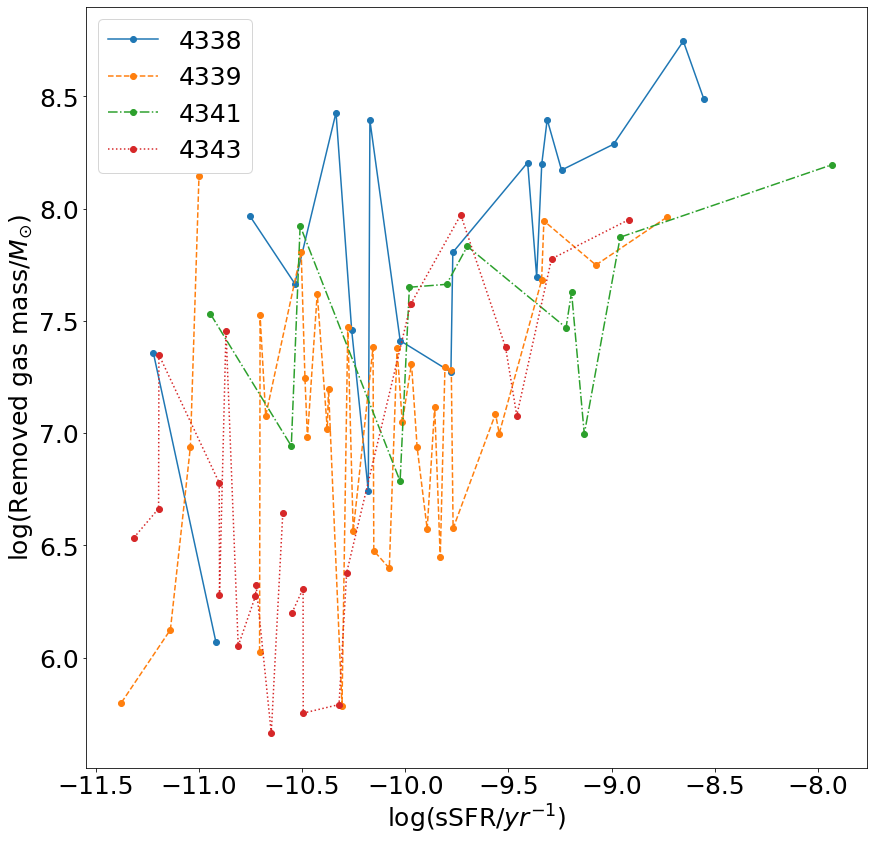

In [8]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(sSFR_4338)
ii_4339 = np.argsort(sSFR_4339)
ii_4341 = np.argsort(sSFR_4341)
ii_4343 = np.argsort(sSFR_4343)

pl.plot(np.log10(sSFR_4338[ii_4338]), np.log10(Gas_4338[ii_4338]), label='4338', marker='o',ls='-')
pl.plot(np.log10(sSFR_4339[ii_4339]), np.log10(Gas_4339[ii_4339]), label='4339', marker='o',ls='--')
pl.plot(np.log10(sSFR_4341[ii_4341]), np.log10(Gas_4341[ii_4341]), label='4341', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4343[ii_4343]), np.log10(Gas_4343[ii_4343]), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

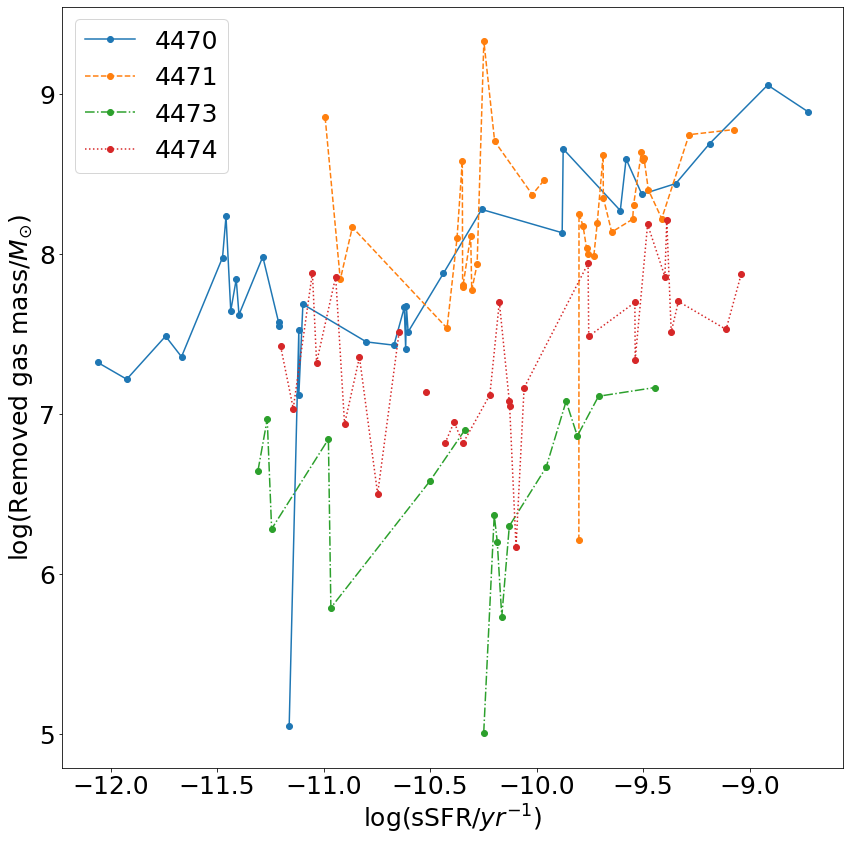

In [9]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(sSFR_4470)
ii_4471 = np.argsort(sSFR_4471)
ii_4473 = np.argsort(sSFR_4473)
ii_4474 = np.argsort(sSFR_4474)

pl.plot(np.log10(sSFR_4470[ii_4470]), np.log10(Gas_4470[ii_4470]), label='4470', marker='o',ls='-')
pl.plot(np.log10(sSFR_4471[ii_4471]), np.log10(Gas_4471[ii_4471]), label='4471', marker='o',ls='--')
pl.plot(np.log10(sSFR_4473[ii_4473]), np.log10(Gas_4473[ii_4473]), label='4473', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4474[ii_4474]), np.log10(Gas_4474[ii_4474]), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

In [10]:
# ok, the relation sSFR with metallicity
# ok, lets calculate some ram pressures with only hot gas densities, this will be reduced a lot
Msun = 1.988*1e30
kpc = 3.086*1e16


# ok, lets test tha tidal stripping at peri
Msun = 1.988*1e30 # msun in kg
kpc = 3.086*1e16 # kpc in m
G = 4.3*1e-6 # kpc/M_sun km^2/s^2
DMmass = sim['SnapNumber_128/Header/MassTable'][1]

def getMet(idd, iddC, snap):
    # get tidal form anything around , lets say I dont know, what i think is close
    # 200 kpc is almost the virial radius, so 100 kpc should be good, and the center always, obviously.
    
    optRadius = sim['SnapNumber_{}/SubGroups/OpticalRadius'.format(snap)][idd]
    offGas = sim['SnapNumber_{}/SubGroups/PartType0/Offsets'.format(snap)][idd].astype('int')
    
    posGal = sim['SnapNumber_{}/SubGroups/SubGroupPos'.format(snap)][idd]
    posPart = sim['SnapNumber_{}/PartType0/Coordinates'.format(snap)][offGas[0]:offGas[1]]
    rpart = np.sqrt((posPart[:,0] - posGal[0])**2+(posPart[:,1] - posGal[1])**2+(posPart[:,2] - posGal[2])**2)
    index = np.arange(offGas[0], offGas[1])
    ii = np.where(rpart<optRadius)[0]
    indexR = index[ii]
    
    Abund = sim['SnapNumber_{}/PartType0/Abundances'.format(snap)][indexR]
    
    TFeH = np.log10((Abund[:,4]/FeMass)/(Abund[:,6]/HMass)) - NfeNhe_sun
    TOFe = np.log10((Abund[:,3]/OMass)/(Abund[:,4]/FeMass)) - NoNfe_sun
    
    ife = np.where((np.isnan(TFeH)==False) & (np.isinf(TFeH)==False))
    io = np.where((np.isnan(TOFe)==False) & (np.isinf(TOFe)==False))
    
    TFeH = TFeH[ife]
    TOFe = TOFe[io]

    
    return np.median(TFeH), np.median(TOFe)

def getMetTime(gal, central):
    
    z, FeH, OFe, snaplist, dist = [], [], [], [], []
    
    Idlist, snapst  = [], []
    
    group = sim['SnapNumber_128/SubGroups/GroupNumber'][central]
    r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]
    
    uniqueID = int(127*1e6+gal)
    stree = networkx.dfs_tree(trees, str(uniqueID))
    mtree = get_main_branch_unique_ids(stree, str(uniqueID))
    
    uniqueIDC = int(127*1e6+central)
    streeC = networkx.dfs_tree(trees, str(uniqueIDC))
    mtreeC = get_main_branch_unique_ids(streeC, str(uniqueIDC))
    
    ccc = 0
    for m, mC in zip(mtree, mtreeC):
        snap, idd = split_unique_id(int(m))
        snap, iddC = split_unique_id(int(mC))

        
        gTemp = sim['SnapNumber_{}/SubGroups/GroupNumber'.format(snap)][iddC]
        r200T = sim['SnapNumber_{}/Groups/Group_R_Crit200'.format(snap)][gTemp]
        
        galPos = sim['SnapNumber_{}/SubGroups/SubGroupPos'.format(snap)][idd]
        groupPos = sim['SnapNumber_{}/SubGroups/SubGroupPos'.format(snap)][iddC]
        pos = np.sqrt(np.sum((galPos-groupPos)**2))
        
        if pos>2*r200T:
            break
        
        tFeH, tOFe = getMet(idd, iddC, snap)
        
        zs = sim['SnapNumber_{}/Header/Redshift'.format(snap)][()]
        
        snaplist.append(snap)
        FeH.append(tFeH)
        OFe.append(tOFe)
        dist.append(pos)
        
        # and now lost masses
        offgal = sim['SnapNumber_{}/SubGroups/PartType0/Offsets'.format(snap)][idd].astype('int')
        tempIds = sim['SnapNumber_{}/PartType0/ParticleIDs'.format(snap)][offgal[0]:offgal[1]]
        
        Idlist.extend(list(tempIds))
        snapst.extend([snap]*tempIds.size)
        z.append(zs)
        
    z, FeH, OFe, snaplist, dist = np.array(z), np.array(FeH),np.array(OFe), np.array(snaplist), np.array(dist)
    
    Idlist = np.array(Idlist)
    snapst = np.array(snapst)
    
    Idlist, Idunique = np.unique(Idlist, return_index=True) # remove duplicates
    snapst= snapst[Idunique]
    
#     IndexToday = np.in1d(TdayTotalIDs, Idlist)
#     IndexToday_ = np.where(IndexToday)[0]
    
    TdayOff = sim['SnapNumber_128/SubGroups/PartType0/Offsets'][gal].astype('int')
    
    # lets remove the ones that are not part of the group today.
    TdayIDs = sim['SnapNumber_128/PartType0/ParticleIDs'][TdayOff[0]:TdayOff[1]]

    IndexNot = np.in1d(Idlist, TdayIDs)
    IdNot = Idlist[np.where(IndexNot==False)[0]]

    IndexT = np.in1d(TdayTotalIDs, IdNot)
    IndexT_ = np.where(IndexT)[0]
    
    # and snaps
    SurvIds_ = TdayTotalIDs[IndexT_]
    iidex = np.in1d(Idlist, SurvIds_)
    iidex_ = np.where(iidex)[0]
    snapst_, Idlist_ = snapst[iidex_], Idlist[iidex_]

    is1 = np.argsort(SurvIds_) # the target
    is2 = np.argsort(Idlist_)

    snaporder = np.zeros(IndexT_.size)
    
    snaporder[is1] = snapst_[is2]
    
    GasMasses = sim['SnapNumber_128/PartType0/Masses'][IndexT_]
    
    Gas = []
    for s in snaplist:
        k = np.where(snaporder==s)
        GasT = GasMasses[k]
        Gas.append(np.sum(GasT))
    
    Gas = np.array(Gas)
    
    return z, FeH, OFe, dist, Gas*1e10

In [11]:
# ok, lets test this
gal, cen = 4338, 4337
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4338, OFe_4338 = FeH, OFe

NameError: name 'FeMass' is not defined

In [12]:
# ok, lets test this
gal, cen = 4339, 4337
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4339, OFe_4339 = FeH, OFe

NameError: name 'FeMass' is not defined

In [13]:
# ok, lets test this
gal, cen = 4341, 4337
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4341, OFe_4341 = FeH, OFe

NameError: name 'FeMass' is not defined

In [14]:
# ok, lets test this
gal, cen = 4343, 4337
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4343, OFe_4343 = FeH, OFe

NameError: name 'FeMass' is not defined

In [15]:
# ok, lets test this
gal, cen = 4470, 4469
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4470, OFe_4470 = FeH, OFe

NameError: name 'FeMass' is not defined

In [16]:
# ok, lets test this
gal, cen = 4471, 4469
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4471, OFe_4471 = FeH, OFe

NameError: name 'FeMass' is not defined

In [17]:
# ok, lets test this
gal, cen = 4473, 4469
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4473, OFe_4473 = FeH, OFe

NameError: name 'FeMass' is not defined

In [18]:
# ok, lets test this
gal, cen = 4474, 4469
z, FeH, OFe, dist, Gas = getMetTime(gal, cen)

print(z.size, dist.size)

# Time = Cosmo.lookback_time(z).value

# group = sim['SnapNumber_128/SubGroups/GroupNumber'][cen]
# r200 = sim['SnapNumber_128/Groups/Group_R_Crit200'][group]

# ii = np.where(dist<2*r200)
# z, FeH, OFe, dist, Gas, Time = z[ii], FeH[ii], OFe[ii], dist[ii], Gas[ii], Time[ii]

FeH_4474, OFe_4474 = FeH, OFe

NameError: name 'FeMass' is not defined

In [19]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(sSFR_4338)
ii_4339 = np.argsort(sSFR_4339)
ii_4341 = np.argsort(sSFR_4341)
ii_4343 = np.argsort(sSFR_4343)

pl.plot(np.log10(sSFR_4338[ii_4338]), FeH_4338[ii_4338], label='4338', marker='o',ls='-')
pl.plot(np.log10(sSFR_4339[ii_4339]), FeH_4339[ii_4339], label='4339', marker='o',ls='--')
pl.plot(np.log10(sSFR_4341[ii_4341]), FeH_4341[ii_4341], label='4341', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4343[ii_4343]), FeH_4343[ii_4343], label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


NameError: name 'FeH_4338' is not defined

<Figure size 1008x1008 with 0 Axes>

In [20]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(sSFR_4470)
ii_4471 = np.argsort(sSFR_4471)
ii_4473 = np.argsort(sSFR_4473)
ii_4474 = np.argsort(sSFR_4474)

pl.plot(np.log10(sSFR_4470[ii_4470]), FeH_4470[ii_4470], label='4470', marker='o',ls='-')
pl.plot(np.log10(sSFR_4471[ii_4471]), FeH_4471[ii_4471], label='4471', marker='o',ls='--')
pl.plot(np.log10(sSFR_4473[ii_4473]), FeH_4473[ii_4473], label='4473', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4474[ii_4474]), FeH_4474[ii_4474], label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


NameError: name 'FeH_4470' is not defined

<Figure size 1008x1008 with 0 Axes>

In [21]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(sSFR_4338)
ii_4339 = np.argsort(sSFR_4339)
ii_4341 = np.argsort(sSFR_4341)
ii_4343 = np.argsort(sSFR_4343)

pl.plot(np.log10(sSFR_4338[ii_4338]), OFe_4338[ii_4338], label='4338', marker='o',ls='-')
pl.plot(np.log10(sSFR_4339[ii_4339]), OFe_4339[ii_4339], label='4339', marker='o',ls='--')
pl.plot(np.log10(sSFR_4341[ii_4341]), OFe_4341[ii_4341], label='4341', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4343[ii_4343]), OFe_4343[ii_4343], label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


NameError: name 'OFe_4338' is not defined

<Figure size 1008x1008 with 0 Axes>

In [22]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(sSFR_4470)
ii_4471 = np.argsort(sSFR_4471)
ii_4473 = np.argsort(sSFR_4473)
ii_4474 = np.argsort(sSFR_4474)

pl.plot(np.log10(sSFR_4470[ii_4470]), OFe_4470[ii_4470], label='4470', marker='o',ls='-')
pl.plot(np.log10(sSFR_4471[ii_4471]), OFe_4471[ii_4471], label='4471', marker='o',ls='--')
pl.plot(np.log10(sSFR_4473[ii_4473]), OFe_4473[ii_4473], label='4473', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4474[ii_4474]), OFe_4474[ii_4474], label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


NameError: name 'OFe_4470' is not defined

<Figure size 1008x1008 with 0 Axes>

In [23]:
np.mean(RPS_4338), np.mean(RPS_4339), np.mean(RPS_4341), np.mean(RPS_4343)

(2.6625326937636296e-17,
 1.4444062084054675e-16,
 2.7409962075485855e-17,
 8.071940784770502e-17)

In [24]:
np.std(RPS_4338)/np.sqrt(RPS_4338.size), np.std(RPS_4339)/np.sqrt(RPS_4339.size), np.std(RPS_4341)/np.sqrt(RPS_4341.size), np.std(RPS_4343)/np.sqrt(RPS_4343.size)

(1.1587302328729915e-17,
 5.0904227465657805e-17,
 8.97446988328419e-18,
 1.636307798269214e-17)

In [25]:
np.mean(RPS_4470), np.mean(RPS_4471), np.mean(RPS_4473), np.median(RPS_4474)

(1.9745236344793407e-17,
 3.716537172935821e-17,
 4.5987273230828433e-17,
 3.943853294192059e-17)

In [26]:
np.std(RPS_4470)/np.sqrt(RPS_4470.size), np.std(RPS_4471)/np.sqrt(RPS_4471.size), np.std(RPS_4473)/np.sqrt(RPS_4473.size), np.std(RPS_4474)/np.sqrt(RPS_4474.size)

(2.2556162498221056e-18,
 4.509943262861115e-18,
 5.001156169990368e-18,
 1.2923912719815004e-17)

In [27]:
# lets smooth things, i think i can do all at the same time (mass, sSFR, mets, rp, etc)
def smoother(sSFR, RP, RestForce, FeH, OFe, Mass, n):
    I = np.arange(RP.size)
    
    newsSFR, newRP, newRPPi, newFeH, newOFe, newMass = np.zeros(I.size), np.zeros(I.size), np.zeros(I.size), np.zeros(I.size), np.zeros(I.size), np.zeros(I.size)
    for i in I:
        itemp = np.arange(i-n, i+n+1)
        itemp = itemp[np.where((itemp>=0) & (itemp<I[-1]))]
        tsSFR = sSFR[itemp]
        tRP = RP[itemp]
        tRPPi = RP[itemp]/RestForce[itemp]
        tFeH = FeH[itemp]
        tOFe = OFe[itemp]
        tMass = Mass[itemp]
        
        tsSFR = tsSFR[np.where((np.isnan(tsSFR)==False) & (np.isinf(tsSFR)==False))]
        tRP = tRP[np.where((np.isnan(tRP)==False) & (np.isinf(tRP)==False))]
        tRPPi = tRPPi[np.where((np.isnan(tRPPi)==False) & (np.isinf(tRPPi)==False))]
        tFeH = tFeH[np.where((np.isnan(tFeH)==False) & (np.isinf(tFeH)==False))]
        tOFe = tOFe[np.where((np.isnan(tOFe)==False) & (np.isinf(tOFe)==False))]
        tMass = tMass[np.where((np.isnan(tMass)==False) & (np.isinf(tMass)==False))]
        
        newsSFR[i] = np.mean(tsSFR)
        newRP[i] = np.mean(tRP)
        newRPPi[i] = np.mean(tRPPi)
        newFeH[i] = np.mean(tFeH)
        newOFe[i] = np.mean(tOFe)
        newMass[i] = np.mean(tMass)
        
    return newsSFR, newRP, newRPPi, newFeH, newOFe, newMass

In [28]:
# ok, lets try this
FeH_4338 = np.zeros(sSFR_4338.size)
OFe_4338 = np.zeros(sSFR_4338.size)

newsSFR_4338, newRP_4338, newRPPi_4338, newFeH_4338, newOFe_4338, newMass_4338 = smoother(sSFR_4338, RPS_4338, RestForce_4338, FeH_4338, OFe_4338, Gas_4338, 1)

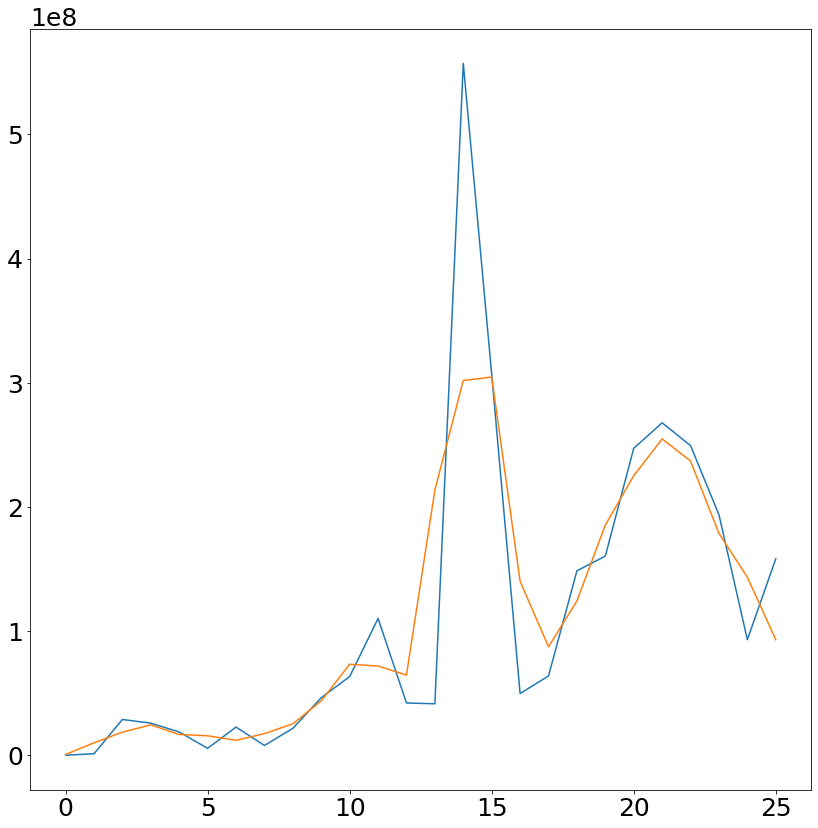

In [29]:
pl.figure(figsize=(14, 14))

pl.plot(Gas_4338)
pl.plot(newMass_4338)

In [30]:
# watch out with this
FeH_4338, OFe_4338 = np.zeros(sSFR_4338.size), np.zeros(sSFR_4338.size)
FeH_4339, OFe_4339 = np.zeros(sSFR_4339.size), np.zeros(sSFR_4339.size)
FeH_4341, OFe_4341 = np.zeros(sSFR_4341.size), np.zeros(sSFR_4341.size)
FeH_4343, OFe_4343 = np.zeros(sSFR_4343.size), np.zeros(sSFR_4343.size)

FeH_4470, OFe_4470 = np.zeros(sSFR_4470.size), np.zeros(sSFR_4470.size)
FeH_4471, OFe_4471 = np.zeros(sSFR_4471.size), np.zeros(sSFR_4471.size)
FeH_4473, OFe_4473 = np.zeros(sSFR_4473.size), np.zeros(sSFR_4473.size)
FeH_4474, OFe_4474 = np.zeros(sSFR_4474.size), np.zeros(sSFR_4474.size)

In [31]:
# ok, apparently works, so lets do the graphs
n = 3

newsSFR_4338, newRP_4338, newRPPi_4338, newFeH_4338, newOFe_4338, newMass_4338 = smoother(sSFR_4338, RPS_4338, RestForce_4338, FeH_4338, OFe_4338, Gas_4338, n)
newsSFR_4339, newRP_4339, newRPPi_4339, newFeH_4339, newOFe_4339, newMass_4339 = smoother(sSFR_4339, RPS_4339, RestForce_4339, FeH_4339, OFe_4339, Gas_4339, n)
newsSFR_4341, newRP_4341, newRPPi_4341, newFeH_4341, newOFe_4341, newMass_4341 = smoother(sSFR_4341, RPS_4341, RestForce_4341, FeH_4341, OFe_4341, Gas_4341, n)
newsSFR_4343, newRP_4343, newRPPi_4343, newFeH_4343, newOFe_4343, newMass_4343 = smoother(sSFR_4343, RPS_4343, RestForce_4343, FeH_4343, OFe_4343, Gas_4343, n)

newsSFR_4470, newRP_4470, newRPPi_4470, newFeH_4470, newOFe_4470, newMass_4470 = smoother(sSFR_4470, RPS_4470, RestForce_4470, FeH_4470, OFe_4470, Gas_4470, n)
newsSFR_4471, newRP_4471, newRPPi_4471, newFeH_4471, newOFe_4471, newMass_4471 = smoother(sSFR_4471, RPS_4471, RestForce_4471, FeH_4471, OFe_4471, Gas_4471, n)
newsSFR_4473, newRP_4473, newRPPi_4473, newFeH_4473, newOFe_4473, newMass_4473 = smoother(sSFR_4473, RPS_4473, RestForce_4473, FeH_4473, OFe_4473, Gas_4473, n)
newsSFR_4474, newRP_4474, newRPPi_4474, newFeH_4474, newOFe_4474, newMass_4474 = smoother(sSFR_4474, RPS_4474, RestForce_4474, FeH_4474, OFe_4474, Gas_4474, n)

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:36: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

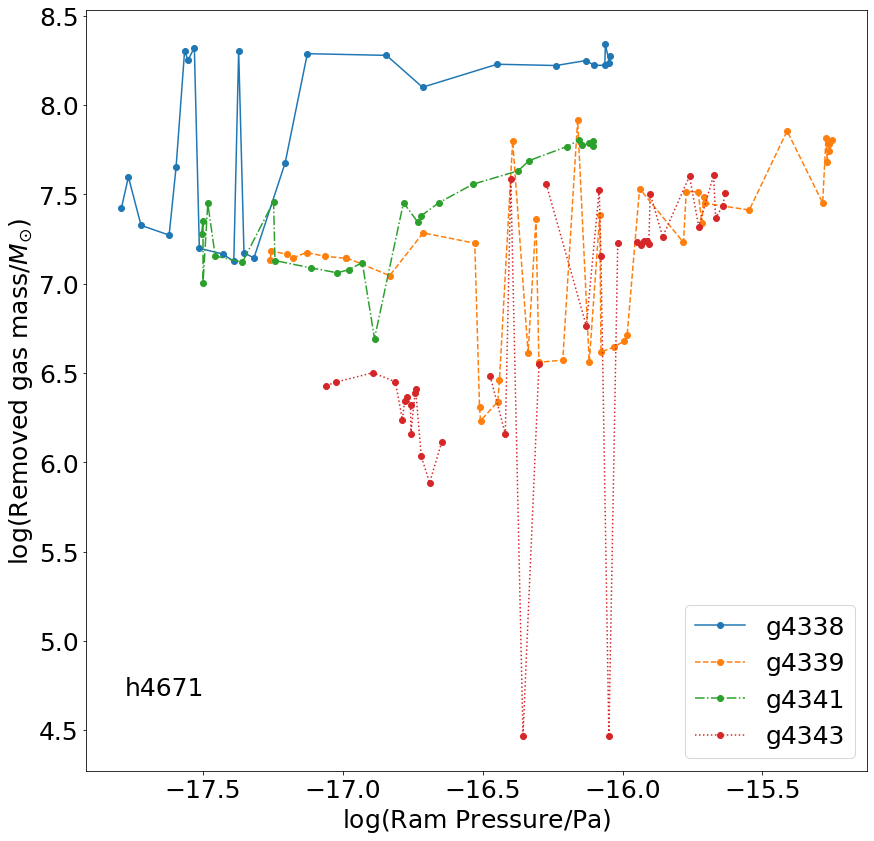

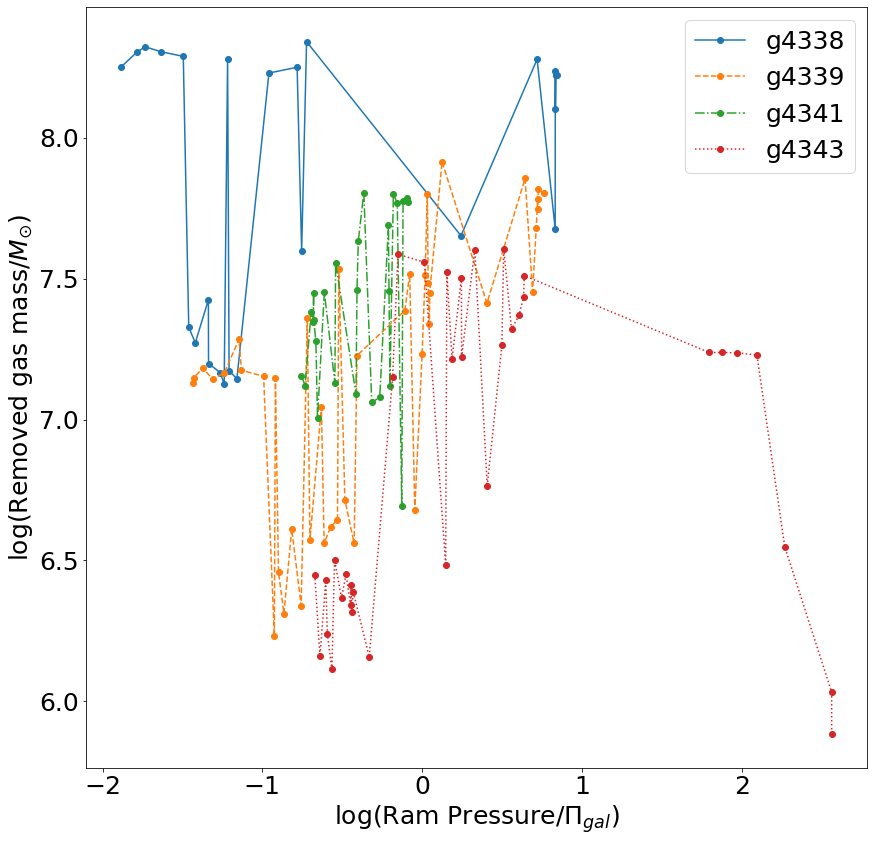

In [32]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(newRP_4338)
ii_4339 = np.argsort(newRP_4339)
ii_4341 = np.argsort(newRP_4341)
ii_4343 = np.argsort(newRP_4343)

pl.plot(np.log10(newRP_4338[ii_4338]), np.log10(newMass_4338[ii_4338]), label='g4338', marker='o',ls='-')
pl.plot(np.log10(newRP_4339[ii_4339]), np.log10(newMass_4339[ii_4339]), label='g4339', marker='o',ls='--')
pl.plot(np.log10(newRP_4341[ii_4341]), np.log10(newMass_4341[ii_4341]), label='g4341', marker='o',ls='-.')
pl.plot(np.log10(newRP_4343[ii_4343]), np.log10(newMass_4343[ii_4343]), label='g4343', marker='o',ls=':')

pl.legend(loc=4)

pl.xlabel('$\log($Ram Pressure/Pa$)$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

xlim = pl.xlim()
ylim = pl.ylim()

xdelta = xlim[1]-xlim[0]
ydelta = ylim[1]-ylim[0]

pl.text(xlim[0]+xdelta/20, ylim[0]+ydelta/10, 'h4671')

pl.figure(figsize=(14,14))

ii_4338 = np.argsort(newRPPi_4338)
ii_4339 = np.argsort(newRPPi_4339)
ii_4341 = np.argsort(newRPPi_4341)
ii_4343 = np.argsort(newRPPi_4343)

pl.plot(np.log10(newRPPi_4338[ii_4338]), np.log10(newMass_4338[ii_4338]), label='g4338', marker='o',ls='-')
pl.plot(np.log10(newRPPi_4339[ii_4339]), np.log10(newMass_4339[ii_4339]), label='g4339', marker='o',ls='--')
pl.plot(np.log10(newRPPi_4341[ii_4341]), np.log10(newMass_4341[ii_4341]), label='g4341', marker='o',ls='-.')
pl.plot(np.log10(newRPPi_4343[ii_4343]), np.log10(newMass_4343[ii_4343]), label='g4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

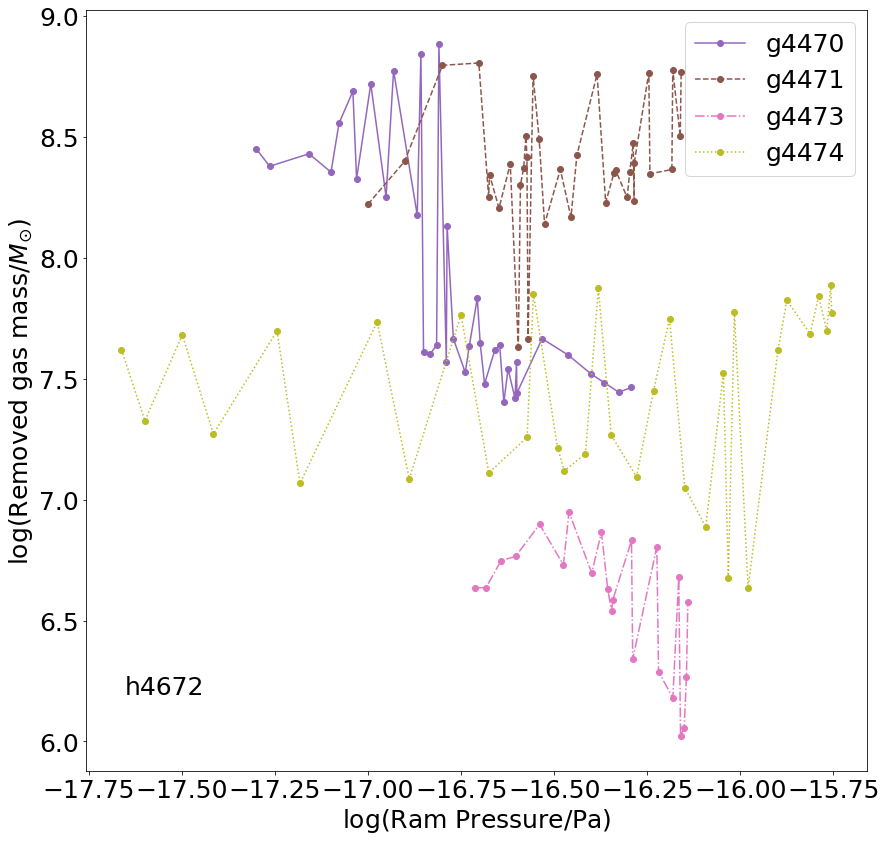

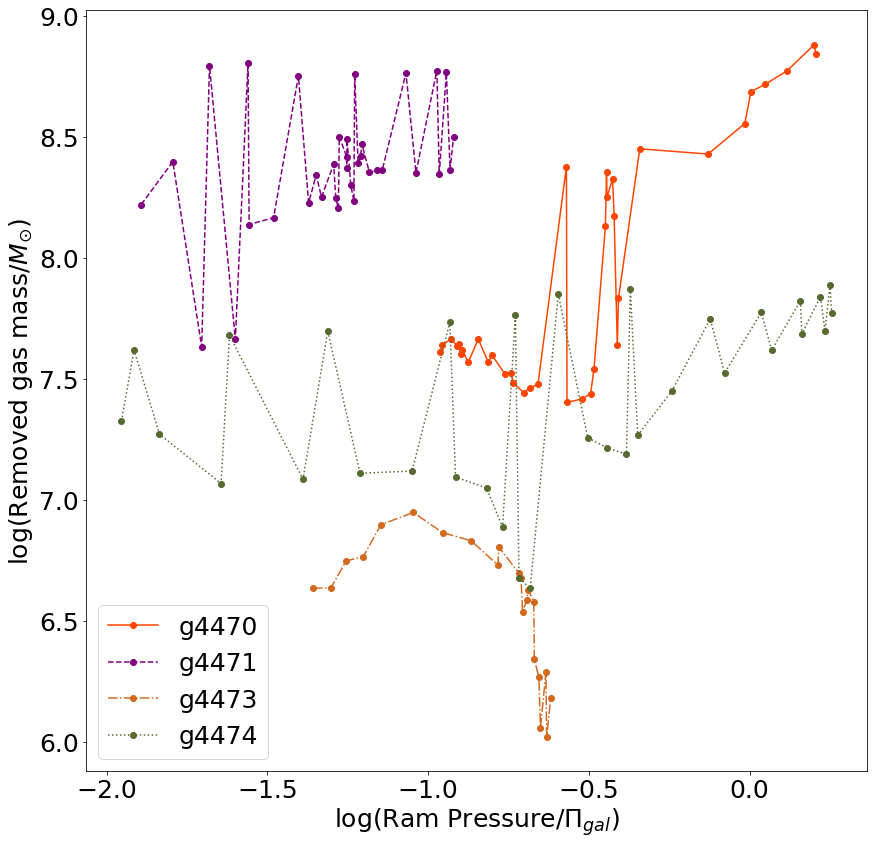

In [33]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(newRP_4470)
ii_4471 = np.argsort(newRP_4471)
ii_4473 = np.argsort(newRP_4473)
ii_4474 = np.argsort(newRP_4474)

pl.plot(np.log10(newRP_4470[ii_4470]), np.log10(newMass_4470[ii_4470]), label='g4470', marker='o',ls='-', color='tab:purple')
pl.plot(np.log10(newRP_4471[ii_4471]), np.log10(newMass_4471[ii_4471]), label='g4471', marker='o',ls='--', color='tab:brown')
pl.plot(np.log10(newRP_4473[ii_4473]), np.log10(newMass_4473[ii_4473]), label='g4473', marker='o',ls='-.', color='tab:pink')
pl.plot(np.log10(newRP_4474[ii_4474]), np.log10(newMass_4474[ii_4474]), label='g4474', marker='o',ls=':', color='tab:olive')

pl.legend(loc=1)

pl.xlabel('$\log($Ram Pressure/Pa$)$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

xlim = pl.xlim()
ylim = pl.ylim()

xdelta = xlim[1]-xlim[0]
ydelta = ylim[1]-ylim[0]

pl.text(xlim[0]+xdelta/20, ylim[0]+ydelta/10, 'h4672')

pl.figure(figsize=(14,14))

ii_4470 = np.argsort(newRPPi_4470)
ii_4471 = np.argsort(newRPPi_4471)
ii_4473 = np.argsort(newRPPi_4473)
ii_4474 = np.argsort(newRPPi_4474)

pl.plot(np.log10(newRPPi_4470[ii_4470]), np.log10(newMass_4470[ii_4470]), label='g4470', marker='o',ls='-', color='orangered')
pl.plot(np.log10(newRPPi_4471[ii_4471]), np.log10(newMass_4471[ii_4471]), label='g4471', marker='o',ls='--', color='purple')
pl.plot(np.log10(newRPPi_4473[ii_4473]), np.log10(newMass_4473[ii_4473]), label='g4473', marker='o',ls='-.', color='chocolate')
pl.plot(np.log10(newRPPi_4474[ii_4474]), np.log10(newMass_4474[ii_4474]), label='g4474', marker='o',ls=':', color='darkolivegreen')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()


Text(-11.367215586775375, 6.247178865337004, 'h4671')

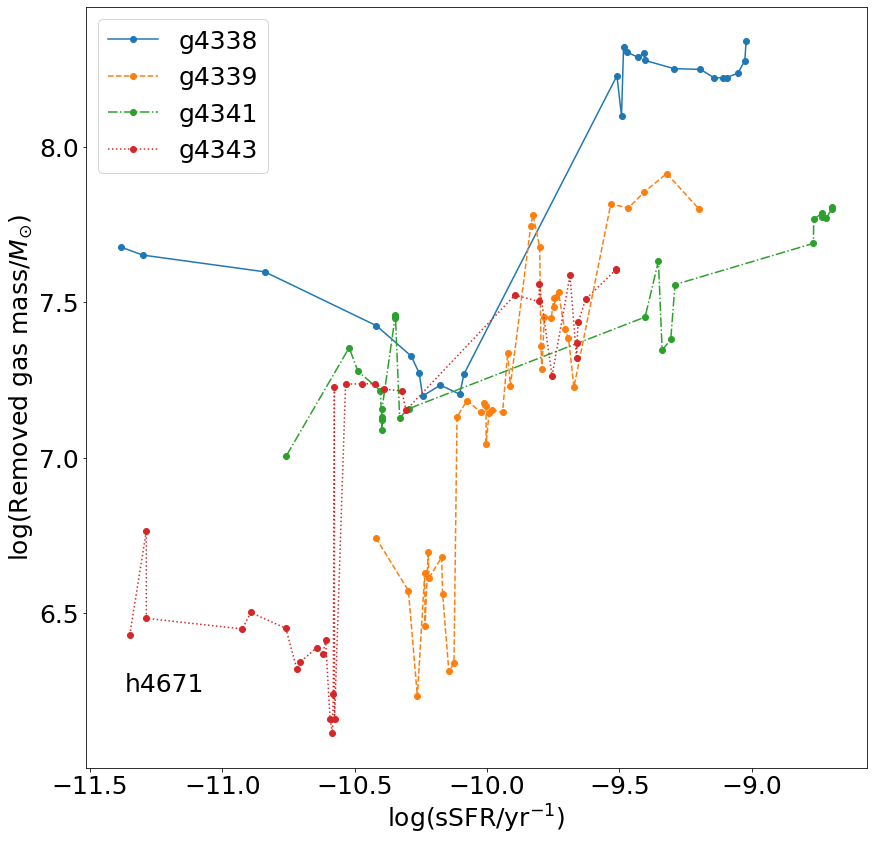

In [35]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(newsSFR_4338)
ii_4339 = np.argsort(newsSFR_4339)
ii_4341 = np.argsort(newsSFR_4341)
ii_4343 = np.argsort(newsSFR_4343)

pl.plot(np.log10(newsSFR_4338[ii_4338]), np.log10(newMass_4338[ii_4338]), label='g4338', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4339[ii_4339]), np.log10(newMass_4339[ii_4339]), label='g4339', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4341[ii_4341]), np.log10(newMass_4341[ii_4341]), label='g4341', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4343[ii_4343]), np.log10(newMass_4343[ii_4343]), label='g4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR/yr$^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

xlim = pl.xlim()
ylim = pl.ylim()

xdelta = xlim[1]-xlim[0]
ydelta = ylim[1]-ylim[0]

pl.text(xlim[0]+xdelta/20, ylim[0]+ydelta/10, 'h4671')

Text(-11.413028264687766, 6.1935277276491725, 'h4672')

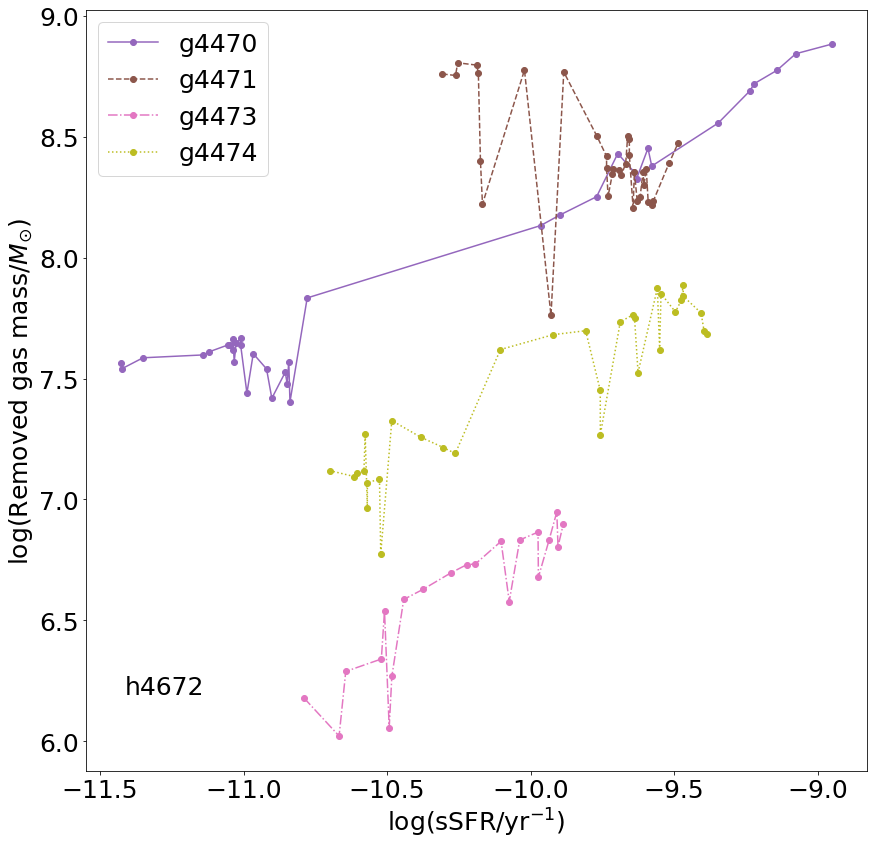

In [40]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(newsSFR_4470)
ii_4471 = np.argsort(newsSFR_4471)
ii_4473 = np.argsort(newsSFR_4473)
ii_4474 = np.argsort(newsSFR_4474)

pl.plot(np.log10(newsSFR_4470[ii_4470]), np.log10(newMass_4470[ii_4470]), label='g4470', marker='o',ls='-', color='tab:purple')
pl.plot(np.log10(newsSFR_4471[ii_4471]), np.log10(newMass_4471[ii_4471]), label='g4471', marker='o',ls='--', color='tab:brown')
pl.plot(np.log10(newsSFR_4473[ii_4473]), np.log10(newMass_4473[ii_4473]), label='g4473', marker='o',ls='-.', color='tab:pink')
pl.plot(np.log10(newsSFR_4474[ii_4474]), np.log10(newMass_4474[ii_4474]), label='g4474', marker='o',ls=':', color='tab:olive')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR/yr$^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

xlim = pl.xlim()
ylim = pl.ylim()

xdelta = xlim[1]-xlim[0]
ydelta = ylim[1]-ylim[0]

pl.text(xlim[0]+xdelta/20, ylim[0]+ydelta/10, 'h4672')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '[O/Fe]')

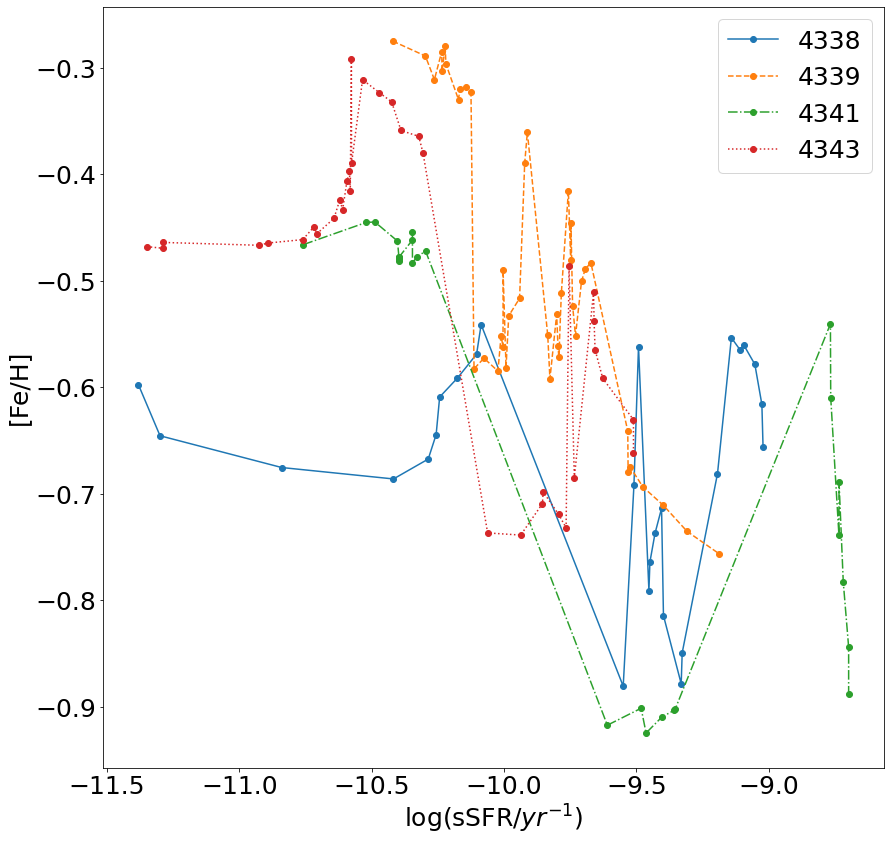

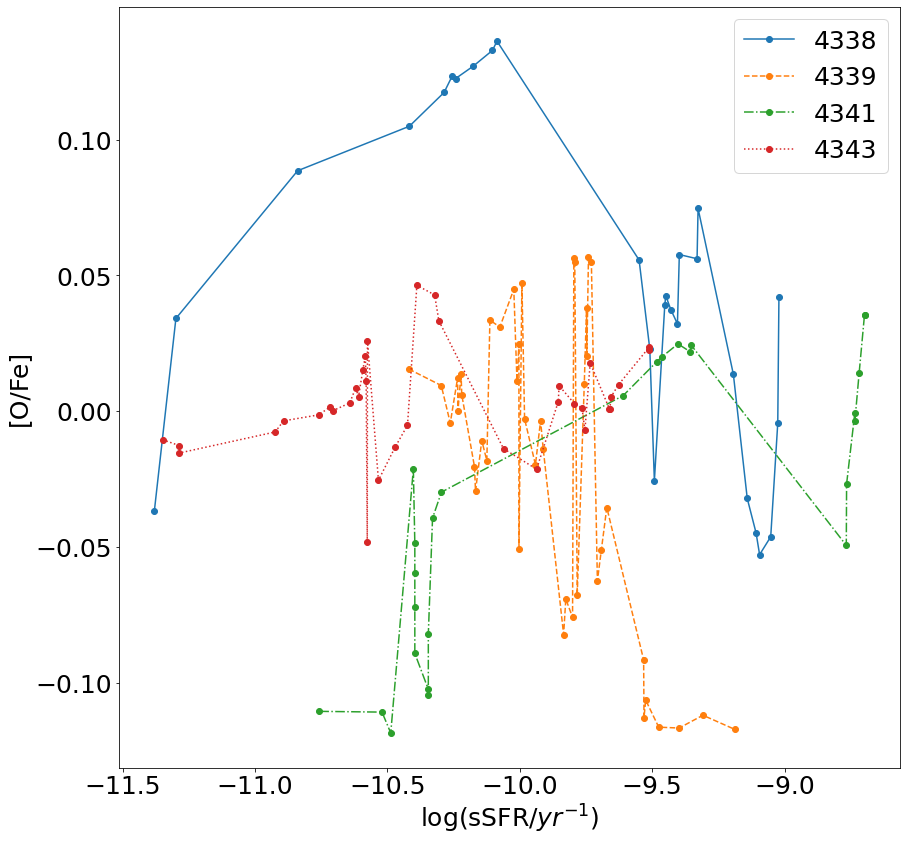

In [90]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(newsSFR_4338)
ii_4339 = np.argsort(newsSFR_4339)
ii_4341 = np.argsort(newsSFR_4341)
ii_4343 = np.argsort(newsSFR_4343)

pl.plot(np.log10(newsSFR_4338[ii_4338]), newFeH_4338[ii_4338], label='4338', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4339[ii_4339]), newFeH_4339[ii_4339], label='4339', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4341[ii_4341]), newFeH_4341[ii_4341], label='4341', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4343[ii_4343]), newFeH_4343[ii_4343], label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(newsSFR_4338[ii_4338]), newOFe_4338[ii_4338], label='4338', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4339[ii_4339]), newOFe_4339[ii_4339], label='4339', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4341[ii_4341]), newOFe_4341[ii_4341], label='4341', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4343[ii_4343]), newOFe_4343[ii_4343], label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

Text(0, 0.5, '[O/Fe]')

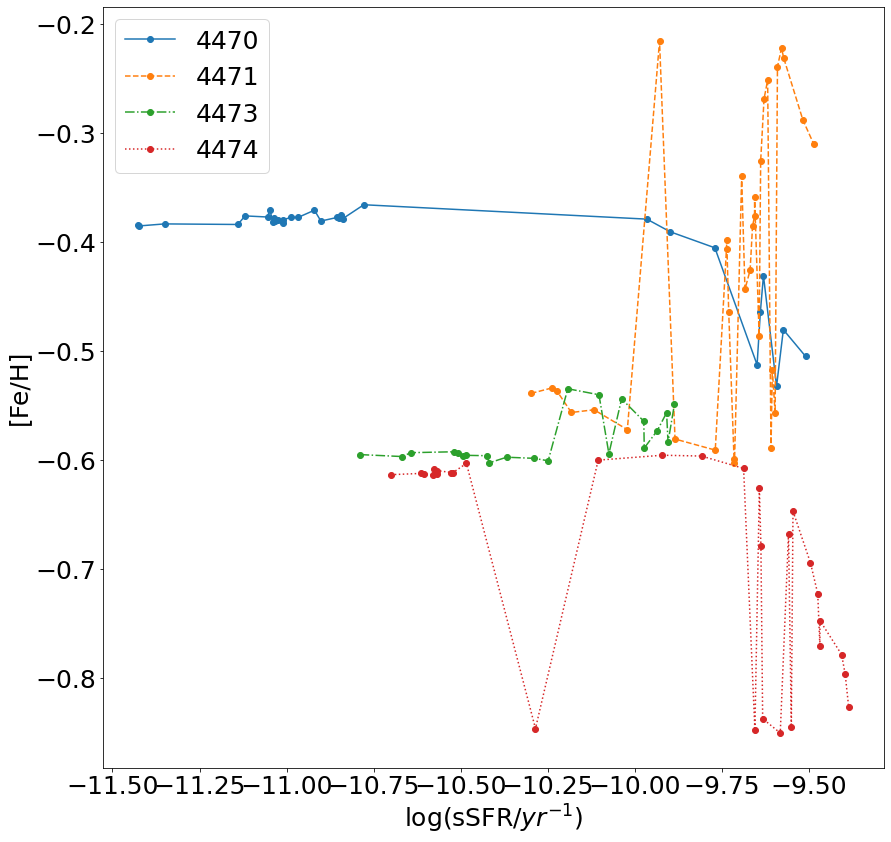

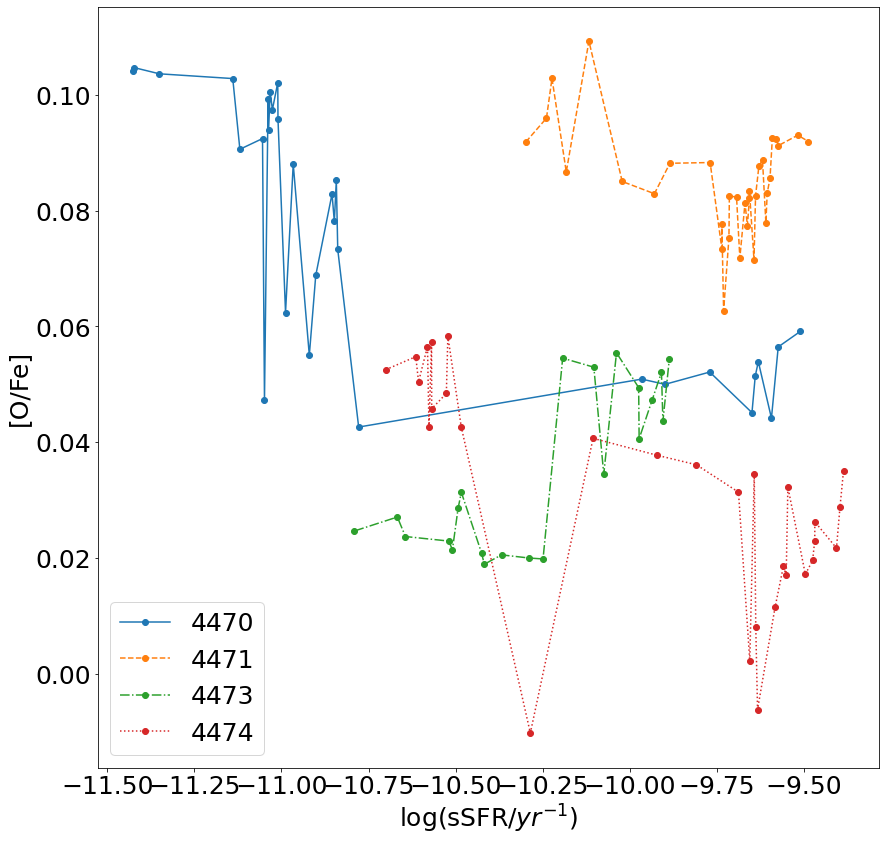

In [91]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(newsSFR_4470)
ii_4471 = np.argsort(newsSFR_4471)
ii_4473 = np.argsort(newsSFR_4473)
ii_4474 = np.argsort(newsSFR_4474)

pl.plot(np.log10(newsSFR_4470[ii_4470]), newFeH_4470[ii_4470], label='4470', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4471[ii_4471]), newFeH_4471[ii_4471], label='4471', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4473[ii_4473]), newFeH_4473[ii_4473], label='4473', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4474[ii_4474]), newFeH_4474[ii_4474], label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(newsSFR_4470[ii_4470]), newOFe_4470[ii_4470], label='4470', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4471[ii_4471]), newOFe_4471[ii_4471], label='4471', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4473[ii_4473]), newOFe_4473[ii_4473], label='4473', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4474[ii_4474]), newOFe_4474[ii_4474], label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

In [92]:
def smotOne(data, n):
    I = np.arange(data.size)
    
    newData = np.zeros(I.size)
    
    for i in I:
        itemp = np.arange(i-n, i+n+1)
        itemp = itemp[np.where((itemp>=0) & (itemp<I[-1]))]
        tData = data[itemp]
        
        tData = tData[np.where((np.isnan(tData)==False) & (np.isinf(tData)==False))]
        newData[i] = np.mean(tData)
        
    return newData

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in true_divide
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

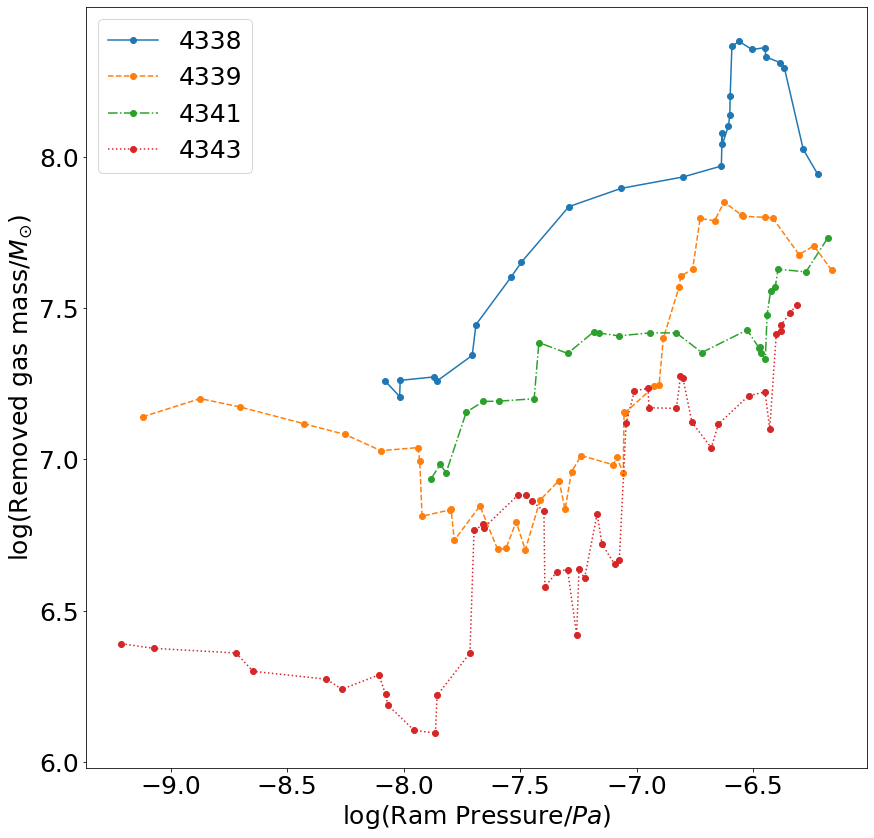

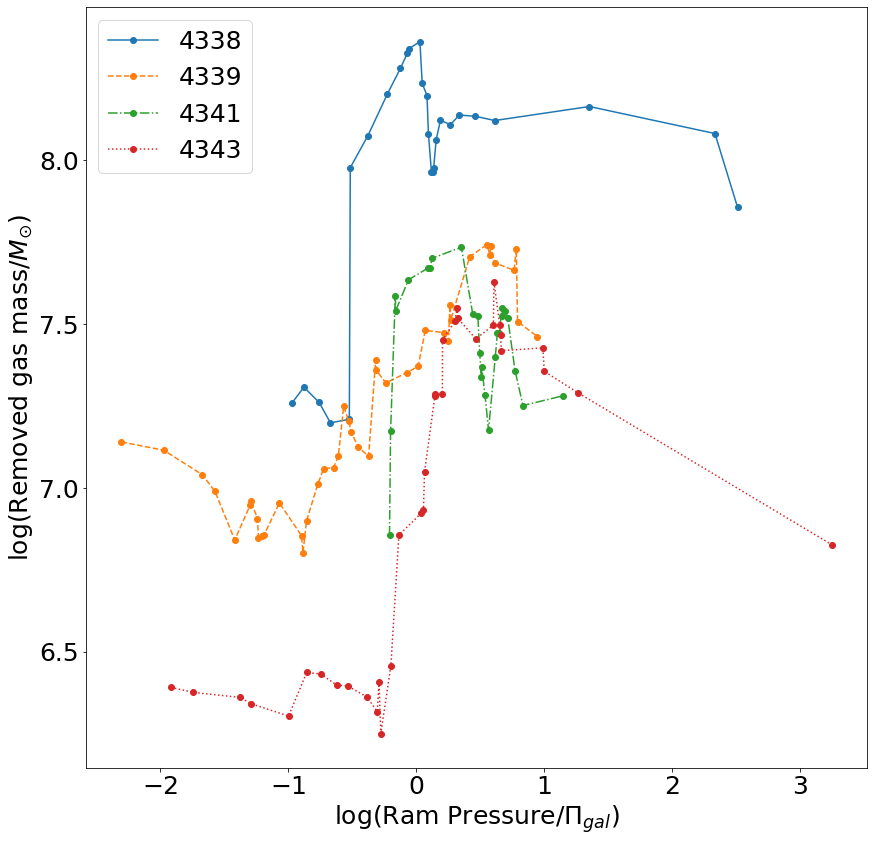

In [93]:
# ok, lets test this in the wild.
n = 3

pl.figure(figsize=(14,14))

ii_4338 = np.argsort(RPS_4338)
ii_4339 = np.argsort(RPS_4339)
ii_4341 = np.argsort(RPS_4341)
ii_4343 = np.argsort(RPS_4343)

newGas_S_4338 = smotOne(Gas_4338[ii_4338], n)
newGas_S_4339 = smotOne(Gas_4339[ii_4339], n)
newGas_S_4341 = smotOne(Gas_4341[ii_4341], n)
newGas_S_4343 = smotOne(Gas_4343[ii_4343], n)

pl.plot(np.log10(RPS_4338[ii_4338]), np.log10(newGas_S_4338), label='4338', marker='o',ls='-')
pl.plot(np.log10(RPS_4339[ii_4339]), np.log10(newGas_S_4339), label='4339', marker='o',ls='--')
pl.plot(np.log10(RPS_4341[ii_4341]), np.log10(newGas_S_4341), label='4341', marker='o',ls='-.')
pl.plot(np.log10(RPS_4343[ii_4343]), np.log10(newGas_S_4343), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/Pa)$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

pl.figure(figsize=(14,14))

ii_4338 = np.argsort(RPS_4338/RestForce_4338)
ii_4339 = np.argsort(RPS_4339/RestForce_4339)
ii_4341 = np.argsort(RPS_4341/RestForce_4341)
ii_4343 = np.argsort(RPS_4343/RestForce_4343)

newGas_S_4338 = smotOne(Gas_4338[ii_4338], n)
newGas_S_4339 = smotOne(Gas_4339[ii_4339], n)
newGas_S_4341 = smotOne(Gas_4341[ii_4341], n)
newGas_S_4343 = smotOne(Gas_4343[ii_4343], n)

pl.plot(np.log10(RPS_4338[ii_4338]/RestForce_4338[ii_4338]), np.log10(newGas_S_4338), label='4338', marker='o',ls='-')
pl.plot(np.log10(RPS_4339[ii_4339]/RestForce_4339[ii_4339]), np.log10(newGas_S_4339), label='4339', marker='o',ls='--')
pl.plot(np.log10(RPS_4341[ii_4341]/RestForce_4341[ii_4341]), np.log10(newGas_S_4341), label='4341', marker='o',ls='-.')
pl.plot(np.log10(RPS_4343[ii_4343]/RestForce_4343[ii_4343]), np.log10(newGas_S_4343), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

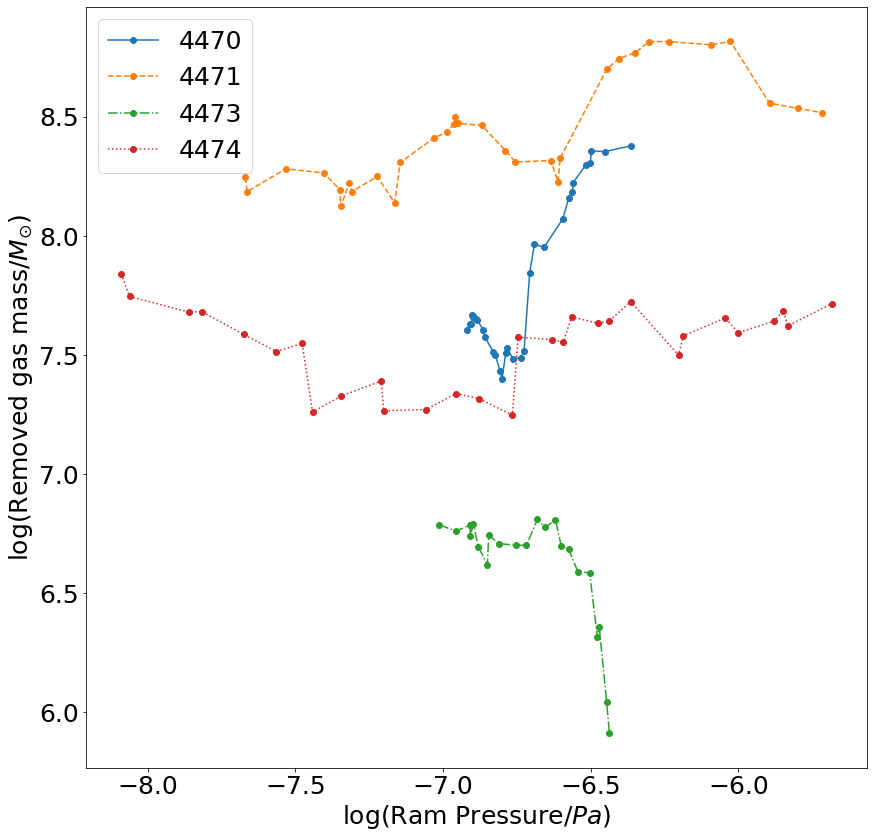

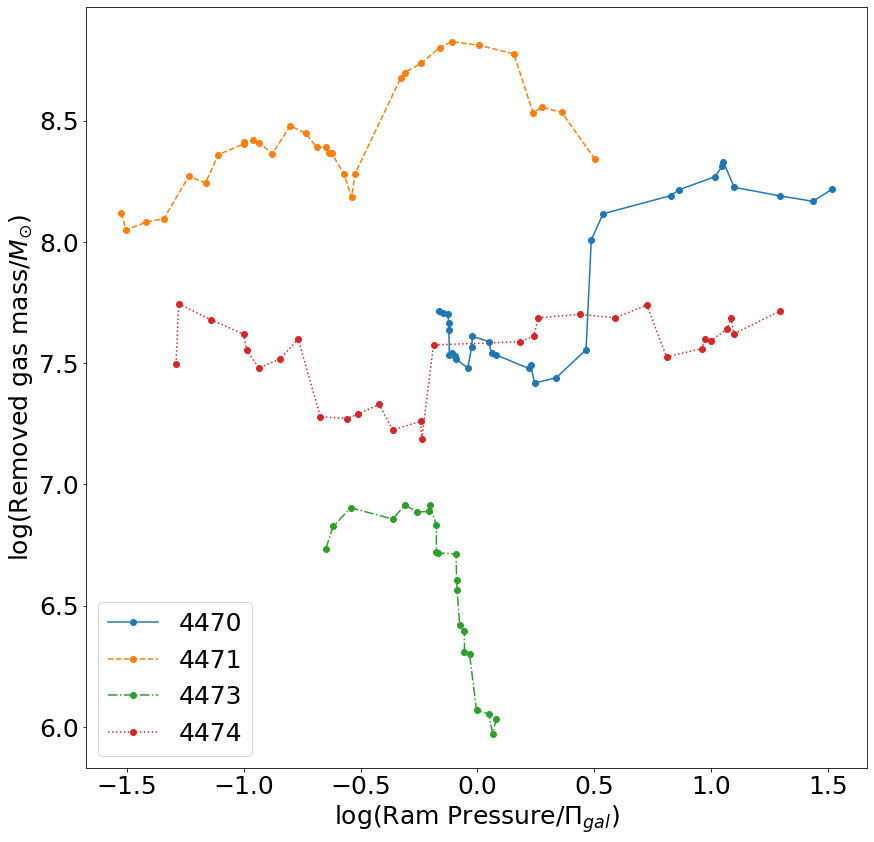

In [94]:


pl.figure(figsize=(14,14))

ii_4470 = np.argsort(RPS_4470)
ii_4471 = np.argsort(RPS_4471)
ii_4473 = np.argsort(RPS_4473)
ii_4474 = np.argsort(RPS_4474)

newGas_S_4470 = smotOne(Gas_4470[ii_4470], n)
newGas_S_4471 = smotOne(Gas_4471[ii_4471], n)
newGas_S_4473 = smotOne(Gas_4473[ii_4473], n)
newGas_S_4474 = smotOne(Gas_4474[ii_4474], n)

pl.plot(np.log10(RPS_4470[ii_4470]), np.log10(newGas_S_4470), label='4470', marker='o',ls='-')
pl.plot(np.log10(RPS_4471[ii_4471]), np.log10(newGas_S_4471), label='4471', marker='o',ls='--')
pl.plot(np.log10(RPS_4473[ii_4473]), np.log10(newGas_S_4473), label='4473', marker='o',ls='-.')
pl.plot(np.log10(RPS_4474[ii_4474]), np.log10(newGas_S_4474), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/Pa)$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

pl.figure(figsize=(14,14))

ii_4470 = np.argsort(RPS_4470/RestForce_4470)
ii_4471 = np.argsort(RPS_4471/RestForce_4471)
ii_4473 = np.argsort(RPS_4473/RestForce_4473)
ii_4474 = np.argsort(RPS_4474/RestForce_4474)

newGas_S_4470 = smotOne(Gas_4470[ii_4470], n)
newGas_S_4471 = smotOne(Gas_4471[ii_4471], n)
newGas_S_4473 = smotOne(Gas_4473[ii_4473], n)
newGas_S_4474 = smotOne(Gas_4474[ii_4474], n)

pl.plot(np.log10(RPS_4470[ii_4470]/RestForce_4470[ii_4470]), np.log10(newGas_S_4470), label='4470', marker='o',ls='-')
pl.plot(np.log10(RPS_4471[ii_4471]/RestForce_4471[ii_4471]), np.log10(newGas_S_4471), label='4471', marker='o',ls='--')
pl.plot(np.log10(RPS_4473[ii_4473]/RestForce_4473[ii_4473]), np.log10(newGas_S_4473), label='4473', marker='o',ls='-.')
pl.plot(np.log10(RPS_4474[ii_4474]/RestForce_4474[ii_4474]), np.log10(newGas_S_4474), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($Ram Pressure$/\Pi_{gal})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log10
  
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

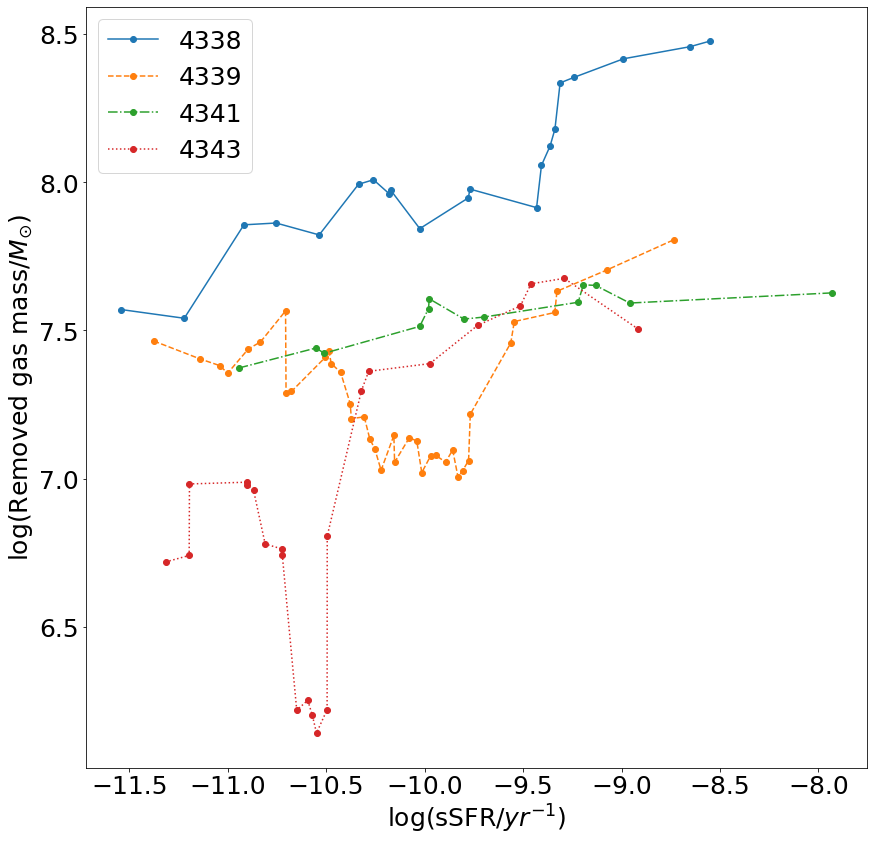

In [95]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(sSFR_4338)
ii_4339 = np.argsort(sSFR_4339)
ii_4341 = np.argsort(sSFR_4341)
ii_4343 = np.argsort(sSFR_4343)

newGas_S_4338 = smotOne(Gas_4338[ii_4338], n)
newGas_S_4339 = smotOne(Gas_4339[ii_4339], n)
newGas_S_4341 = smotOne(Gas_4341[ii_4341], n)
newGas_S_4343 = smotOne(Gas_4343[ii_4343], n)

pl.plot(np.log10(sSFR_4338[ii_4338]), np.log10(newGas_S_4338), label='4338', marker='o',ls='-')
pl.plot(np.log10(sSFR_4339[ii_4339]), np.log10(newGas_S_4339), label='4339', marker='o',ls='--')
pl.plot(np.log10(sSFR_4341[ii_4341]), np.log10(newGas_S_4341), label='4341', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4343[ii_4343]), np.log10(newGas_S_4343), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

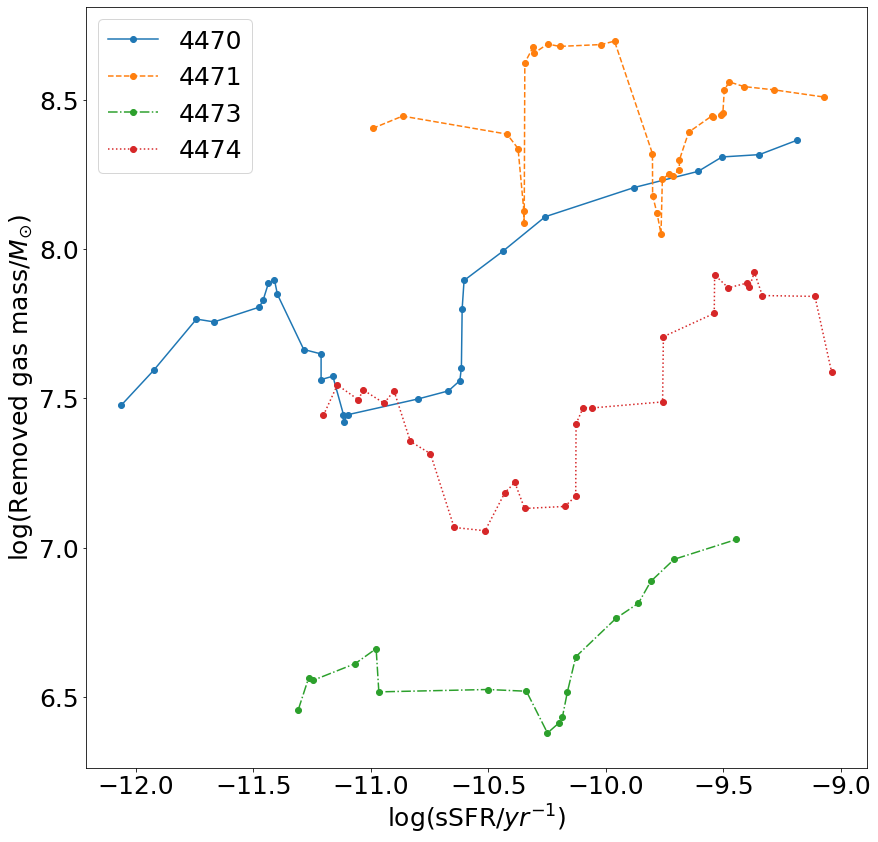

In [96]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(sSFR_4470)
ii_4471 = np.argsort(sSFR_4471)
ii_4473 = np.argsort(sSFR_4473)
ii_4474 = np.argsort(sSFR_4474)

newGas_S_4470 = smotOne(Gas_4470[ii_4470], n)
newGas_S_4471 = smotOne(Gas_4471[ii_4471], n)
newGas_S_4473 = smotOne(Gas_4473[ii_4473], n)
newGas_S_4474 = smotOne(Gas_4474[ii_4474], n)

pl.plot(np.log10(sSFR_4470[ii_4470]), np.log10(newGas_S_4470), label='4470', marker='o',ls='-')
pl.plot(np.log10(sSFR_4471[ii_4471]), np.log10(newGas_S_4471), label='4471', marker='o',ls='--')
pl.plot(np.log10(sSFR_4473[ii_4473]), np.log10(newGas_S_4473), label='4473', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4474[ii_4474]), np.log10(newGas_S_4474), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log10
  
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encounter

Text(0, 0.5, '[O/Fe]')

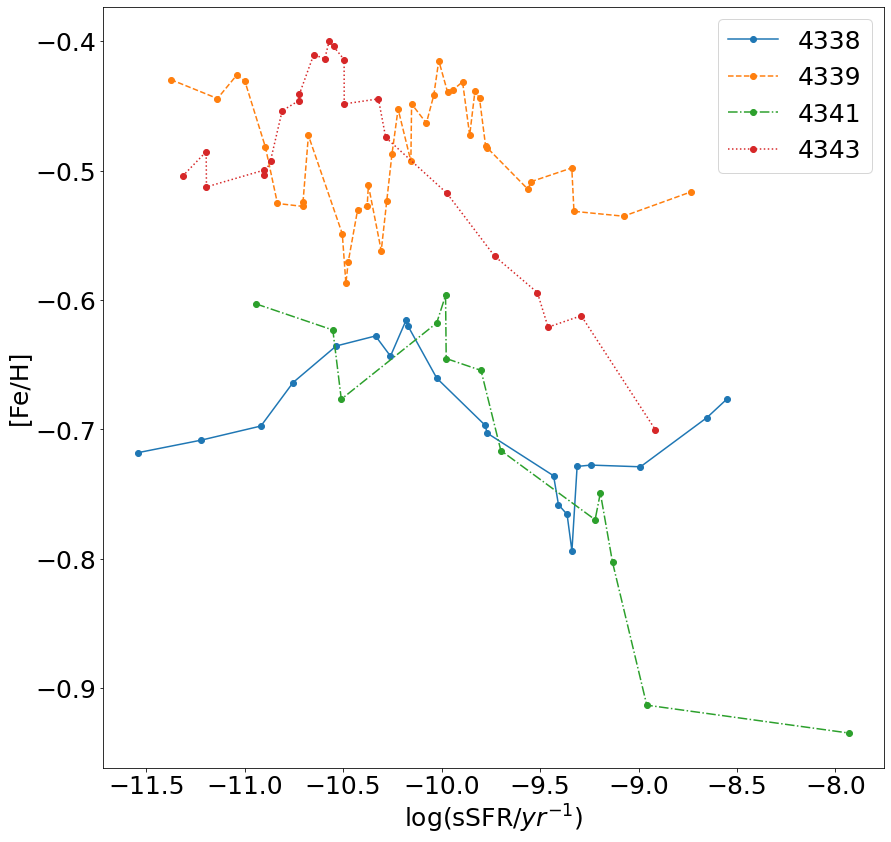

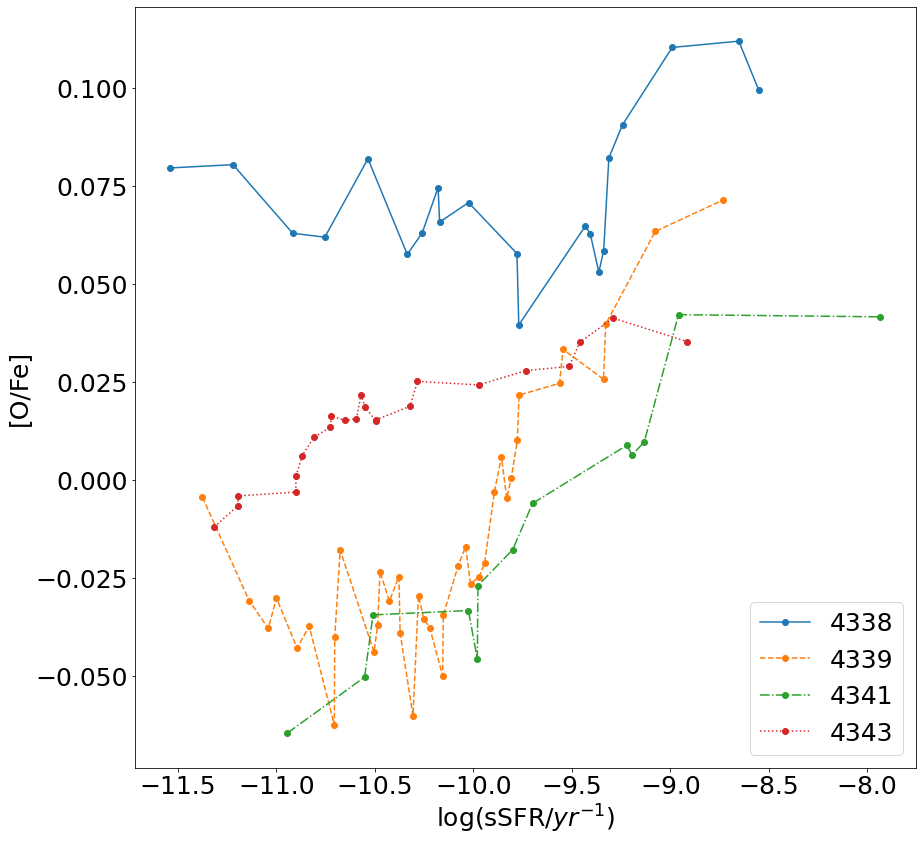

In [97]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(sSFR_4338)
ii_4339 = np.argsort(sSFR_4339)
ii_4341 = np.argsort(sSFR_4341)
ii_4343 = np.argsort(sSFR_4343)

newFeH_S_4338 = smotOne(FeH_4338[ii_4338], n)
newFeH_S_4339 = smotOne(FeH_4339[ii_4339], n)
newFeH_S_4341 = smotOne(FeH_4341[ii_4341], n)
newFeH_S_4343 = smotOne(FeH_4343[ii_4343], n)

pl.plot(np.log10(sSFR_4338[ii_4338]), newFeH_S_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(sSFR_4339[ii_4339]), newFeH_S_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(sSFR_4341[ii_4341]), newFeH_S_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4343[ii_4343]), newFeH_S_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))

# ii_4338 = np.argsort(sSFR_4338)
# ii_4339 = np.argsort(sSFR_4339)
# ii_4341 = np.argsort(sSFR_4341)
# ii_4343 = np.argsort(sSFR_4343)

newOFe_S_4338 = smotOne(OFe_4338[ii_4338], n)
newOFe_S_4339 = smotOne(OFe_4339[ii_4339], n)
newOFe_S_4341 = smotOne(OFe_4341[ii_4341], n)
newOFe_S_4343 = smotOne(OFe_4343[ii_4343], n)

pl.plot(np.log10(sSFR_4338[ii_4338]), newOFe_S_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(sSFR_4339[ii_4339]), newOFe_S_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(sSFR_4341[ii_4341]), newOFe_S_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4343[ii_4343]), newOFe_S_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:35: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '[O/Fe]')

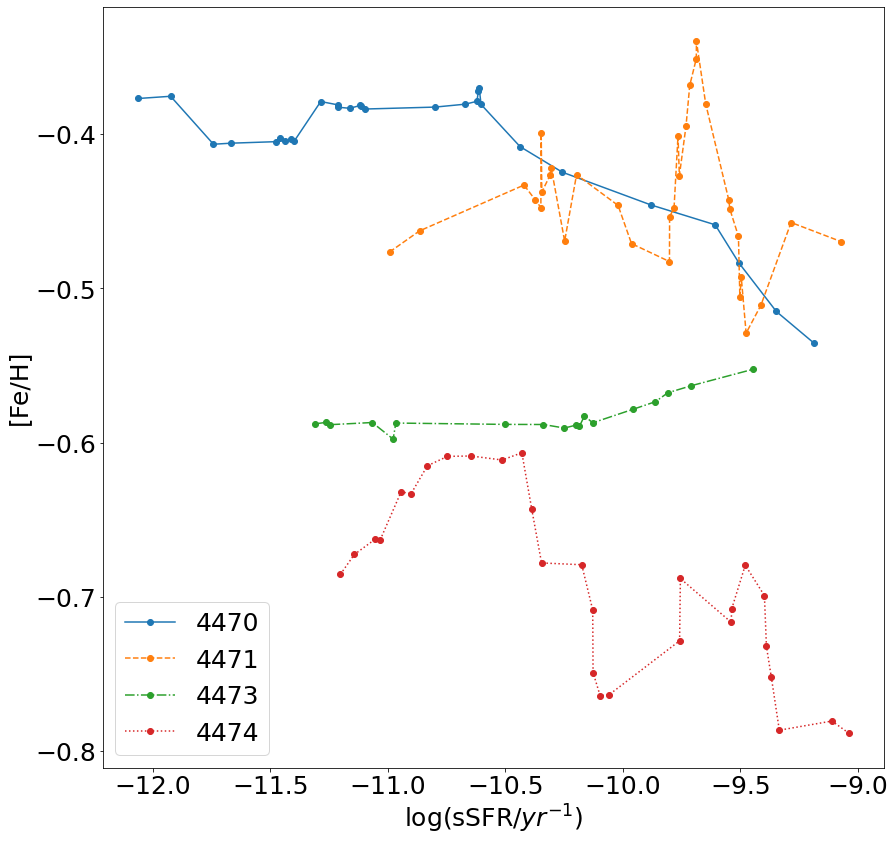

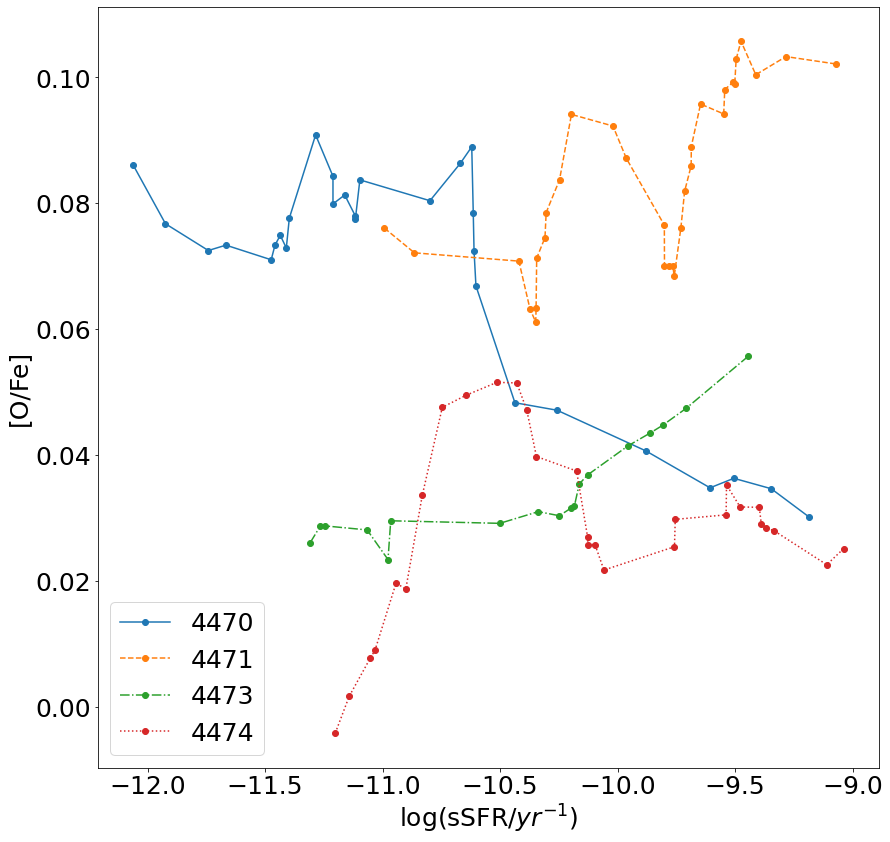

In [98]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(sSFR_4470)
ii_4471 = np.argsort(sSFR_4471)
ii_4473 = np.argsort(sSFR_4473)
ii_4474 = np.argsort(sSFR_4474)

newFeH_S_4470 = smotOne(FeH_4470[ii_4470], n)
newFeH_S_4471 = smotOne(FeH_4471[ii_4471], n)
newFeH_S_4473 = smotOne(FeH_4473[ii_4473], n)
newFeH_S_4474 = smotOne(FeH_4474[ii_4474], n)

pl.plot(np.log10(sSFR_4470[ii_4470]), newFeH_S_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(sSFR_4471[ii_4471]), newFeH_S_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(sSFR_4473[ii_4473]), newFeH_S_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4474[ii_4474]), newFeH_S_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))

# ii_4338 = np.argsort(sSFR_4338)
# ii_4339 = np.argsort(sSFR_4339)
# ii_4341 = np.argsort(sSFR_4341)
# ii_4343 = np.argsort(sSFR_4343)

newOFe_S_4470 = smotOne(OFe_4470[ii_4470], n)
newOFe_S_4471 = smotOne(OFe_4471[ii_4471], n)
newOFe_S_4473 = smotOne(OFe_4473[ii_4473], n)
newOFe_S_4474 = smotOne(OFe_4474[ii_4474], n)

pl.plot(np.log10(sSFR_4470[ii_4470]), newOFe_S_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(sSFR_4471[ii_4471]), newOFe_S_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(sSFR_4473[ii_4473]), newOFe_S_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(sSFR_4474[ii_4474]), newOFe_S_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:27: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWa

Text(0, 0.5, '[O/Fe]')

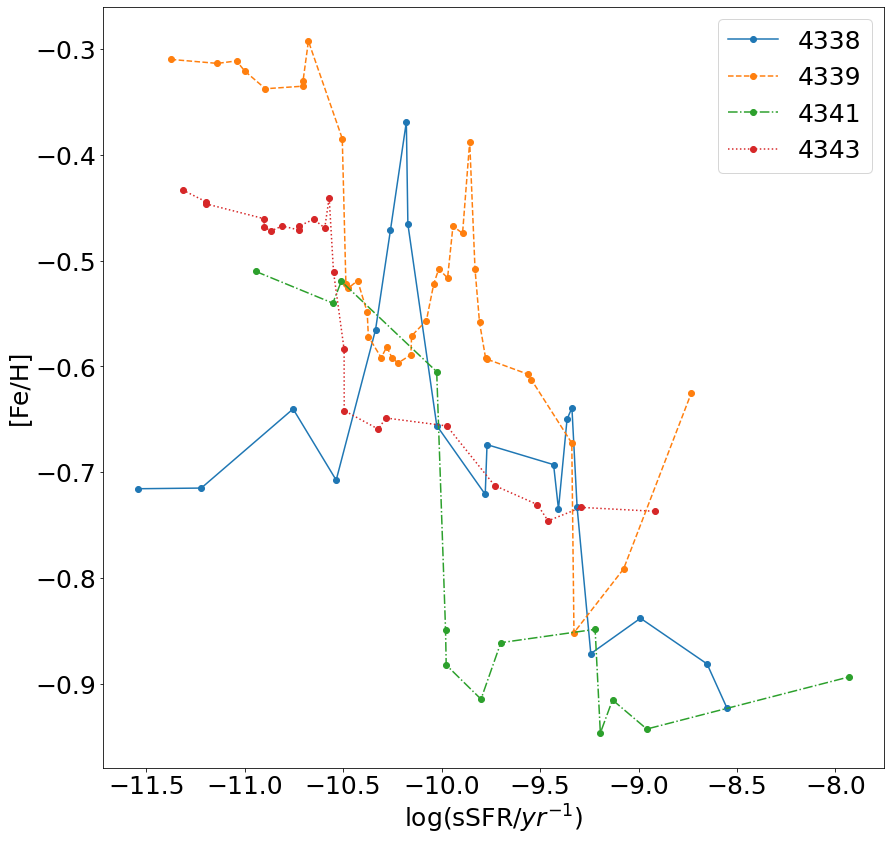

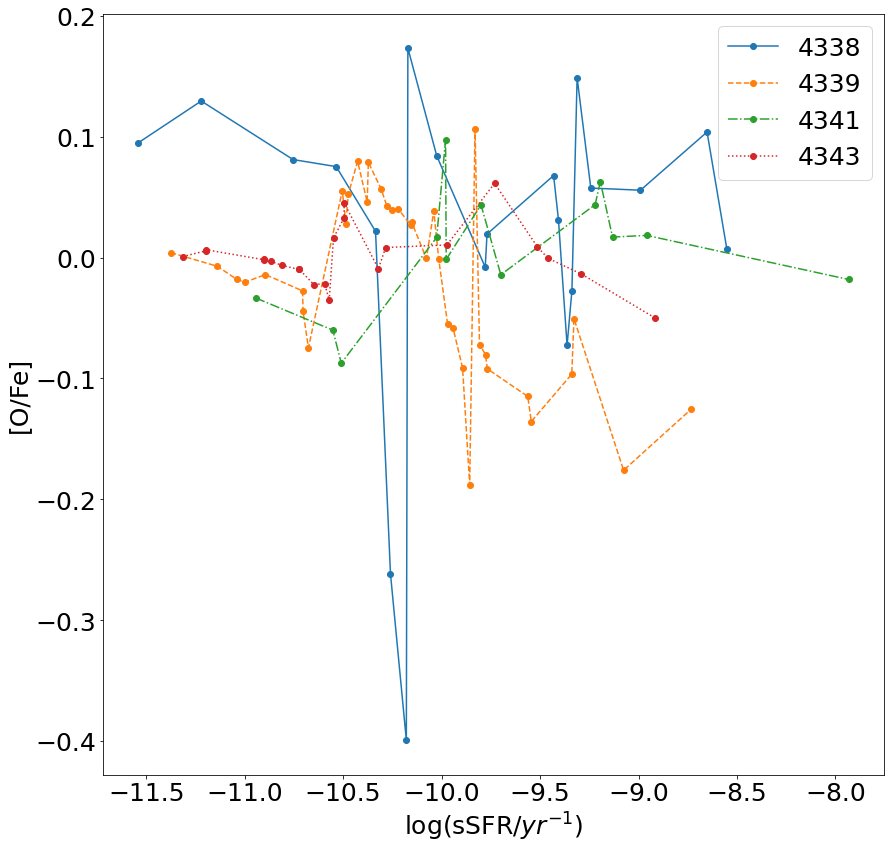

In [99]:
pl.figure(figsize=(14,14))

# now i have to asociate FeH with teh previous sSFR, given or take, without smoothing the thing, not just argsort
# how i do this. just like this

nFeH_4338 = FeH_4338[:-1]
nFeH_4339 = FeH_4339[:-1]
nFeH_4341 = FeH_4341[:-1]
nFeH_4343 = FeH_4343[:-1]

nOFe_4338 = OFe_4338[:-1]
nOFe_4339 = OFe_4339[:-1]
nOFe_4341 = OFe_4341[:-1]
nOFe_4343 = OFe_4343[:-1]


nsSFR_4338 = sSFR_4338[1:]
nsSFR_4339 = sSFR_4339[1:]
nsSFR_4341 = sSFR_4341[1:]
nsSFR_4343 = sSFR_4343[1:]

ii_4338 = np.argsort(nsSFR_4338)
ii_4339 = np.argsort(nsSFR_4339)
ii_4341 = np.argsort(nsSFR_4341)
ii_4343 = np.argsort(nsSFR_4343)

pl.plot(np.log10(nsSFR_4338[ii_4338]), nFeH_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(nsSFR_4339[ii_4339]), nFeH_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(nsSFR_4341[ii_4341]), nFeH_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(nsSFR_4343[ii_4343]), nFeH_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))


pl.plot(np.log10(nsSFR_4338[ii_4338]), nOFe_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(nsSFR_4339[ii_4339]), nOFe_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(nsSFR_4341[ii_4341]), nOFe_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(nsSFR_4343[ii_4343]), nOFe_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '[O/Fe]')

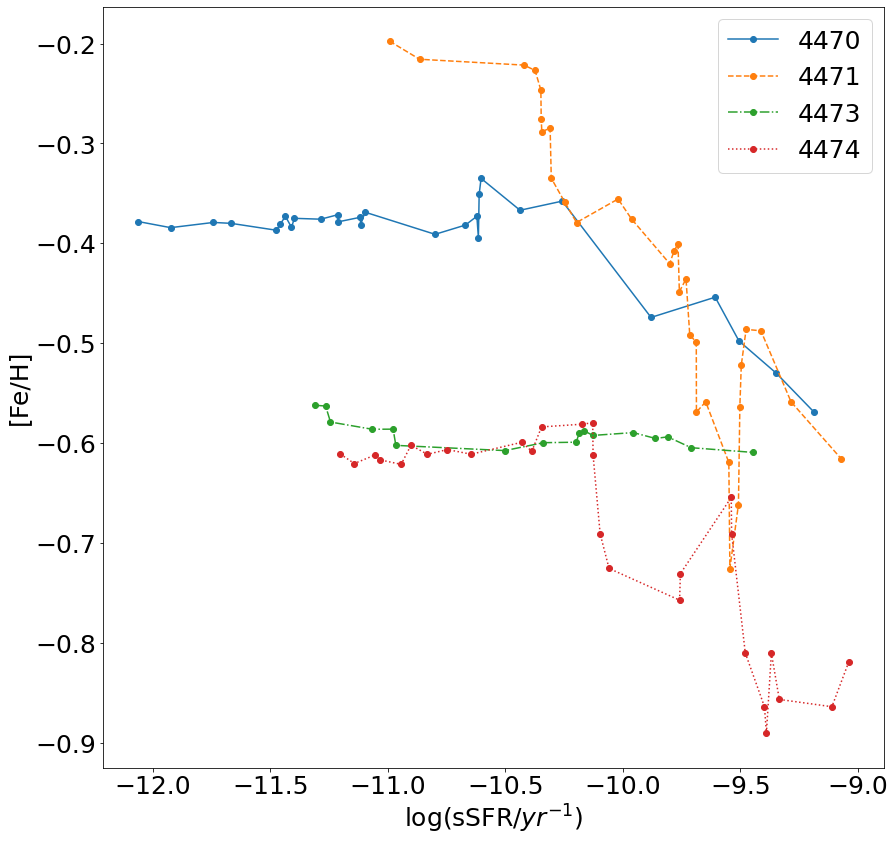

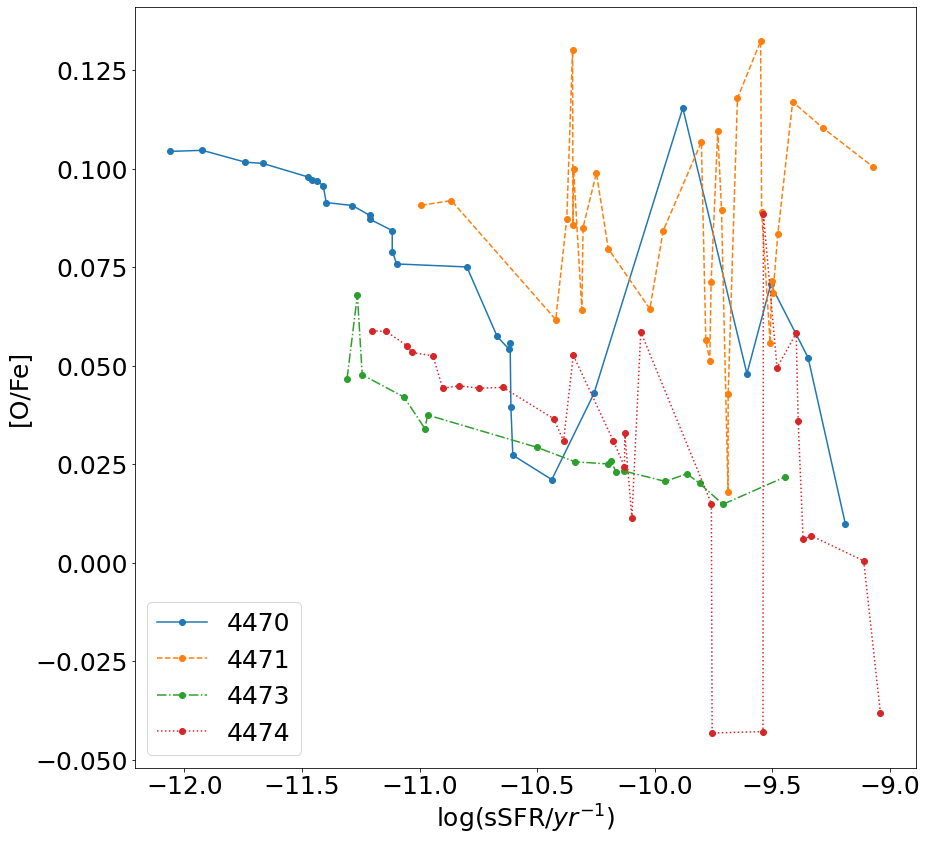

In [100]:
pl.figure(figsize=(14,14))

# now i have to asociate FeH with teh previous sSFR, given or take, without smoothing the thing, not just argsort
# how i do this. just like this

nFeH_4470 = FeH_4470[:-1]
nFeH_4471 = FeH_4471[:-1]
nFeH_4473 = FeH_4473[:-1]
nFeH_4474 = FeH_4474[:-1]

nOFe_4470 = OFe_4470[:-1]
nOFe_4471 = OFe_4471[:-1]
nOFe_4473 = OFe_4473[:-1]
nOFe_4474 = OFe_4474[:-1]

nsSFR_4470 = sSFR_4470[1:]
nsSFR_4471 = sSFR_4471[1:]
nsSFR_4473 = sSFR_4473[1:]
nsSFR_4474 = sSFR_4474[1:]

ii_4470 = np.argsort(nsSFR_4470)
ii_4471 = np.argsort(nsSFR_4471)
ii_4473 = np.argsort(nsSFR_4473)
ii_4474 = np.argsort(nsSFR_4474)

pl.plot(np.log10(nsSFR_4470[ii_4470]), nFeH_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(nsSFR_4471[ii_4471]), nFeH_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(nsSFR_4473[ii_4473]), nFeH_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(nsSFR_4474[ii_4474]), nFeH_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))


pl.plot(np.log10(nsSFR_4470[ii_4470]), nOFe_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(nsSFR_4471[ii_4471]), nOFe_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(nsSFR_4473[ii_4473]), nOFe_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(nsSFR_4474[ii_4474]), nOFe_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

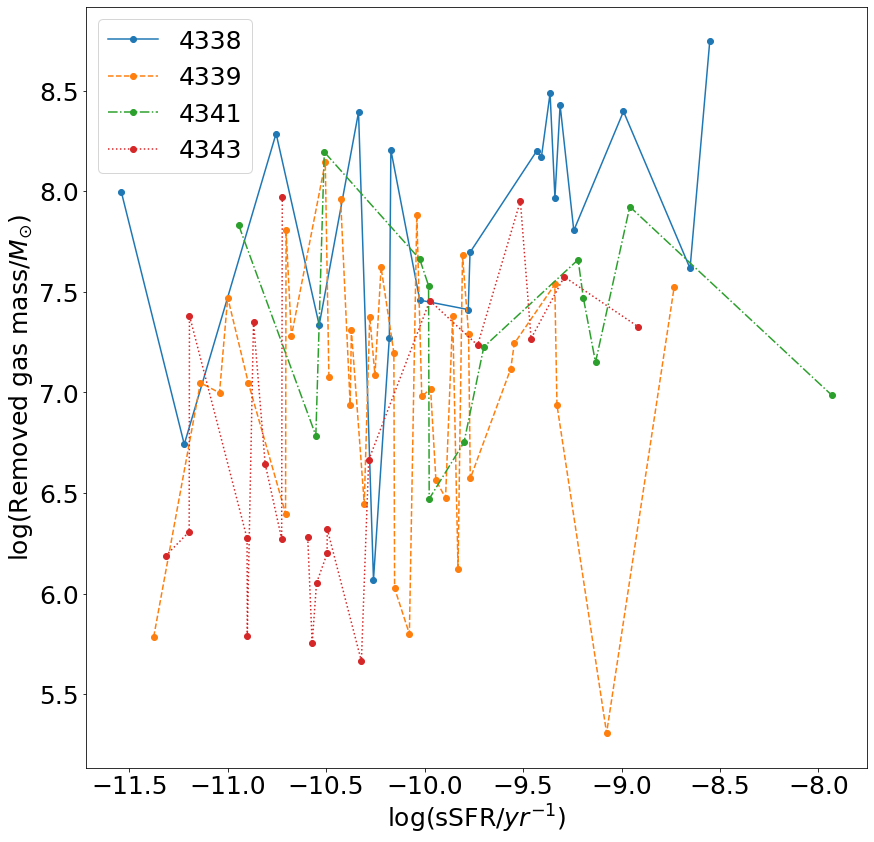

In [101]:
pl.figure(figsize=(14,14))

# now i have to asociate FeH with teh previous sSFR, given or take, without smoothing the thing, not just argsort
# how i do this. just like this

nGas_4338 = Gas_4338[:-1]
nGas_4339 = Gas_4339[:-1]
nGas_4341 = Gas_4341[:-1]
nGas_4343 = Gas_4343[:-1]

nsSFR_4338 = sSFR_4338[1:]
nsSFR_4339 = sSFR_4339[1:]
nsSFR_4341 = sSFR_4341[1:]
nsSFR_4343 = sSFR_4343[1:]

ii_4338 = np.argsort(nsSFR_4338)
ii_4339 = np.argsort(nsSFR_4339)
ii_4341 = np.argsort(nsSFR_4341)
ii_4343 = np.argsort(nsSFR_4343)

pl.plot(np.log10(nsSFR_4338[ii_4338]), np.log10(nGas_4338[ii_4338]), label='4338', marker='o',ls='-')
pl.plot(np.log10(nsSFR_4339[ii_4339]), np.log10(nGas_4339[ii_4339]), label='4339', marker='o',ls='--')
pl.plot(np.log10(nsSFR_4341[ii_4341]), np.log10(nGas_4341[ii_4341]), label='4341', marker='o',ls='-.')
pl.plot(np.log10(nsSFR_4343[ii_4343]), np.log10(nGas_4343[ii_4343]), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

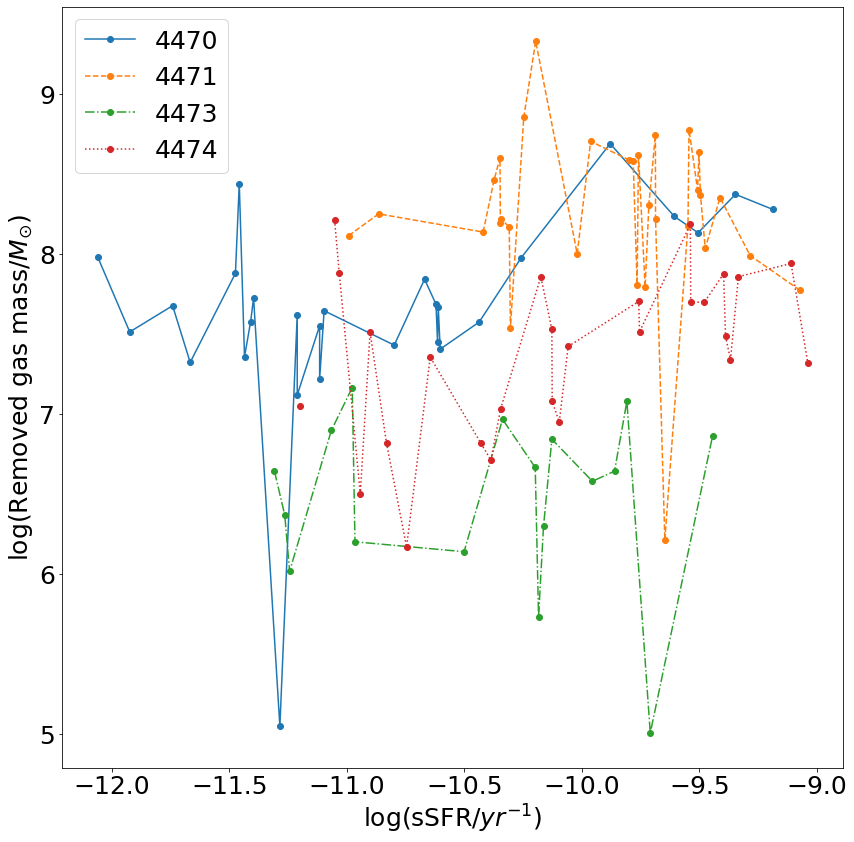

In [102]:
pl.figure(figsize=(14,14))

# now i have to asociate FeH with teh previous sSFR, given or take, without smoothing the thing, not just argsort
# how i do this. just like this

nGas_4470 = Gas_4470[:-1]
nGas_4471 = Gas_4471[:-1]
nGas_4473 = Gas_4473[:-1]
nGas_4474 = Gas_4474[:-1]

nsSFR_4470 = sSFR_4470[1:]
nsSFR_4471 = sSFR_4471[1:]
nsSFR_4473 = sSFR_4473[1:]
nsSFR_4474 = sSFR_4474[1:]

ii_4470 = np.argsort(nsSFR_4470)
ii_4471 = np.argsort(nsSFR_4471)
ii_4473 = np.argsort(nsSFR_4473)
ii_4474 = np.argsort(nsSFR_4474)

pl.plot(np.log10(nsSFR_4470[ii_4470]), np.log10(nGas_4470[ii_4470]), label='4470', marker='o',ls='-')
pl.plot(np.log10(nsSFR_4471[ii_4471]), np.log10(nGas_4471[ii_4471]), label='4471', marker='o',ls='--')
pl.plot(np.log10(nsSFR_4473[ii_4473]), np.log10(nGas_4473[ii_4473]), label='4473', marker='o',ls='-.')
pl.plot(np.log10(nsSFR_4474[ii_4474]), np.log10(nGas_4474[ii_4474]), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

In [103]:
# now let soft the thing, juts as is
# ok, apparently works, so lets do the graphs
n = 3

# just move the sSFR one step back, just that

nGas_4338 = Gas_4338[:-1]
nGas_4339 = Gas_4339[:-1]
nGas_4341 = Gas_4341[:-1]
nGas_4343 = Gas_4343[:-1]

nRP_4338 = RPS_4338[:-1]
nRP_4339 = RPS_4339[:-1]
nRP_4341 = RPS_4341[:-1]
nRP_4343 = RPS_4343[:-1]

nRestForce_4338 = RestForce_4338[:-1]
nRestForce_4339 = RestForce_4339[:-1]
nRestForce_4341 = RestForce_4341[:-1]
nRestForce_4343 = RestForce_4343[:-1]

nFeH_4338 = FeH_4338[:-1]
nFeH_4339 = FeH_4339[:-1]
nFeH_4341 = FeH_4341[:-1]
nFeH_4343 = FeH_4343[:-1]

nOFe_4338 = OFe_4338[:-1]
nOFe_4339 = OFe_4339[:-1]
nOFe_4341 = OFe_4341[:-1]
nOFe_4343 = OFe_4343[:-1]

nsSFR_4338 = sSFR_4338[1:]
nsSFR_4339 = sSFR_4339[1:]
nsSFR_4341 = sSFR_4341[1:]
nsSFR_4343 = sSFR_4343[1:]

##

nGas_4470 = Gas_4470[:-1]
nGas_4471 = Gas_4471[:-1]
nGas_4473 = Gas_4473[:-1]
nGas_4474 = Gas_4474[:-1]

nRP_4470 = RPS_4470[:-1]
nRP_4471 = RPS_4471[:-1]
nRP_4473 = RPS_4473[:-1]
nRP_4474 = RPS_4474[:-1]

nRestForce_4470 = RestForce_4470[:-1]
nRestForce_4471 = RestForce_4471[:-1]
nRestForce_4473 = RestForce_4473[:-1]
nRestForce_4474 = RestForce_4474[:-1]

nFeH_4470 = FeH_4470[:-1]
nFeH_4471 = FeH_4471[:-1]
nFeH_4473 = FeH_4473[:-1]
nFeH_4474 = FeH_4474[:-1]

nOFe_4470 = OFe_4470[:-1]
nOFe_4471 = OFe_4471[:-1]
nOFe_4473 = OFe_4473[:-1]
nOFe_4474 = OFe_4474[:-1]

nsSFR_4470 = sSFR_4470[1:]
nsSFR_4471 = sSFR_4471[1:]
nsSFR_4473 = sSFR_4473[1:]
nsSFR_4474 = sSFR_4474[1:]

nnewsSFR_4338, nnewRP_4338, nnewRPPi_4338, nnewFeH_4338, nnewOFe_4338, nnewMass_4338 = smoother(nsSFR_4338, nRP_4338, nRestForce_4338, nFeH_4338, nOFe_4338, nGas_4338, n)
nnewsSFR_4339, nnewRP_4339, nnewRPPi_4339, nnewFeH_4339, nnewOFe_4339, nnewMass_4339 = smoother(nsSFR_4339, nRP_4339, nRestForce_4339, nFeH_4339, nOFe_4339, nGas_4339, n)
nnewsSFR_4341, nnewRP_4341, nnewRPPi_4341, nnewFeH_4341, nnewOFe_4341, nnewMass_4341 = smoother(nsSFR_4341, nRP_4341, nRestForce_4341, nFeH_4341, nOFe_4341, nGas_4341, n)
nnewsSFR_4343, nnewRP_4343, nnewRPPi_4343, nnewFeH_4343, nnewOFe_4343, nnewMass_4343 = smoother(nsSFR_4343, nRP_4343, nRestForce_4343, nFeH_4343, nOFe_4343, nGas_4343, n)

nnewsSFR_4470, nnewRP_4470, nnewRPPi_4470, nnewFeH_4470, nnewOFe_4470, nnewMass_4470 = smoother(nsSFR_4470, nRP_4470, nRestForce_4470, nFeH_4470, nOFe_4470, nGas_4470, n)
nnewsSFR_4471, nnewRP_4471, nnewRPPi_4471, nnewFeH_4471, nnewOFe_4471, nnewMass_4471 = smoother(nsSFR_4471, nRP_4471, nRestForce_4471, nFeH_4471, nOFe_4471, nGas_4471, n)
nnewsSFR_4473, nnewRP_4473, nnewRPPi_4473, nnewFeH_4473, nnewOFe_4473, nnewMass_4473 = smoother(nsSFR_4473, nRP_4473, nRestForce_4473, nFeH_4473, nOFe_4473, nGas_4473, n)
nnewsSFR_4474, nnewRP_4474, nnewRPPi_4474, nnewFeH_4474, nnewOFe_4474, nnewMass_4474 = smoother(nsSFR_4474, nRP_4474, nRestForce_4474, nFeH_4474, nOFe_4474, nGas_4474, n)

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log10
  if sys.path[0] == '':
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, '[O/Fe]')

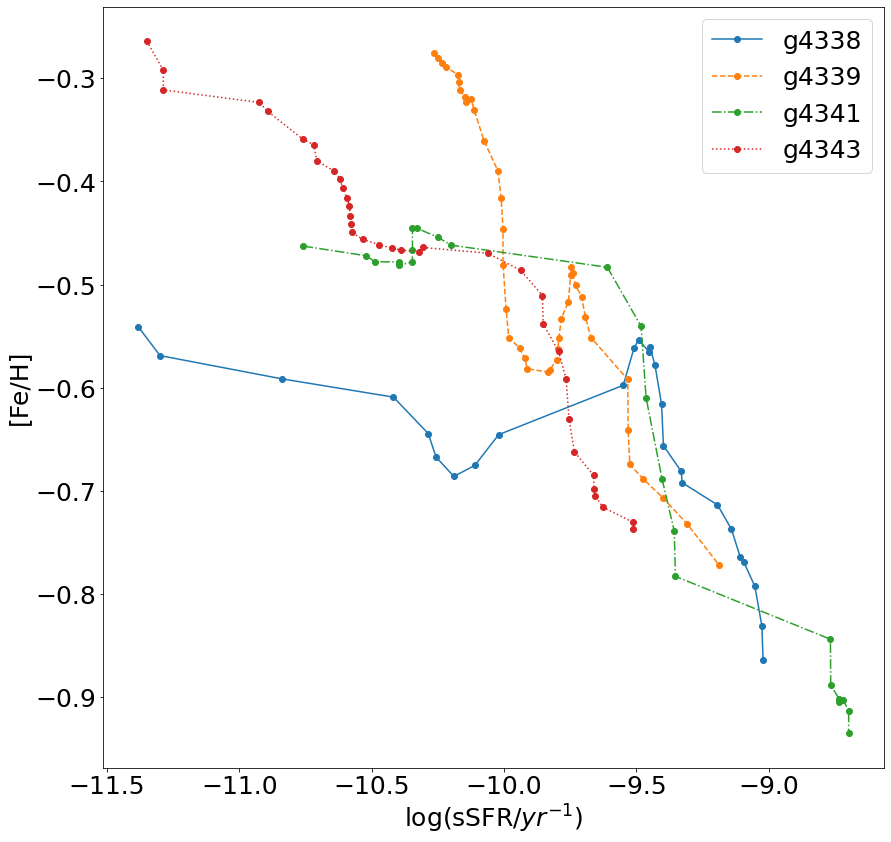

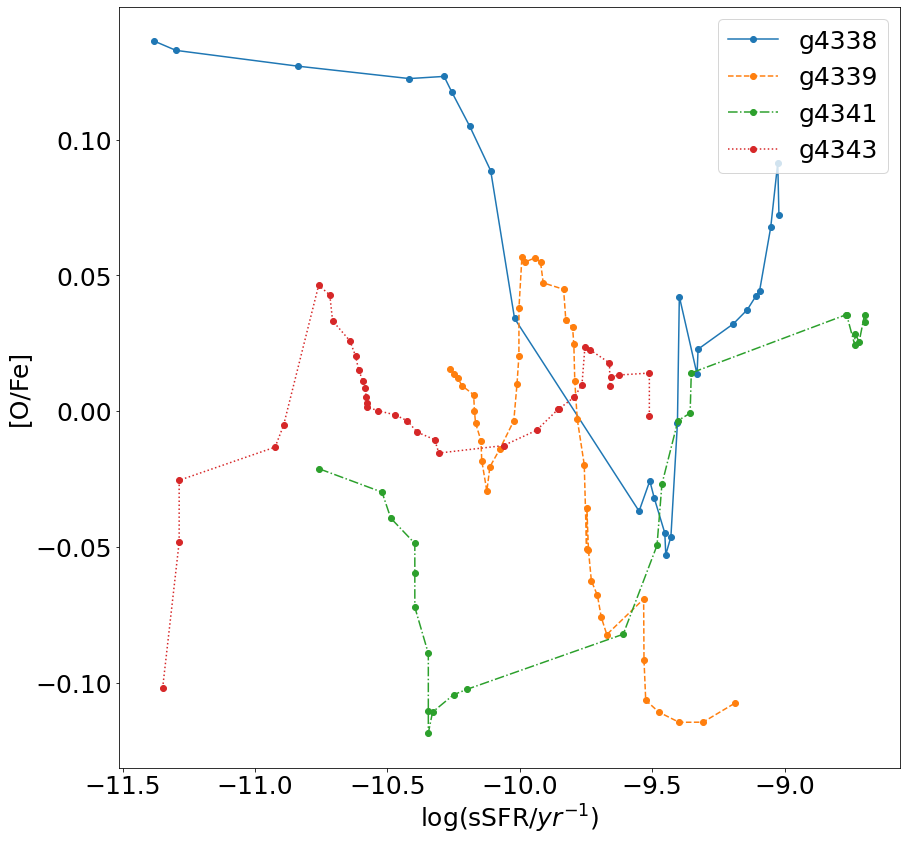

In [104]:
pl.figure(figsize=(14,14))


ii_4338 = np.argsort(nnewsSFR_4338)
ii_4339 = np.argsort(nnewsSFR_4339)
ii_4341 = np.argsort(nnewsSFR_4341)
ii_4343 = np.argsort(nnewsSFR_4343)

pl.plot(np.log10(nnewsSFR_4338[ii_4338]), nnewFeH_4338, label='g4338', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4339[ii_4339]), nnewFeH_4339, label='g4339', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4341[ii_4341]), nnewFeH_4341, label='g4341', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4343[ii_4343]), nnewFeH_4343, label='g4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(nnewsSFR_4338[ii_4338]), nnewOFe_4338, label='g4338', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4339[ii_4339]), nnewOFe_4339, label='g4339', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4341[ii_4341]), nnewOFe_4341, label='g4341', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4343[ii_4343]), nnewOFe_4343, label='g4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

Text(0, 0.5, '[O/Fe]')

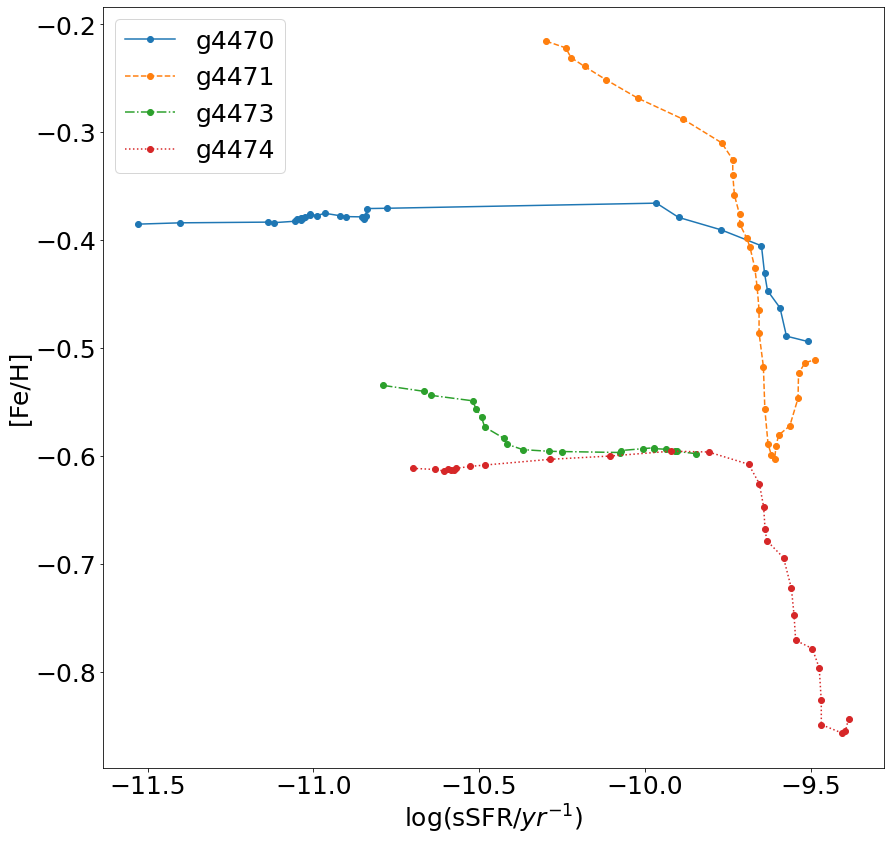

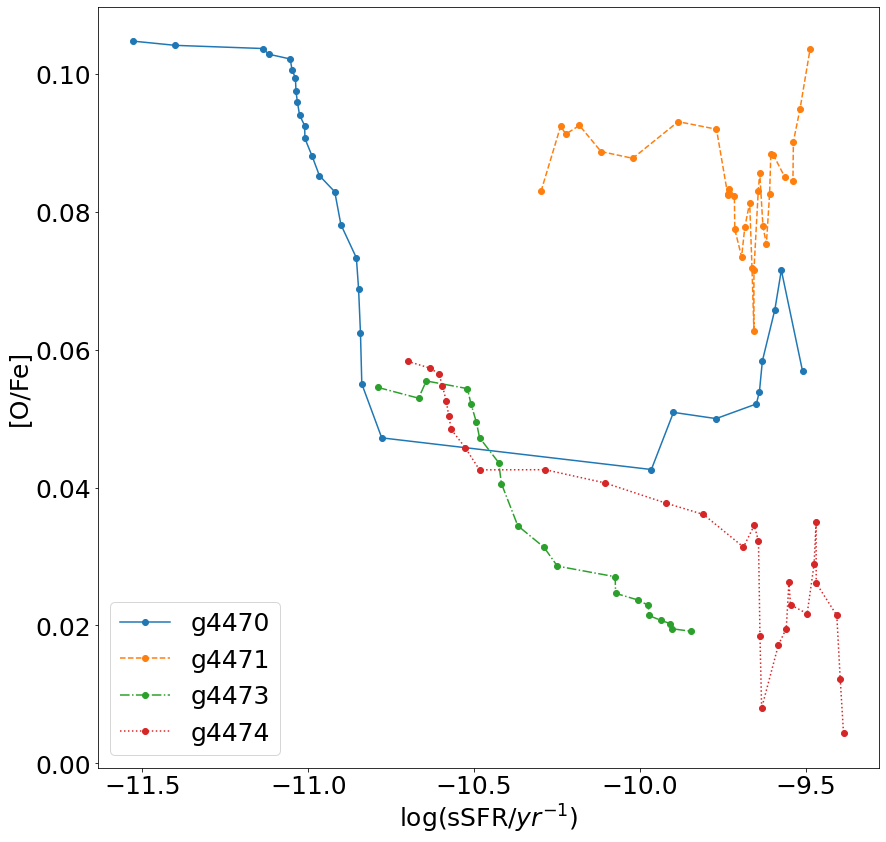

In [105]:
pl.figure(figsize=(14,14))


ii_4470 = np.argsort(nnewsSFR_4470)
ii_4471 = np.argsort(nnewsSFR_4471)
ii_4473 = np.argsort(nnewsSFR_4473)
ii_4474 = np.argsort(nnewsSFR_4474)

pl.plot(np.log10(nnewsSFR_4470[ii_4470]), nnewFeH_4470, label='g4470', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4471[ii_4471]), nnewFeH_4471, label='g4471', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4473[ii_4473]), nnewFeH_4473, label='g4473', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4474[ii_4474]), nnewFeH_4474, label='g4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(nnewsSFR_4470[ii_4470]), nnewOFe_4470, label='g4470', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4471[ii_4471]), nnewOFe_4471, label='g4471', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4473[ii_4473]), nnewOFe_4473, label='g4473', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4474[ii_4474]), nnewOFe_4474, label='g4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('[O/Fe]')

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()


Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

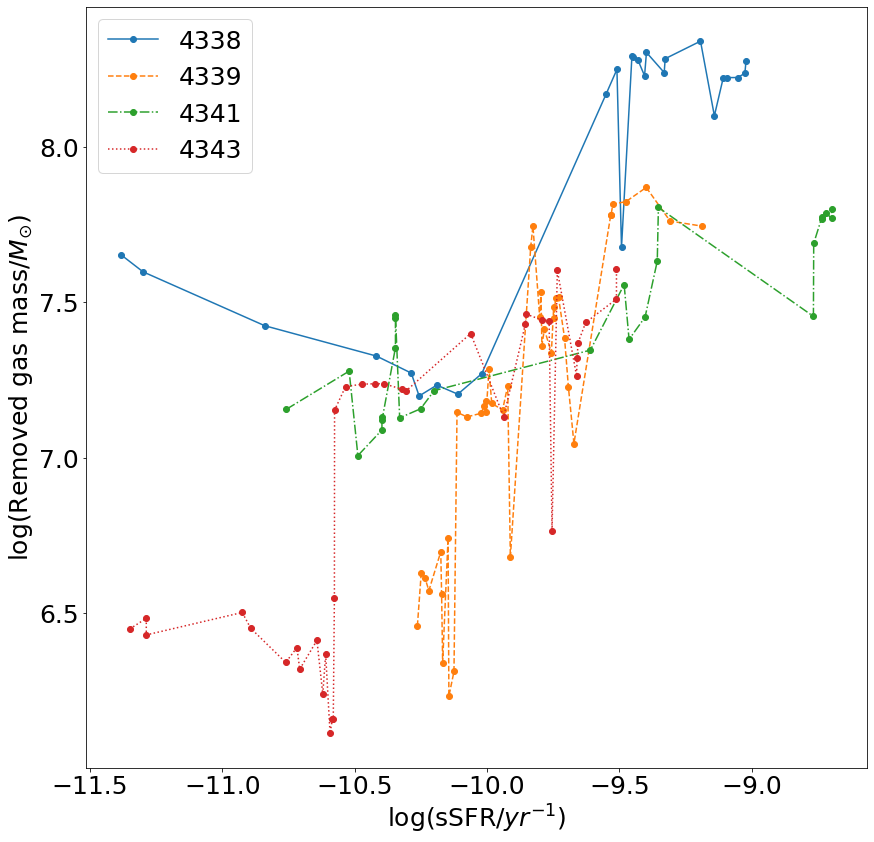

In [106]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(nnewsSFR_4338)
ii_4339 = np.argsort(nnewsSFR_4339)
ii_4341 = np.argsort(nnewsSFR_4341)
ii_4343 = np.argsort(nnewsSFR_4343)

pl.plot(np.log10(nnewsSFR_4338[ii_4338]), np.log10(nnewMass_4338[ii_4338]), label='4338', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4339[ii_4339]), np.log10(nnewMass_4339[ii_4339]), label='4339', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4341[ii_4341]), np.log10(nnewMass_4341[ii_4341]), label='4341', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4343[ii_4343]), np.log10(nnewMass_4343[ii_4343]), label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

Text(0, 0.5, '$\\log($Removed gas mass$/M_{\\odot})$')

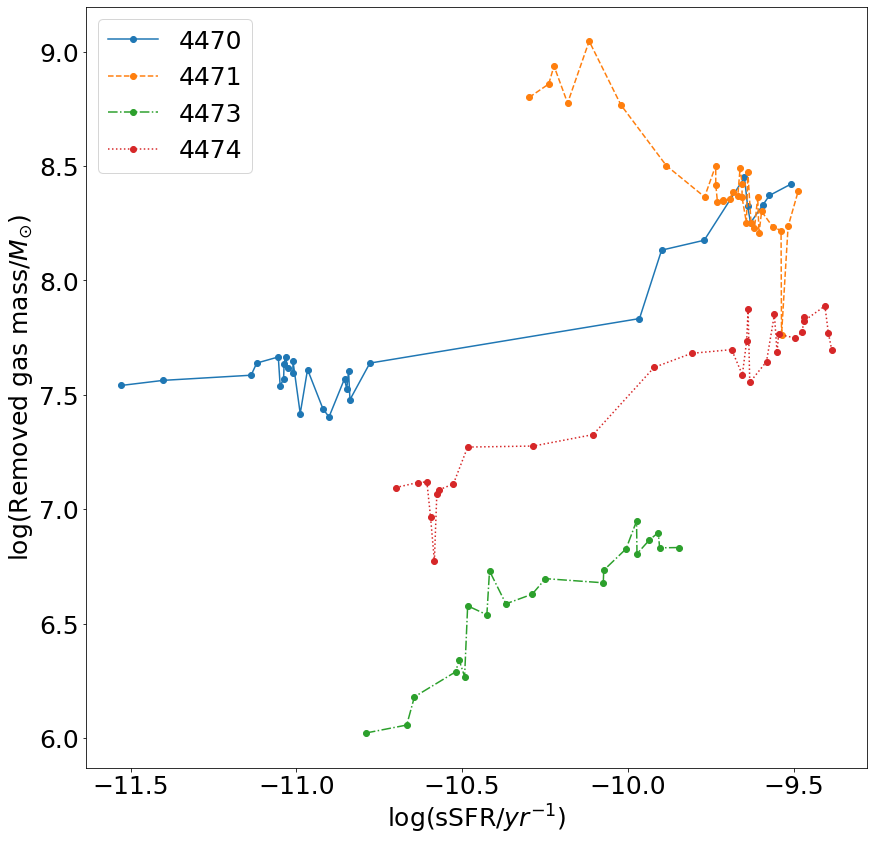

In [107]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(nnewsSFR_4470)
ii_4471 = np.argsort(nnewsSFR_4471)
ii_4473 = np.argsort(nnewsSFR_4473)
ii_4474 = np.argsort(nnewsSFR_4474)

pl.plot(np.log10(nnewsSFR_4470[ii_4470]), np.log10(nnewMass_4470[ii_4470]), label='4470', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4471[ii_4471]), np.log10(nnewMass_4471[ii_4471]), label='4471', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4473[ii_4473]), np.log10(nnewMass_4473[ii_4473]), label='4473', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4474[ii_4474]), np.log10(nnewMass_4474[ii_4474]), label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('$\log($Removed gas mass$/M_{\odot})$')

In [108]:
# now let soft the thing, juts as is
# ok, apparently works, so lets do the graphs
n = 3

# just move the sSFR one step back, just that

nFeHlo_4338 = FeHlo_4338[:-1]
nFeHlo_4339 = FeHlo_4339[:-1]
nFeHlo_4341 = FeHlo_4341[:-1]
nFeHlo_4343 = FeHlo_4343[:-1]

nOFelo_4338 = OFelo_4338[:-1]
nOFelo_4339 = OFelo_4339[:-1]
nOFelo_4341 = OFelo_4341[:-1]
nOFelo_4343 = OFelo_4343[:-1]

##

nFeHlo_4470 = FeHlo_4470[:-1]
nFeHlo_4471 = FeHlo_4471[:-1]
nFeHlo_4473 = FeHlo_4473[:-1]
nFeHlo_4474 = FeHlo_4474[:-1]

nOFelo_4470 = OFelo_4470[:-1]
nOFelo_4471 = OFelo_4471[:-1]
nOFelo_4473 = OFelo_4473[:-1]
nOFelo_4474 = OFelo_4474[:-1]

nnewsSFR_4338, nnewRP_4338, nnewRPPi_4338, nnewFeHlo_4338, nnewOFelo_4338, nnewMass_4338 = smoother(nsSFR_4338, nRP_4338, nRestForce_4338, nFeHlo_4338, nOFelo_4338, nGas_4338, n)
nnewsSFR_4339, nnewRP_4339, nnewRPPi_4339, nnewFeHlo_4339, nnewOFelo_4339, nnewMass_4339 = smoother(nsSFR_4339, nRP_4339, nRestForce_4339, nFeHlo_4339, nOFelo_4339, nGas_4339, n)
nnewsSFR_4341, nnewRP_4341, nnewRPPi_4341, nnewFeHlo_4341, nnewOFelo_4341, nnewMass_4341 = smoother(nsSFR_4341, nRP_4341, nRestForce_4341, nFeHlo_4341, nOFelo_4341, nGas_4341, n)
nnewsSFR_4343, nnewRP_4343, nnewRPPi_4343, nnewFeHlo_4343, nnewOFelo_4343, nnewMass_4343 = smoother(nsSFR_4343, nRP_4343, nRestForce_4343, nFeHlo_4343, nOFelo_4343, nGas_4343, n)

nnewsSFR_4470, nnewRP_4470, nnewRPPi_4470, nnewFeHlo_4470, nnewOFelo_4470, nnewMass_4470 = smoother(nsSFR_4470, nRP_4470, nRestForce_4470, nFeHlo_4470, nOFelo_4470, nGas_4470, n)
nnewsSFR_4471, nnewRP_4471, nnewRPPi_4471, nnewFeHlo_4471, nnewOFelo_4471, nnewMass_4471 = smoother(nsSFR_4471, nRP_4471, nRestForce_4471, nFeHlo_4471, nOFelo_4471, nGas_4471, n)
nnewsSFR_4473, nnewRP_4473, nnewRPPi_4473, nnewFeHlo_4473, nnewOFelo_4473, nnewMass_4473 = smoother(nsSFR_4473, nRP_4473, nRestForce_4473, nFeHlo_4473, nOFelo_4473, nGas_4473, n)
nnewsSFR_4474, nnewRP_4474, nnewRPPi_4474, nnewFeHlo_4474, nnewOFelo_4474, nnewMass_4474 = smoother(nsSFR_4474, nRP_4474, nRestForce_4474, nFeHlo_4474, nOFelo_4474, nGas_4474, n)

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, 'lost [O/Fe]')

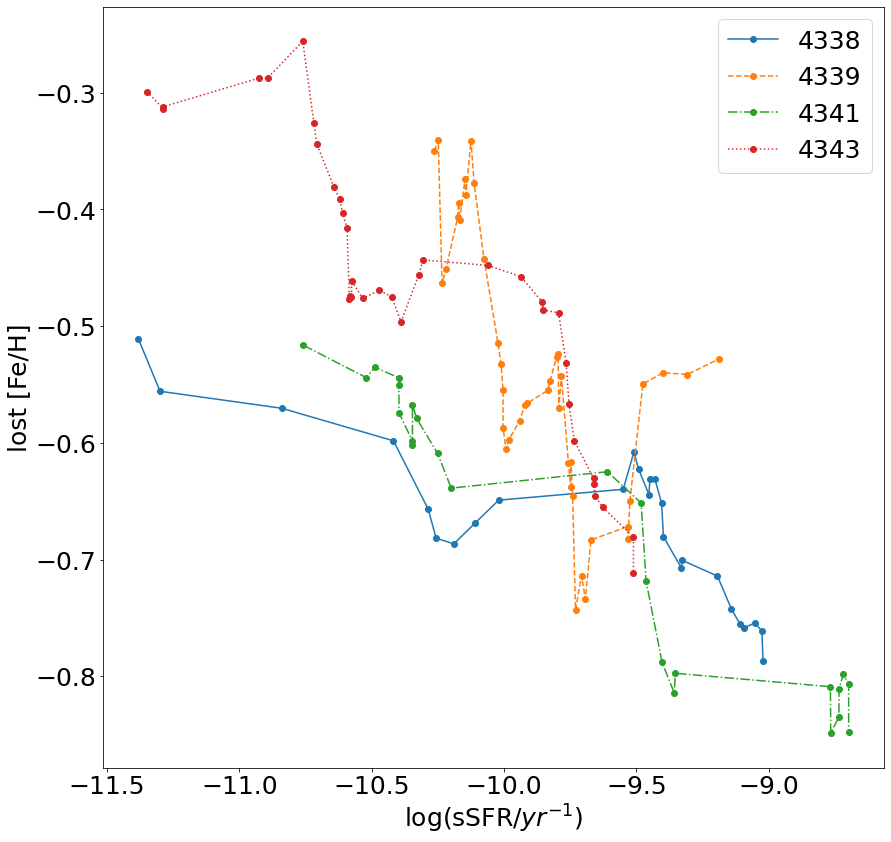

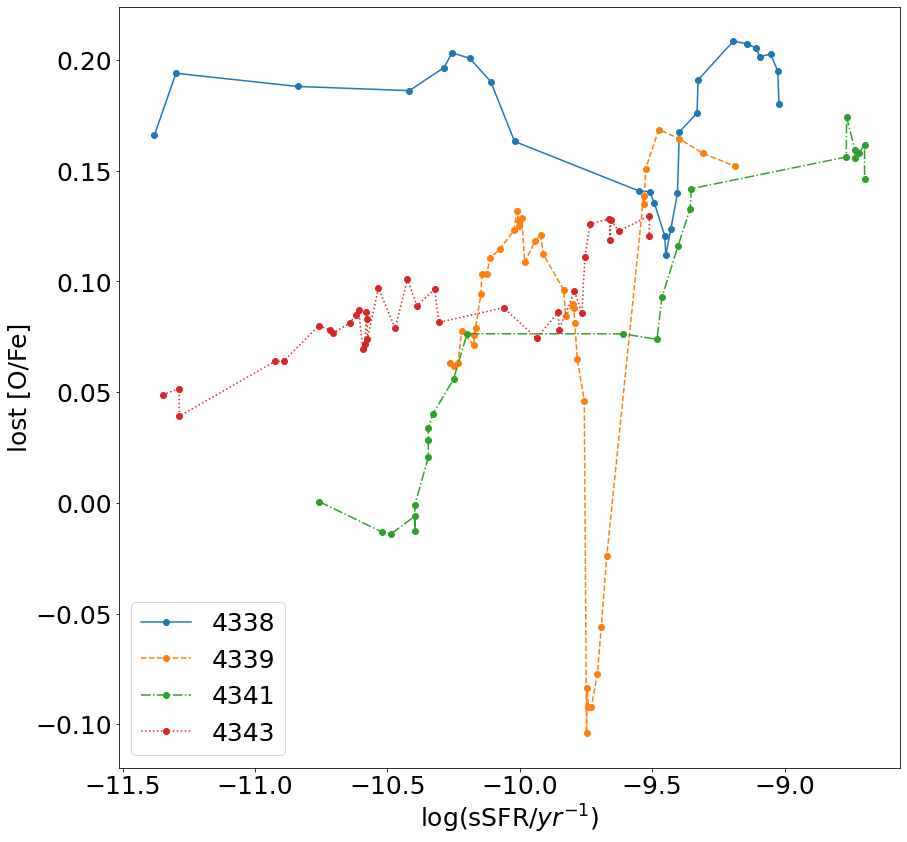

In [109]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(nnewsSFR_4338)
ii_4339 = np.argsort(nnewsSFR_4339)
ii_4341 = np.argsort(nnewsSFR_4341)
ii_4343 = np.argsort(nnewsSFR_4343)

pl.plot(np.log10(nnewsSFR_4338[ii_4338]), nnewFeHlo_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4339[ii_4339]), nnewFeHlo_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4341[ii_4341]), nnewFeHlo_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4343[ii_4343]), nnewFeHlo_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(nnewsSFR_4338[ii_4338]), nnewOFelo_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4339[ii_4339]), nnewOFelo_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4341[ii_4341]), nnewOFelo_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4343[ii_4343]), nnewOFelo_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [O/Fe]')

Text(0, 0.5, 'lost [O/Fe]')

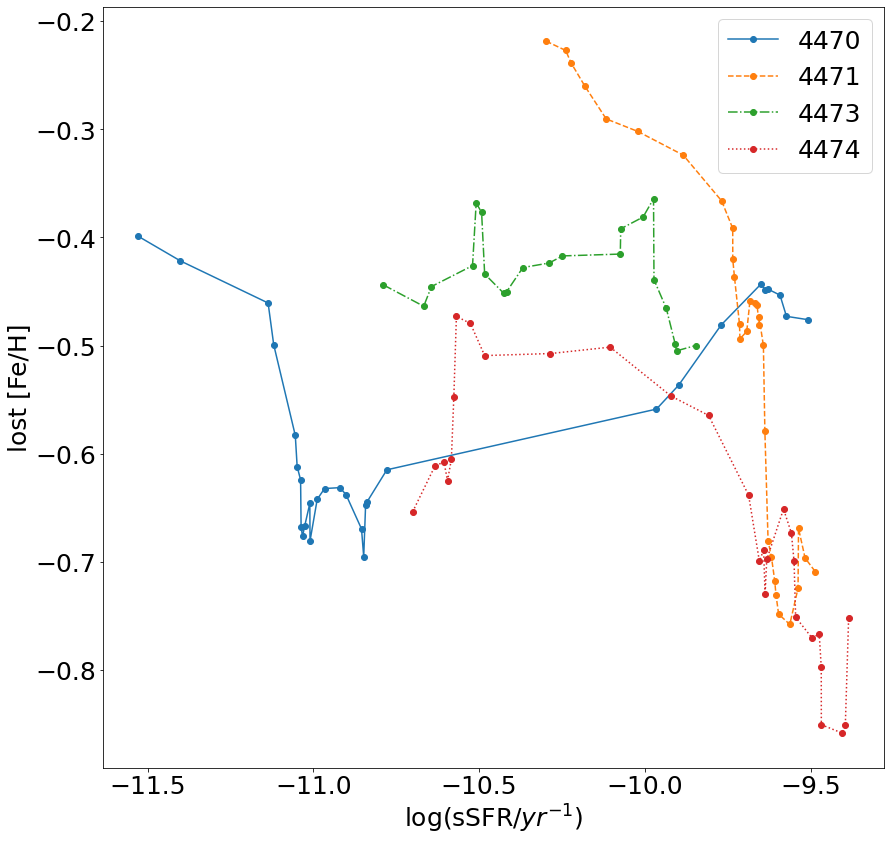

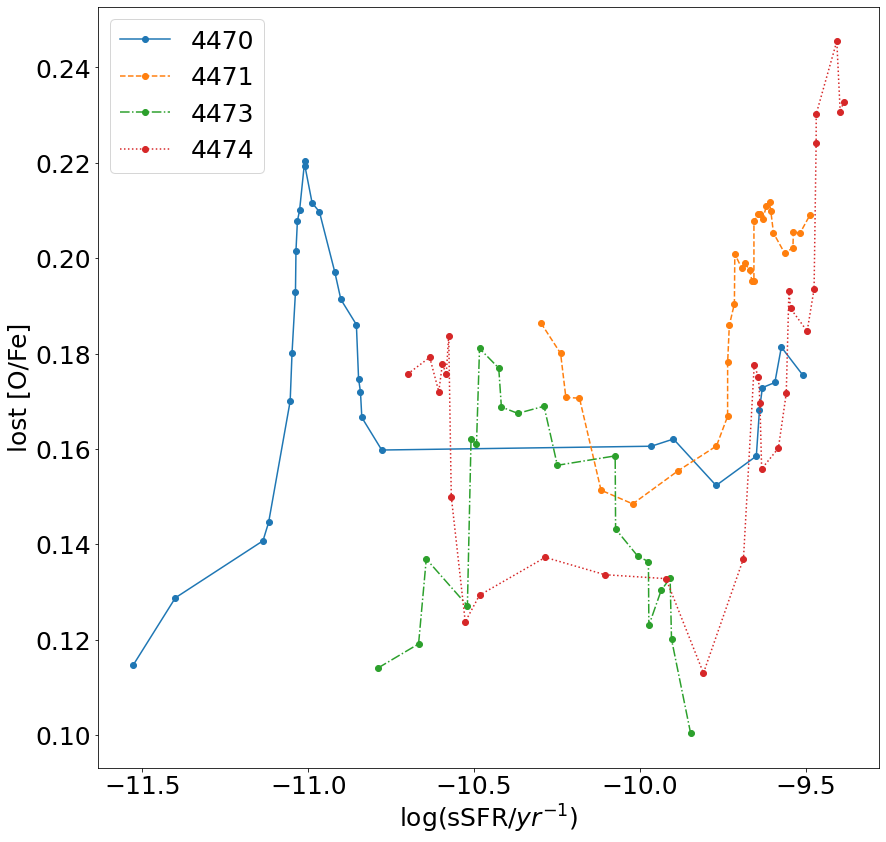

In [110]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(nnewsSFR_4470)
ii_4471 = np.argsort(nnewsSFR_4471)
ii_4473 = np.argsort(nnewsSFR_4473)
ii_4474 = np.argsort(nnewsSFR_4474)

pl.plot(np.log10(nnewsSFR_4470[ii_4470]), nnewFeHlo_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4471[ii_4471]), nnewFeHlo_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4473[ii_4473]), nnewFeHlo_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4474[ii_4474]), nnewFeHlo_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(nnewsSFR_4470[ii_4470]), nnewOFelo_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(nnewsSFR_4471[ii_4471]), nnewOFelo_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(nnewsSFR_4473[ii_4473]), nnewOFelo_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(nnewsSFR_4474[ii_4474]), nnewOFelo_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [O/Fe]')

In [111]:
n = 3

newsSFR_4338, newRP_4338, newRPPi_4338, newFeHlo_4338, newOFelo_4338, newMass_4338 = smoother(sSFR_4338, RPS_4338, RestForce_4338, FeHlo_4338, OFelo_4338, Gas_4338, n)
newsSFR_4339, newRP_4339, newRPPi_4339, newFeHlo_4339, newOFelo_4339, newMass_4339 = smoother(sSFR_4339, RPS_4339, RestForce_4339, FeHlo_4339, OFelo_4339, Gas_4339, n)
newsSFR_4341, newRP_4341, newRPPi_4341, newFeHlo_4341, newOFelo_4341, newMass_4341 = smoother(sSFR_4341, RPS_4341, RestForce_4341, FeHlo_4341, OFelo_4341, Gas_4341, n)
newsSFR_4343, newRP_4343, newRPPi_4343, newFeHlo_4343, newOFelo_4343, newMass_4343 = smoother(sSFR_4343, RPS_4343, RestForce_4343, FeHlo_4343, OFelo_4343, Gas_4343, n)

newsSFR_4470, newRP_4470, newRPPi_4470, newFeHlo_4470, newOFelo_4470, newMass_4470 = smoother(sSFR_4470, RPS_4470, RestForce_4470, FeHlo_4470, OFelo_4470, Gas_4470, n)
newsSFR_4471, newRP_4471, newRPPi_4471, newFeHlo_4471, newOFelo_4471, newMass_4471 = smoother(sSFR_4471, RPS_4471, RestForce_4471, FeHlo_4471, OFelo_4471, Gas_4471, n)
newsSFR_4473, newRP_4473, newRPPi_4473, newFeHlo_4473, newOFelo_4473, newMass_4473 = smoother(sSFR_4473, RPS_4473, RestForce_4473, FeHlo_4473, OFelo_4473, Gas_4473, n)
newsSFR_4474, newRP_4474, newRPPi_4474, newFeHlo_4474, newOFelo_4474, newMass_4474 = smoother(sSFR_4474, RPS_4474, RestForce_4474, FeHlo_4474, OFelo_4474, Gas_4474, n)

/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/home/srodriguez/miniconda3/envs/cielo_old/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


Text(0, 0.5, 'lost [O/Fe]')

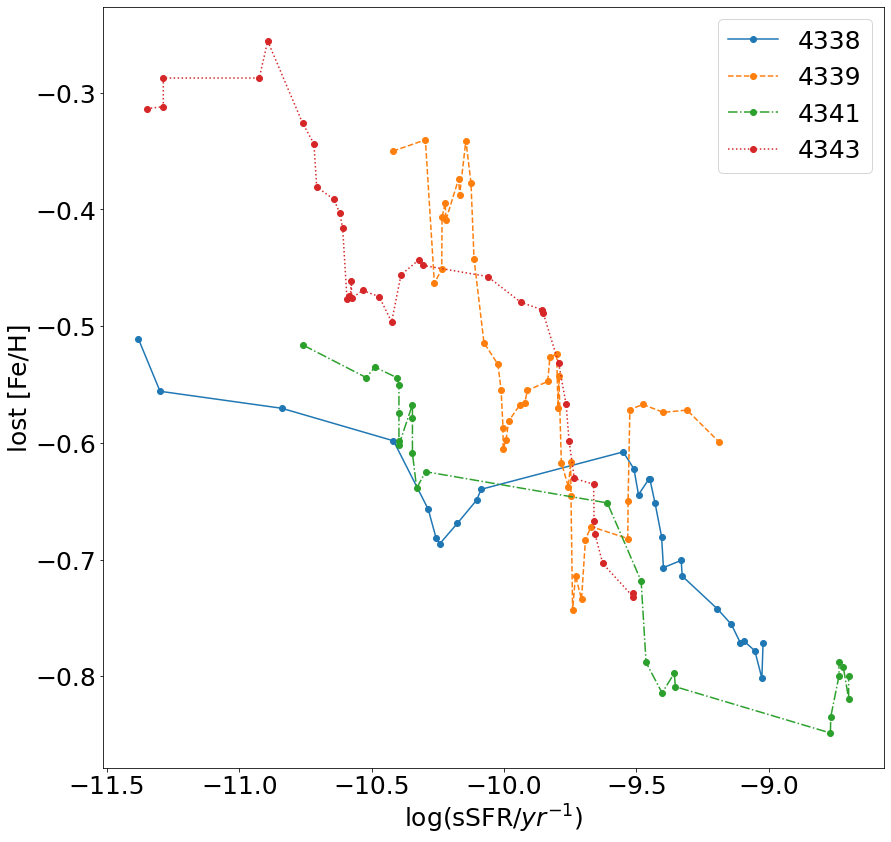

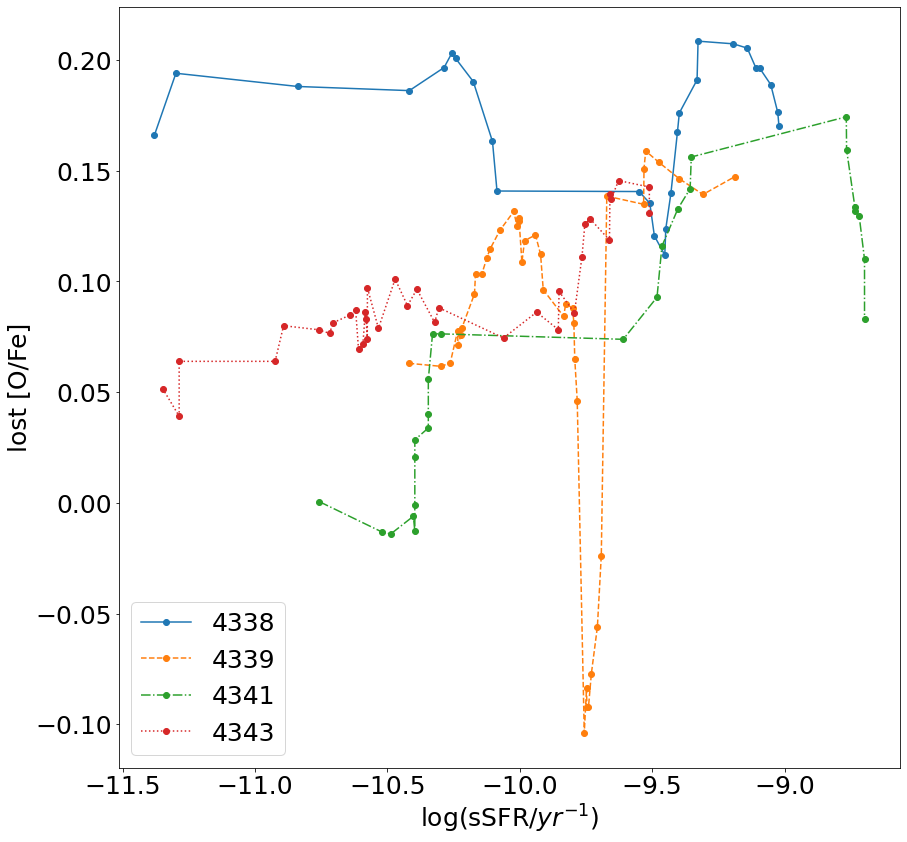

In [112]:
pl.figure(figsize=(14,14))

ii_4338 = np.argsort(newsSFR_4338)
ii_4339 = np.argsort(newsSFR_4339)
ii_4341 = np.argsort(newsSFR_4341)
ii_4343 = np.argsort(newsSFR_4343)

pl.plot(np.log10(newsSFR_4338[ii_4338]), newFeHlo_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4339[ii_4339]), newFeHlo_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4341[ii_4341]), newFeHlo_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4343[ii_4343]), newFeHlo_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(newsSFR_4338[ii_4338]), newOFelo_4338, label='4338', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4339[ii_4339]), newOFelo_4339, label='4339', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4341[ii_4341]), newOFelo_4341, label='4341', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4343[ii_4343]), newOFelo_4343, label='4343', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [O/Fe]')

Text(0, 0.5, 'lost [O/Fe]')

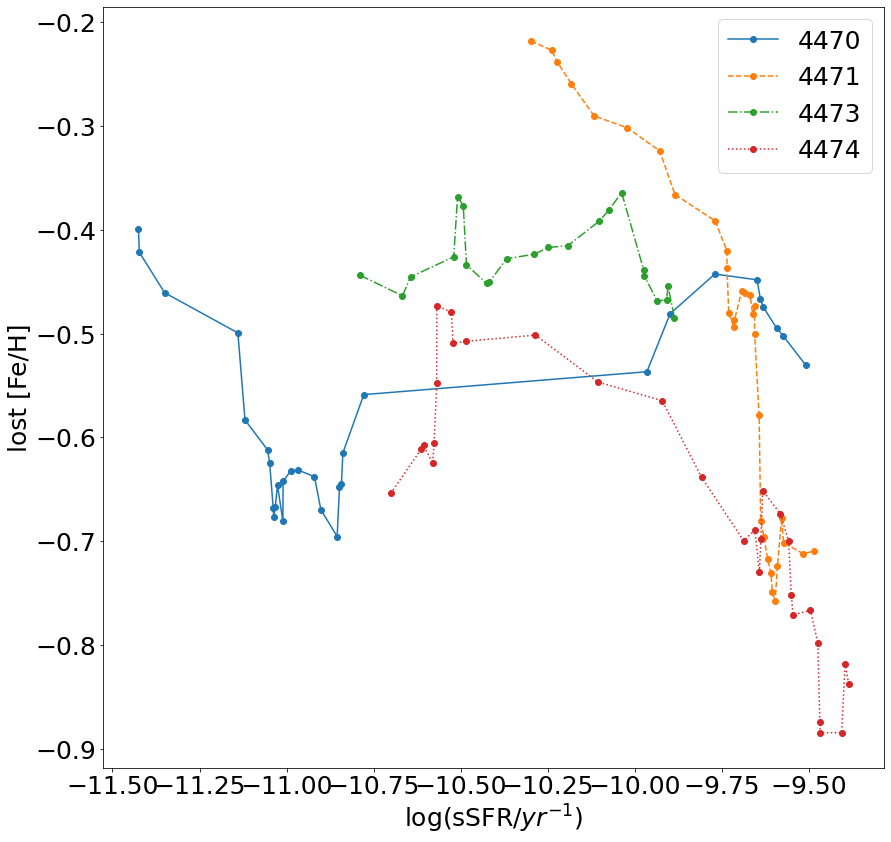

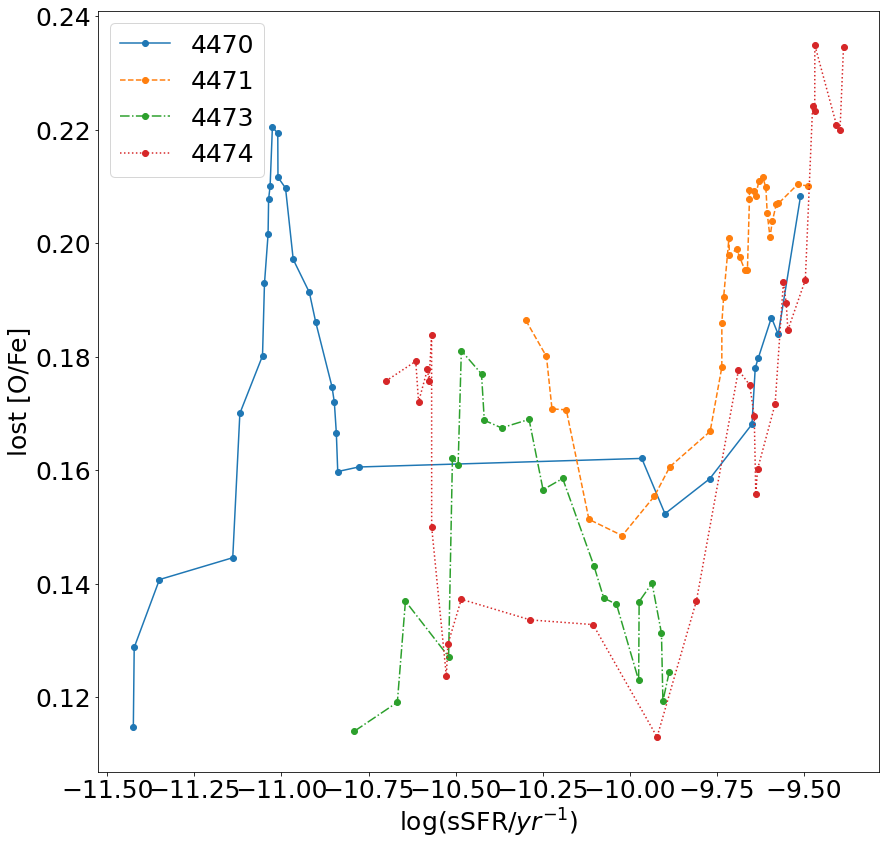

In [113]:
pl.figure(figsize=(14,14))

ii_4470 = np.argsort(newsSFR_4470)
ii_4471 = np.argsort(newsSFR_4471)
ii_4473 = np.argsort(newsSFR_4473)
ii_4474 = np.argsort(newsSFR_4474)

pl.plot(np.log10(newsSFR_4470[ii_4470]), newFeHlo_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4471[ii_4471]), newFeHlo_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4473[ii_4473]), newFeHlo_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4474[ii_4474]), newFeHlo_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [Fe/H]')

pl.figure(figsize=(14,14))

pl.plot(np.log10(newsSFR_4470[ii_4470]), newOFelo_4470, label='4470', marker='o',ls='-')
pl.plot(np.log10(newsSFR_4471[ii_4471]), newOFelo_4471, label='4471', marker='o',ls='--')
pl.plot(np.log10(newsSFR_4473[ii_4473]), newOFelo_4473, label='4473', marker='o',ls='-.')
pl.plot(np.log10(newsSFR_4474[ii_4474]), newOFelo_4474, label='4474', marker='o',ls=':')

pl.legend(loc='best')

pl.xlabel('$\log($sSFR$/yr^{-1})$')
pl.ylabel('lost [O/Fe]')

In [114]:
sSFR_4338.min(), sSFR_4338.max()

(0.0, 2.8044182936575538e-09)

In [115]:
sim['SnapNumber_128/Groups/Group_R_Crit200'].attrs['description']

'Comoving Radius of a sphere centered at this Group whose mean density is 200 times the critical density of the Universe, at the time the halo is considered'